In [1]:
import os, shutil
import tensorflow as tf
from tensorflow import keras
from keras.preprocessing.image import ImageDataGenerator
from keras import layers
from keras import models
from keras import optimizers
from tensorflow.keras.optimizers import Adam
from keras.preprocessing import image
import numpy as np
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import mlflow
import mlflow.tensorflow
from PIL import Image
import re

In [2]:
def to_grayscale_then_rgb(image):
    image = tf.image.rgb_to_grayscale(image)
    image = tf.image.grayscale_to_rgb(image)
    return image

# DataGen

In [3]:
from keras.preprocessing.image import ImageDataGenerator

# datagen_rgb = ImageDataGenerator ( 
#         rescale=1./255,
# )


datagen_rgb = ImageDataGenerator ( 
        rescale=1./255,
        rotation_range=10,  # randomly rotate images 
        zoom_range=0.1,  # Randomly zoom image
        width_shift_range=0.1,  # randomly shift images horizontally 
        height_shift_range=0.1,  # randomly shift images vertically 
        horizontal_flip=True,  # randomly flip images horizontally
        vertical_flip=False
        ,validation_split=0.1
)

datagen_grayscale = ImageDataGenerator ( 
        rescale=1./255,
        rotation_range=10,  # randomly rotate images 
        zoom_range=0.1,  # Randomly zoom image
        width_shift_range=0.1,  # randomly shift images horizontally 
        height_shift_range=0.1,  # randomly shift images vertically 
        horizontal_flip=True,  # randomly flip images horizontally
        vertical_flip=False,
        validation_split=0.1,
        preprocessing_function=to_grayscale_then_rgb
)

test_datagen_grayscale = ImageDataGenerator ( 
        rescale=1./255,
        rotation_range=10,  # randomly rotate images 
        zoom_range=0.1,  # Randomly zoom image
        width_shift_range=0.1,  # randomly shift images horizontally 
        height_shift_range=0.1,  # randomly shift images vertically 
        horizontal_flip=True,  # randomly flip images horizontally
        vertical_flip=False,
        preprocessing_function=to_grayscale_then_rgb
)

# Folders and transform data

In [4]:
DATA_SETS=[
    #["C:/Users/USUARIO/Desktop/MLFlowTesting/Enfermedades Cacao2","NO_NOISE_DATA_SET"]
    #,["C:/Users/USUARIO/Desktop/MLFlowTesting/Imagenes_sin_filtro","ORIGINAL_DATA_SET"]
    #,["C:/Users/USUARIO/Desktop/MLFlowTesting/Imagenes_Binario","BINARY_DATA_SET"]
    #["C:/Users/USUARIO/Desktop/MLFlowTesting/Imagenes/1_SanoVsFito","SanoVsFito_NO_NOISE"]
    #,["C:/Users/USUARIO/Desktop/MLFlowTesting/Imagenes/1_SanoVsMonoEF","SanoVsMonoEF_NO_NOISE"]
    #,["C:/Users/USUARIO/Desktop/MLFlowTesting/Imagenes/1_SanoVsMonoInter","SanoVsMonoInter_NO_NOISE"]
    #,["C:/Users/USUARIO/Desktop/MLFlowTesting/Imagenes/1_SanoVsMazorca","SanoVsMazorca_NO_NOISE"]
    ["C:/Users/USUARIO\Desktop/MLFlowTesting/Imagenes/2_SanoVsFito","SanoVsFito"]
    ,["C:/Users/USUARIO/Desktop/MLFlowTesting/Imagenes para experimentos/Mazorca_SF","Mazorca_SF"]
    ,["C:/Users/USUARIO/Desktop/MLFlowTesting/Imagenes para experimentos/Monoliosis EF_SF","Monoliosis EF_SF"]
    ,["C:/Users/USUARIO/Desktop/MLFlowTesting/Imagenes para experimentos/Monoliosis_Intermedia_SF","Monoliosis_Intermedia_SF"]
]
#filters=[datagen_rgb,datagen_grayscale]
#filters_name=["rgb","grayscale"]
filters=[datagen_grayscale]
filters_name=["grayscale"]

t_data=[]

for data_sets in DATA_SETS:
    for f,f_name in zip(filters,filters_name):
        path=data_sets[0]
        data_set_name=data_sets[1]
        labels = os.listdir(path+'/train')
        train_dir=path+"/train"
        test_dir=path+"/test"
        tg = f.flow_from_directory(directory=train_dir, target_size=(300,300), classes=labels, batch_size=16, subset='training')
        vg = f.flow_from_directory(directory=train_dir, target_size=(300,300), classes=labels, batch_size=16, subset='validation')
        test_gen=test_datagen_grayscale.flow_from_directory(directory=test_dir, target_size=(300,300), classes=labels, batch_size=16, subset='training')
        t_data.append([tg,vg,labels,f_name,data_set_name,test_gen])

Found 297 images belonging to 2 classes.
Found 32 images belonging to 2 classes.
Found 20 images belonging to 2 classes.
Found 327 images belonging to 2 classes.
Found 35 images belonging to 2 classes.
Found 20 images belonging to 2 classes.
Found 327 images belonging to 2 classes.
Found 35 images belonging to 2 classes.
Found 20 images belonging to 2 classes.
Found 302 images belonging to 2 classes.
Found 32 images belonging to 2 classes.
Found 20 images belonging to 2 classes.


In [5]:
for index, val in enumerate(t_data, start=1):
    print(index, val)

1 [<keras.preprocessing.image.DirectoryIterator object at 0x000001FB5AD0CF40>, <keras.preprocessing.image.DirectoryIterator object at 0x000001FB5B308E80>, ['Fito', 'Sanos'], 'grayscale', 'SanoVsFito', <keras.preprocessing.image.DirectoryIterator object at 0x000001FB214CECD0>]
2 [<keras.preprocessing.image.DirectoryIterator object at 0x000001FB5B308D00>, <keras.preprocessing.image.DirectoryIterator object at 0x000001FB5B3085E0>, ['Mazorca_Negra', 'Sanos'], 'grayscale', 'Mazorca_SF', <keras.preprocessing.image.DirectoryIterator object at 0x000001FB5B308EB0>]
3 [<keras.preprocessing.image.DirectoryIterator object at 0x000001FB5B319940>, <keras.preprocessing.image.DirectoryIterator object at 0x000001FB5B319670>, ['Monoliasis_EF', 'Sanos'], 'grayscale', 'Monoliosis EF_SF', <keras.preprocessing.image.DirectoryIterator object at 0x000001FB5B3191C0>]
4 [<keras.preprocessing.image.DirectoryIterator object at 0x000001FB5B3198B0>, <keras.preprocessing.image.DirectoryIterator object at 0x000001FB5

# Pool Modelos

In [8]:
def model_selector(model_name,labels,n_neurons,drop_out):
    if model_name=="cnn":
        model = models.Sequential()
        model.add(layers.Conv2D(32, (3, 3), activation='relu',input_shape=(300, 300, 3)))
        model.add(layers.MaxPooling2D((2, 2)))
        model.add(layers.Conv2D(64, (3, 3), activation='relu'))
        model.add(layers.MaxPooling2D((2, 2)))
        model.add(layers.Conv2D(128, (3, 3), activation='relu'))
        model.add(layers.MaxPooling2D((2, 2)))
        model.add(layers.Flatten())
        model.add(layers.Dense(128, activation='relu'))
        model.add(layers.Dropout(drop_out, input_shape=(128,)))
        model.add(layers.Dense(128, activation='relu'))
        model.add(layers.Dropout(drop_out, input_shape=(128,)))
        model.add(layers.Dense(len(labels), activation='softmax'))
        model.compile(optimizer='adam', loss = 'categorical_crossentropy', metrics=['accuracy', 
                        tf.keras.metrics.Precision(),
                        tf.keras.metrics.Recall()])
        return model
    elif model_name=="vgg16":
        model = keras.applications.VGG16(
        weights='imagenet',
        input_shape=(300, 300, 3),
        include_top=False
        )
        model.trainable = False
        inputs = keras.Input(shape=(300, 300, 3))
        x = model(inputs, training=False)
        #pooling layer 
        x = keras.layers.GlobalAveragePooling2D()(x)
        x = keras.layers.Dense(n_neurons, activation = 'softmax')(x)
        x = keras.layers.Dropout(drop_out, input_shape=(n_neurons,))(x)
        #final dense layer
        outputs = keras.layers.Dense(len(labels), activation = 'softmax')(x)
        model = keras.Model(inputs,outputs)
        model.compile(optimizer='adam', loss = 'categorical_crossentropy', metrics=['accuracy', 
                        tf.keras.metrics.Precision(),
                        tf.keras.metrics.Recall()])
        return model
    elif model_name=="vgg19":
        model = keras.applications.VGG19(
        weights='imagenet',
        input_shape=(300, 300, 3),
        include_top=False
        )
        model.trainable = False
        inputs = keras.Input(shape=(300, 300, 3))
        x = model(inputs, training=False)
        #pooling layer 
        x = keras.layers.GlobalAveragePooling2D()(x)
        x = keras.layers.Dense(n_neurons, activation = 'softmax')(x)
        x = keras.layers.Dropout(drop_out, input_shape=(n_neurons,))(x)
        #final dense layer
        outputs = keras.layers.Dense(len(labels), activation = 'softmax')(x)
        model = keras.Model(inputs,outputs)
        model.compile(optimizer='adam', loss = 'categorical_crossentropy', metrics=['accuracy', 
                        tf.keras.metrics.Precision(),
                        tf.keras.metrics.Recall()])
        return model
    elif model_name=="xception":
        model = keras.applications.Xception(
        weights='imagenet',
        input_shape=(300, 300, 3),
        include_top=False
        )
        model.trainable = False
        inputs = keras.Input(shape=(300, 300, 3))
        x = model(inputs, training=False)
        #pooling layer 
        x = keras.layers.GlobalAveragePooling2D()(x)
        x = keras.layers.Dense(n_neurons, activation = 'softmax')(x)
        x = keras.layers.Dropout(drop_out, input_shape=(n_neurons,))(x)
        #final dense layer
        outputs = keras.layers.Dense(len(labels), activation = 'softmax')(x)
        model = keras.Model(inputs,outputs)
        model.compile(optimizer='adam', loss = 'categorical_crossentropy', metrics=['accuracy', 
                        tf.keras.metrics.Precision(),
                        tf.keras.metrics.Recall()])
        return model
    elif model_name=="ResNet50":
        model = keras.applications.ResNet50(
        weights='imagenet',
        input_shape=(300, 300, 3),
        include_top=False
        )
        model.trainable = False
        inputs = keras.Input(shape=(300, 300, 3))
        x = model(inputs, training=False)
        #pooling layer 
        x = keras.layers.GlobalAveragePooling2D()(x)
        x = keras.layers.Dense(n_neurons, activation = 'softmax')(x)
        x = keras.layers.Dropout(drop_out, input_shape=(n_neurons,))(x)
        #final dense layer
        outputs = keras.layers.Dense(len(labels), activation = 'softmax')(x)
        model = keras.Model(inputs,outputs)
        model.compile(optimizer='adam', loss = 'categorical_crossentropy', metrics=['accuracy', 
                        tf.keras.metrics.Precision(),
                        tf.keras.metrics.Recall()])
        return model
    elif model_name=="MobileNet":
        model = keras.applications.MobileNet(
        weights='imagenet',
        input_shape=(300, 300, 3),
        include_top=False
        )
        model.trainable = False
        inputs = keras.Input(shape=(300, 300, 3))
        x = model(inputs, training=False)
        #pooling layer 
        x = keras.layers.GlobalAveragePooling2D()(x)
        x = keras.layers.Dense(n_neurons, activation = 'softmax')(x)
        x = keras.layers.Dropout(drop_out, input_shape=(n_neurons,))(x)
        #final dense layer
        outputs = keras.layers.Dense(len(labels), activation = 'softmax')(x)
        model = keras.Model(inputs,outputs)
        model.compile(optimizer='adam', loss = 'categorical_crossentropy', metrics=['accuracy', 
                        tf.keras.metrics.Precision(),
                        tf.keras.metrics.Recall()])
        return model
    elif model_name=="ConvNeXtLarge":
        model = tf.keras.applications.convnext.ConvNeXtXLarge(
        weights='imagenet',
        input_shape=(300, 300, 3),
        include_top=False
        )
        model.trainable = False
        inputs = keras.Input(shape=(300, 300, 3))
        x = model(inputs, training=False)
        #pooling layer 
        x = keras.layers.GlobalAveragePooling2D()(x)
        x = keras.layers.Dense(n_neurons, activation = 'softmax')(x)
        x = keras.layers.Dropout(drop_out, input_shape=(n_neurons,))(x)
        #final dense layer
        outputs = keras.layers.Dense(len(labels), activation = 'softmax')(x)
        model = keras.Model(inputs,outputs)
        model.compile(optimizer='adam', loss = 'categorical_crossentropy', metrics=['accuracy', 
                        tf.keras.metrics.Precision(),
                        tf.keras.metrics.Recall()])
        return model
    elif model_name=="EfficientNetV2L":
        model = keras.applications.EfficientNetV2L(
        weights='imagenet',
        input_shape=(300, 300, 3),
        include_top=False
        )
        model.trainable = False
        inputs = keras.Input(shape=(300, 300, 3))
        x = model(inputs, training=False)
        #pooling layer 
        x = keras.layers.GlobalAveragePooling2D()(x)
        x = keras.layers.Dense(n_neurons, activation = 'softmax')(x)
        x = keras.layers.Dropout(drop_out, input_shape=(n_neurons,))(x)
        #final dense layer
        outputs = keras.layers.Dense(len(labels), activation = 'softmax')(x)
        model = keras.Model(inputs,outputs)
        model.compile(optimizer='adam', loss = 'categorical_crossentropy', metrics=['accuracy', 
                        tf.keras.metrics.Precision(),
                        tf.keras.metrics.Recall()])
        return model

# ML FLow Exec

xception

2023/03/02 23:15:54 INFO mlflow.tracking.fluent: Experiment with name 'xception grayscale SanoVsFito dropout 0.1 n_neurons 16 epochs 100' does not exist. Creating a new experiment.


83683744/83683744 [==============================] - 2s 0us/step
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6345 - accuracy: 0.6801 - precision: 0.6801 - recall: 0.6801
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 18s 624ms/step - loss: 0.6345 - accuracy: 0.6801 - precision: 0.6801 - recall: 0.6801 - val_loss: 0.6166 - val_accuracy: 0.6875 - val_precision: 0.6875 - val_recall: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6054 - accuracy: 0.6869 - precision: 0.6869 - recall: 0.6869
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 475ms/step - loss: 0.6054 - accuracy: 0.6869 - precision: 0.6869 - recall: 0.6869 - val_loss: 0.5950 - val_accuracy: 0.6875 - val_precision: 0.6875 - val_recall: 0.6875
Epoch 3/100
19/19 [==============================] - ETA: 0s - loss: 0.5888 - accuracy: 0.6869 - precisio

2023/03/02 23:30:33 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/02 23:30:33 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpdubhf85j\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpdubhf85j\model\data\model\assets
2023/03/02 23:31:04 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "c:\Users\USUARIO\anaconda3\envs\gpu_env\lib\site-packages\_distutils_hack\__init__.py:33: UserWarning: Setuptools is replacing distutils."


2/2 [==============================] - 1s 324ms/step - loss: 0.2881 - accuracy: 1.0000 - precision: 1.0000 - recall: 1.0000


2023/03/02 23:31:08 INFO mlflow.tracking.fluent: Experiment with name 'xception grayscale Mazorca_SF dropout 0.1 n_neurons 16 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6652 - accuracy: 0.5749 - precision_1: 0.5749 - recall_1: 0.5749
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 14s 584ms/step - loss: 0.6652 - accuracy: 0.5749 - precision_1: 0.5749 - recall_1: 0.5749 - val_loss: 0.6346 - val_accuracy: 0.6286 - val_precision_1: 0.6286 - val_recall_1: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6001 - accuracy: 0.6483 - precision_1: 0.6483 - recall_1: 0.6483
Epoch 2: val_accuracy improved from 0.62857 to 0.68571, saving model to callbacks\model.h5
21/21 [==============================] - 9s 451ms/step - loss: 0.6001 - accuracy: 0.6483 - precision_1: 0.6483 - recall_1: 0.6483 - val_loss: 0.5645 - val_accuracy: 0.6857 - val_precision_1: 0.6857 - val_recall_1: 0.6857
Epoch 3/100
21/21 [==============================] - ETA: 0s - loss: 0.5445 - accuracy: 0.7431 - precision

2023/03/02 23:45:26 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/02 23:45:26 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp87x1h0c4\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp87x1h0c4\model\data\model\assets


2/2 [==============================] - 0s 98ms/step - loss: 0.3749 - accuracy: 0.9000 - precision_1: 0.9000 - recall_1: 0.9000


2023/03/02 23:45:54 INFO mlflow.tracking.fluent: Experiment with name 'xception grayscale Monoliosis EF_SF dropout 0.1 n_neurons 16 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6680 - accuracy: 0.5780 - precision_2: 0.5780 - recall_2: 0.5780
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 15s 592ms/step - loss: 0.6680 - accuracy: 0.5780 - precision_2: 0.5780 - recall_2: 0.5780 - val_loss: 0.6398 - val_accuracy: 0.6286 - val_precision_2: 0.6286 - val_recall_2: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6007 - accuracy: 0.7584 - precision_2: 0.7584 - recall_2: 0.7584
Epoch 2: val_accuracy improved from 0.62857 to 0.77143, saving model to callbacks\model.h5
21/21 [==============================] - 10s 467ms/step - loss: 0.6007 - accuracy: 0.7584 - precision_2: 0.7584 - recall_2: 0.7584 - val_loss: 0.5689 - val_accuracy: 0.7714 - val_precision_2: 0.7714 - val_recall_2: 0.7714
Epoch 3/100
21/21 [==============================] - ETA: 0s - loss: 0.5214 - accuracy: 0.8991 - precisio

2023/03/03 00:00:42 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/03 00:00:42 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpz4abvw3j\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpz4abvw3j\model\data\model\assets


2/2 [==============================] - 0s 78ms/step - loss: 0.0698 - accuracy: 1.0000 - precision_2: 1.0000 - recall_2: 1.0000


2023/03/03 00:01:07 INFO mlflow.tracking.fluent: Experiment with name 'xception grayscale Monoliosis_Intermedia_SF dropout 0.1 n_neurons 16 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6435 - accuracy: 0.6623 - precision_3: 0.6623 - recall_3: 0.6623
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 14s 646ms/step - loss: 0.6435 - accuracy: 0.6623 - precision_3: 0.6623 - recall_3: 0.6623 - val_loss: 0.6127 - val_accuracy: 0.6875 - val_precision_3: 0.6875 - val_recall_3: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.5891 - accuracy: 0.7185 - precision_3: 0.7185 - recall_3: 0.7185
Epoch 2: val_accuracy improved from 0.68750 to 0.75000, saving model to callbacks\model.h5
19/19 [==============================] - 9s 494ms/step - loss: 0.5891 - accuracy: 0.7185 - precision_3: 0.7185 - recall_3: 0.7185 - val_loss: 0.5702 - val_accuracy: 0.7500 - val_precision_3: 0.7500 - val_recall_3: 0.7500
Epoch 3/100
19/19 [==============================] - ETA: 0s - loss: 0.5482 - accuracy: 0.8212 - precision

2023/03/03 00:15:24 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/03 00:15:24 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpfuc9ie57\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpfuc9ie57\model\data\model\assets


2/2 [==============================] - 0s 82ms/step - loss: 0.2657 - accuracy: 1.0000 - precision_3: 1.0000 - recall_3: 1.0000


2023/03/03 00:15:50 INFO mlflow.tracking.fluent: Experiment with name 'xception grayscale SanoVsFito dropout 0.5 n_neurons 16 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6591 - accuracy: 0.5926 - precision_4: 0.5926 - recall_4: 0.5926
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 14s 641ms/step - loss: 0.6591 - accuracy: 0.5926 - precision_4: 0.5926 - recall_4: 0.5926 - val_loss: 0.6279 - val_accuracy: 0.6875 - val_precision_4: 0.6875 - val_recall_4: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6279 - accuracy: 0.6902 - precision_4: 0.6902 - recall_4: 0.6902
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 452ms/step - loss: 0.6279 - accuracy: 0.6902 - precision_4: 0.6902 - recall_4: 0.6902 - val_loss: 0.6050 - val_accuracy: 0.6875 - val_precision_4: 0.6875 - val_recall_4: 0.6875
Epoch 3/100
19/19 [==============================] - ETA: 0s - loss: 0.5974 - accuracy: 0.6869 - precision_4: 0.6869 - recall_4: 0.6869
Epoch 3: v

2023/03/03 00:30:19 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/03 00:30:19 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpg0ki1m0n\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpg0ki1m0n\model\data\model\assets


2/2 [==============================] - 1s 117ms/step - loss: 0.4491 - accuracy: 0.9500 - precision_4: 0.9500 - recall_4: 0.9500


2023/03/03 00:30:48 INFO mlflow.tracking.fluent: Experiment with name 'xception grayscale Mazorca_SF dropout 0.5 n_neurons 16 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6618 - accuracy: 0.6024 - precision_5: 0.6024 - recall_5: 0.6024
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 15s 600ms/step - loss: 0.6618 - accuracy: 0.6024 - precision_5: 0.6024 - recall_5: 0.6024 - val_loss: 0.6212 - val_accuracy: 0.6286 - val_precision_5: 0.6286 - val_recall_5: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6378 - accuracy: 0.6453 - precision_5: 0.6453 - recall_5: 0.6453
Epoch 2: val_accuracy improved from 0.62857 to 0.85714, saving model to callbacks\model.h5
21/21 [==============================] - 9s 437ms/step - loss: 0.6378 - accuracy: 0.6453 - precision_5: 0.6453 - recall_5: 0.6453 - val_loss: 0.5968 - val_accuracy: 0.8571 - val_precision_5: 0.8571 - val_recall_5: 0.8571
Epoch 3/100
21/21 [==============================] - ETA: 0s - loss: 0.5951 - accuracy: 0.7309 - precision

2023/03/03 00:44:55 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/03 00:44:55 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp_6648w1w\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp_6648w1w\model\data\model\assets


2/2 [==============================] - 0s 72ms/step - loss: 0.3552 - accuracy: 1.0000 - precision_5: 1.0000 - recall_5: 1.0000


2023/03/03 00:45:19 INFO mlflow.tracking.fluent: Experiment with name 'xception grayscale Monoliosis EF_SF dropout 0.5 n_neurons 16 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6566 - accuracy: 0.6636 - precision_6: 0.6636 - recall_6: 0.6636
Epoch 1: val_accuracy improved from -inf to 0.68571, saving model to callbacks\model.h5
21/21 [==============================] - 14s 580ms/step - loss: 0.6566 - accuracy: 0.6636 - precision_6: 0.6636 - recall_6: 0.6636 - val_loss: 0.6330 - val_accuracy: 0.6857 - val_precision_6: 0.6857 - val_recall_6: 0.6857
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6059 - accuracy: 0.7370 - precision_6: 0.7370 - recall_6: 0.7370
Epoch 2: val_accuracy improved from 0.68571 to 0.77143, saving model to callbacks\model.h5
21/21 [==============================] - 9s 431ms/step - loss: 0.6059 - accuracy: 0.7370 - precision_6: 0.7370 - recall_6: 0.7370 - val_loss: 0.5848 - val_accuracy: 0.7714 - val_precision_6: 0.7714 - val_recall_6: 0.7714
Epoch 3/100
21/21 [==============================] - ETA: 0s - loss: 0.5693 - accuracy: 0.7217 - precision

2023/03/03 00:59:34 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/03 00:59:34 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpiib1cmlr\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpiib1cmlr\model\data\model\assets


2/2 [==============================] - 0s 83ms/step - loss: 0.0889 - accuracy: 1.0000 - precision_6: 1.0000 - recall_6: 1.0000


2023/03/03 00:59:57 INFO mlflow.tracking.fluent: Experiment with name 'xception grayscale Monoliosis_Intermedia_SF dropout 0.5 n_neurons 16 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6779 - accuracy: 0.5629 - precision_7: 0.5629 - recall_7: 0.5629
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 14s 619ms/step - loss: 0.6779 - accuracy: 0.5629 - precision_7: 0.5629 - recall_7: 0.5629 - val_loss: 0.6238 - val_accuracy: 0.6875 - val_precision_7: 0.6875 - val_recall_7: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6158 - accuracy: 0.6821 - precision_7: 0.6821 - recall_7: 0.6821
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 8s 430ms/step - loss: 0.6158 - accuracy: 0.6821 - precision_7: 0.6821 - recall_7: 0.6821 - val_loss: 0.5620 - val_accuracy: 0.6875 - val_precision_7: 0.6875 - val_recall_7: 0.6875
Epoch 3/100
19/19 [==============================] - ETA: 0s - loss: 0.5955 - accuracy: 0.7351 - precision_7: 0.7351 - recall_7: 0.7351
Epoch 3: v

2023/03/03 01:14:02 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/03 01:14:02 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmphxp5c232\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmphxp5c232\model\data\model\assets


2/2 [==============================] - 0s 82ms/step - loss: 0.1358 - accuracy: 1.0000 - precision_7: 1.0000 - recall_7: 1.0000


2023/03/03 01:14:27 INFO mlflow.tracking.fluent: Experiment with name 'xception grayscale SanoVsFito dropout 0.1 n_neurons 64 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6593 - accuracy: 0.6566 - precision_8: 0.6566 - recall_8: 0.6566
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 13s 559ms/step - loss: 0.6593 - accuracy: 0.6566 - precision_8: 0.6566 - recall_8: 0.6566 - val_loss: 0.6344 - val_accuracy: 0.6875 - val_precision_8: 0.6875 - val_recall_8: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6273 - accuracy: 0.6869 - precision_8: 0.6869 - recall_8: 0.6869
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 439ms/step - loss: 0.6273 - accuracy: 0.6869 - precision_8: 0.6869 - recall_8: 0.6869 - val_loss: 0.6220 - val_accuracy: 0.6875 - val_precision_8: 0.6875 - val_recall_8: 0.6875
Epoch 3/100
19/19 [==============================] - ETA: 0s - loss: 0.6135 - accuracy: 0.6869 - precision_8: 0.6869 - recall_8: 0.6869
Epoch 3: v

2023/03/03 01:28:43 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/03 01:28:43 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpdbh_lcu9\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpdbh_lcu9\model\data\model\assets


2/2 [==============================] - 1s 88ms/step - loss: 0.3034 - accuracy: 1.0000 - precision_8: 1.0000 - recall_8: 1.0000


2023/03/03 01:29:15 INFO mlflow.tracking.fluent: Experiment with name 'xception grayscale Mazorca_SF dropout 0.1 n_neurons 64 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6694 - accuracy: 0.6239 - precision_9: 0.6239 - recall_9: 0.6239
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 16s 636ms/step - loss: 0.6694 - accuracy: 0.6239 - precision_9: 0.6239 - recall_9: 0.6239 - val_loss: 0.6530 - val_accuracy: 0.6286 - val_precision_9: 0.6286 - val_recall_9: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6428 - accuracy: 0.6239 - precision_9: 0.6239 - recall_9: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 9s 416ms/step - loss: 0.6428 - accuracy: 0.6239 - precision_9: 0.6239 - recall_9: 0.6239 - val_loss: 0.6219 - val_accuracy: 0.6286 - val_precision_9: 0.6286 - val_recall_9: 0.6286
Epoch 3/100
21/21 [==============================] - ETA: 0s - loss: 0.6097 - accuracy: 0.7217 - precision_9: 0.7217 - recall_9: 0.7217
Epoch 3: v

2023/03/03 01:43:25 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/03 01:43:25 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp93a78hxc\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp93a78hxc\model\data\model\assets


2/2 [==============================] - 0s 72ms/step - loss: 0.2795 - accuracy: 1.0000 - precision_9: 1.0000 - recall_9: 1.0000


2023/03/03 01:43:48 INFO mlflow.tracking.fluent: Experiment with name 'xception grayscale Monoliosis EF_SF dropout 0.1 n_neurons 64 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6660 - accuracy: 0.6391 - precision_10: 0.6391 - recall_10: 0.6391
Epoch 1: val_accuracy improved from -inf to 0.71429, saving model to callbacks\model.h5
21/21 [==============================] - 13s 523ms/step - loss: 0.6660 - accuracy: 0.6391 - precision_10: 0.6391 - recall_10: 0.6391 - val_loss: 0.6357 - val_accuracy: 0.7143 - val_precision_10: 0.7143 - val_recall_10: 0.7143
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.5898 - accuracy: 0.8563 - precision_10: 0.8563 - recall_10: 0.8563
Epoch 2: val_accuracy improved from 0.71429 to 0.74286, saving model to callbacks\model.h5
21/21 [==============================] - 10s 459ms/step - loss: 0.5898 - accuracy: 0.8563 - precision_10: 0.8563 - recall_10: 0.8563 - val_loss: 0.5811 - val_accuracy: 0.7429 - val_precision_10: 0.7429 - val_recall_10: 0.7429
Epoch 3/100
21/21 [==============================] - ETA: 0s - loss: 0.5337 - accuracy: 0.908

2023/03/03 01:58:17 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/03 01:58:17 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpevtc6njs\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpevtc6njs\model\data\model\assets


2/2 [==============================] - 0s 87ms/step - loss: 0.0769 - accuracy: 1.0000 - precision_10: 1.0000 - recall_10: 1.0000


2023/03/03 01:58:41 INFO mlflow.tracking.fluent: Experiment with name 'xception grayscale Monoliosis_Intermedia_SF dropout 0.1 n_neurons 64 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6604 - accuracy: 0.6523 - precision_11: 0.6523 - recall_11: 0.6523
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 12s 546ms/step - loss: 0.6604 - accuracy: 0.6523 - precision_11: 0.6523 - recall_11: 0.6523 - val_loss: 0.6315 - val_accuracy: 0.6875 - val_precision_11: 0.6875 - val_recall_11: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6209 - accuracy: 0.6755 - precision_11: 0.6755 - recall_11: 0.6755
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 452ms/step - loss: 0.6209 - accuracy: 0.6755 - precision_11: 0.6755 - recall_11: 0.6755 - val_loss: 0.6065 - val_accuracy: 0.6875 - val_precision_11: 0.6875 - val_recall_11: 0.6875
Epoch 3/100
19/19 [==============================] - ETA: 0s - loss: 0.5845 - accuracy: 0.6987 - precision_11: 0.6987 - recall_11: 0.6

2023/03/03 02:12:52 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/03 02:12:52 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpx10tr0re\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpx10tr0re\model\data\model\assets


2/2 [==============================] - 0s 89ms/step - loss: 0.3057 - accuracy: 1.0000 - precision_11: 1.0000 - recall_11: 1.0000


2023/03/03 02:13:16 INFO mlflow.tracking.fluent: Experiment with name 'xception grayscale SanoVsFito dropout 0.5 n_neurons 64 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6663 - accuracy: 0.6498 - precision_12: 0.6498 - recall_12: 0.6498
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 13s 572ms/step - loss: 0.6663 - accuracy: 0.6498 - precision_12: 0.6498 - recall_12: 0.6498 - val_loss: 0.6483 - val_accuracy: 0.6875 - val_precision_12: 0.6875 - val_recall_12: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6352 - accuracy: 0.6869 - precision_12: 0.6869 - recall_12: 0.6869
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 445ms/step - loss: 0.6352 - accuracy: 0.6869 - precision_12: 0.6869 - recall_12: 0.6869 - val_loss: 0.6320 - val_accuracy: 0.6875 - val_precision_12: 0.6875 - val_recall_12: 0.6875
Epoch 3/100
19/19 [==============================] - ETA: 0s - loss: 0.6241 - accuracy: 0.6869 - precision_12: 0.6869 - recall_12: 0.6

2023/03/03 02:28:06 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/03 02:28:06 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpcyvbsiur\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpcyvbsiur\model\data\model\assets


2/2 [==============================] - 1s 94ms/step - loss: 0.2805 - accuracy: 0.9500 - precision_12: 0.9500 - recall_12: 0.9500


2023/03/03 02:28:30 INFO mlflow.tracking.fluent: Experiment with name 'xception grayscale Mazorca_SF dropout 0.5 n_neurons 64 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6727 - accuracy: 0.6116 - precision_13: 0.6116 - recall_13: 0.6116
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 13s 524ms/step - loss: 0.6727 - accuracy: 0.6116 - precision_13: 0.6116 - recall_13: 0.6116 - val_loss: 0.6601 - val_accuracy: 0.6286 - val_precision_13: 0.6286 - val_recall_13: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6494 - accuracy: 0.6239 - precision_13: 0.6239 - recall_13: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 9s 414ms/step - loss: 0.6494 - accuracy: 0.6239 - precision_13: 0.6239 - recall_13: 0.6239 - val_loss: 0.6333 - val_accuracy: 0.6286 - val_precision_13: 0.6286 - val_recall_13: 0.6286
Epoch 3/100
21/21 [==============================] - ETA: 0s - loss: 0.6190 - accuracy: 0.6758 - precision_13: 0.6758 - recall_13: 0.6

2023/03/03 02:43:01 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/03 02:43:01 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp39hshi8z\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp39hshi8z\model\data\model\assets


2/2 [==============================] - 0s 84ms/step - loss: 0.5760 - accuracy: 0.9000 - precision_13: 0.9000 - recall_13: 0.9000


2023/03/03 02:43:27 INFO mlflow.tracking.fluent: Experiment with name 'xception grayscale Monoliosis EF_SF dropout 0.5 n_neurons 64 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6702 - accuracy: 0.6483 - precision_14: 0.6483 - recall_14: 0.6483
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 13s 532ms/step - loss: 0.6702 - accuracy: 0.6483 - precision_14: 0.6483 - recall_14: 0.6483 - val_loss: 0.6530 - val_accuracy: 0.6286 - val_precision_14: 0.6286 - val_recall_14: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6263 - accuracy: 0.7645 - precision_14: 0.7645 - recall_14: 0.7645
Epoch 2: val_accuracy improved from 0.62857 to 0.77143, saving model to callbacks\model.h5
21/21 [==============================] - 10s 455ms/step - loss: 0.6263 - accuracy: 0.7645 - precision_14: 0.7645 - recall_14: 0.7645 - val_loss: 0.6172 - val_accuracy: 0.7714 - val_precision_14: 0.7714 - val_recall_14: 0.7714
Epoch 3/100
21/21 [==============================] - ETA: 0s - loss: 0.5816 - accuracy: 0.847

2023/03/03 02:58:25 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/03 02:58:25 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp6tls2yyz\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp6tls2yyz\model\data\model\assets


2/2 [==============================] - 0s 76ms/step - loss: 0.1078 - accuracy: 1.0000 - precision_14: 1.0000 - recall_14: 1.0000


2023/03/03 02:58:50 INFO mlflow.tracking.fluent: Experiment with name 'xception grayscale Monoliosis_Intermedia_SF dropout 0.5 n_neurons 64 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6591 - accuracy: 0.6490 - precision_15: 0.6490 - recall_15: 0.6490
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 13s 578ms/step - loss: 0.6591 - accuracy: 0.6490 - precision_15: 0.6490 - recall_15: 0.6490 - val_loss: 0.6282 - val_accuracy: 0.6875 - val_precision_15: 0.6875 - val_recall_15: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6205 - accuracy: 0.6755 - precision_15: 0.6755 - recall_15: 0.6755
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 452ms/step - loss: 0.6205 - accuracy: 0.6755 - precision_15: 0.6755 - recall_15: 0.6755 - val_loss: 0.6025 - val_accuracy: 0.6875 - val_precision_15: 0.6875 - val_recall_15: 0.6875
Epoch 3/100
19/19 [==============================] - ETA: 0s - loss: 0.5859 - accuracy: 0.7351 - precision_15: 0.7351 - recall_15: 0.7

2023/03/03 03:13:27 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/03 03:13:27 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpdhz__fn0\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpdhz__fn0\model\data\model\assets


2/2 [==============================] - 0s 79ms/step - loss: 0.3311 - accuracy: 1.0000 - precision_15: 1.0000 - recall_15: 1.0000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6408 - accuracy: 0.6801 - precision_16: 0.6801 - recall_16: 0.6801
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 13s 584ms/step - loss: 0.6408 - accuracy: 0.6801 - precision_16: 0.6801 - recall_16: 0.6801 - val_loss: 0.6240 - val_accuracy: 0.6875 - val_precision_16: 0.6875 - val_recall_16: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6202 - accuracy: 0.6869 - precision_16: 0.6869 - recall_16: 0.6869
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 443ms/step - loss: 0.6202 - accuracy: 0.6869 - precision_16: 0.6869 - recall_16: 0.6869 - val_loss: 0.6051 - val_accuracy: 0.6875 - val_precision_16: 0.6875 - val_recall_16: 0.6875
Epoch

2023/03/03 03:28:28 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/03 03:28:28 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpk0zmcd7p\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpk0zmcd7p\model\data\model\assets


2/2 [==============================] - 1s 78ms/step - loss: 0.3135 - accuracy: 0.9500 - precision_16: 0.9500 - recall_16: 0.9500
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6610 - accuracy: 0.6055 - precision_17: 0.6055 - recall_17: 0.6055
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 13s 491ms/step - loss: 0.6610 - accuracy: 0.6055 - precision_17: 0.6055 - recall_17: 0.6055 - val_loss: 0.6387 - val_accuracy: 0.6286 - val_precision_17: 0.6286 - val_recall_17: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.5904 - accuracy: 0.7125 - precision_17: 0.7125 - recall_17: 0.7125
Epoch 2: val_accuracy improved from 0.62857 to 0.88571, saving model to callbacks\model.h5
21/21 [==============================] - 9s 452ms/step - loss: 0.5904 - accuracy: 0.7125 - precision_17: 0.7125 - recall_17: 0.7125 - val_loss: 0.5058 - val_accuracy: 0.8857 - val_precision_

2023/03/03 03:43:02 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/03 03:43:02 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpj_btb2m3\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpj_btb2m3\model\data\model\assets


2/2 [==============================] - 0s 54ms/step - loss: 0.2616 - accuracy: 0.9000 - precision_17: 0.9000 - recall_17: 0.9000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6112 - accuracy: 0.6575 - precision_18: 0.6575 - recall_18: 0.6575
Epoch 1: val_accuracy improved from -inf to 0.77143, saving model to callbacks\model.h5
21/21 [==============================] - 13s 507ms/step - loss: 0.6112 - accuracy: 0.6575 - precision_18: 0.6575 - recall_18: 0.6575 - val_loss: 0.5651 - val_accuracy: 0.7714 - val_precision_18: 0.7714 - val_recall_18: 0.7714
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.5006 - accuracy: 0.8471 - precision_18: 0.8471 - recall_18: 0.8471
Epoch 2: val_accuracy improved from 0.77143 to 0.88571, saving model to callbacks\model.h5
21/21 [==============================] - 9s 438ms/step - loss: 0.5006 - accuracy: 0.8471 - precision_18: 0.8471 - recall_18: 0.8471 - val_loss: 0.4810 - val_accuracy: 0.8857 - val_precision_

2023/03/03 03:57:47 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/03 03:57:47 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp0_b8rmqz\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp0_b8rmqz\model\data\model\assets


2/2 [==============================] - 0s 75ms/step - loss: 0.0426 - accuracy: 1.0000 - precision_18: 1.0000 - recall_18: 1.0000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6606 - accuracy: 0.6159 - precision_19: 0.6159 - recall_19: 0.6159
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 12s 556ms/step - loss: 0.6606 - accuracy: 0.6159 - precision_19: 0.6159 - recall_19: 0.6159 - val_loss: 0.6054 - val_accuracy: 0.6875 - val_precision_19: 0.6875 - val_recall_19: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.5816 - accuracy: 0.6755 - precision_19: 0.6755 - recall_19: 0.6755
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 8s 430ms/step - loss: 0.5816 - accuracy: 0.6755 - precision_19: 0.6755 - recall_19: 0.6755 - val_loss: 0.5537 - val_accuracy: 0.6875 - val_precision_19: 0.6875 - val_recall_19: 0.6875
Epoch

2023/03/03 04:12:20 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/03 04:12:20 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp2p15qadp\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp2p15qadp\model\data\model\assets


2/2 [==============================] - 0s 73ms/step - loss: 0.2814 - accuracy: 1.0000 - precision_19: 1.0000 - recall_19: 1.0000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6397 - accuracy: 0.6566 - precision_20: 0.6566 - recall_20: 0.6566
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 12s 561ms/step - loss: 0.6397 - accuracy: 0.6566 - precision_20: 0.6566 - recall_20: 0.6566 - val_loss: 0.6224 - val_accuracy: 0.6875 - val_precision_20: 0.6875 - val_recall_20: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6111 - accuracy: 0.6936 - precision_20: 0.6936 - recall_20: 0.6936
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 8s 438ms/step - loss: 0.6111 - accuracy: 0.6936 - precision_20: 0.6936 - recall_20: 0.6936 - val_loss: 0.6063 - val_accuracy: 0.6875 - val_precision_20: 0.6875 - val_recall_20: 0.6875
Epoch

2023/03/03 04:27:23 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/03 04:27:23 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpex36s49w\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpex36s49w\model\data\model\assets


2/2 [==============================] - 1s 91ms/step - loss: 0.2904 - accuracy: 1.0000 - precision_20: 1.0000 - recall_20: 1.0000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6741 - accuracy: 0.5443 - precision_21: 0.5443 - recall_21: 0.5443
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 13s 529ms/step - loss: 0.6741 - accuracy: 0.5443 - precision_21: 0.5443 - recall_21: 0.5443 - val_loss: 0.6281 - val_accuracy: 0.6286 - val_precision_21: 0.6286 - val_recall_21: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6209 - accuracy: 0.6850 - precision_21: 0.6850 - recall_21: 0.6850
Epoch 2: val_accuracy improved from 0.62857 to 0.85714, saving model to callbacks\model.h5
21/21 [==============================] - 10s 461ms/step - loss: 0.6209 - accuracy: 0.6850 - precision_21: 0.6850 - recall_21: 0.6850 - val_loss: 0.5636 - val_accuracy: 0.8571 - val_precision

2023/03/03 04:42:35 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/03 04:42:35 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpy5fpq7oj\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpy5fpq7oj\model\data\model\assets


2/2 [==============================] - 0s 102ms/step - loss: 0.3092 - accuracy: 0.9000 - precision_21: 0.9000 - recall_21: 0.9000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6816 - accuracy: 0.5780 - precision_22: 0.5780 - recall_22: 0.5780
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 14s 531ms/step - loss: 0.6816 - accuracy: 0.5780 - precision_22: 0.5780 - recall_22: 0.5780 - val_loss: 0.6529 - val_accuracy: 0.6286 - val_precision_22: 0.6286 - val_recall_22: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6220 - accuracy: 0.6911 - precision_22: 0.6911 - recall_22: 0.6911
Epoch 2: val_accuracy improved from 0.62857 to 0.74286, saving model to callbacks\model.h5
21/21 [==============================] - 10s 479ms/step - loss: 0.6220 - accuracy: 0.6911 - precision_22: 0.6911 - recall_22: 0.6911 - val_loss: 0.5960 - val_accuracy: 0.7429 - val_precisio

2023/03/03 04:58:01 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/03 04:58:01 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpy7phav2y\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpy7phav2y\model\data\model\assets


2/2 [==============================] - 0s 55ms/step - loss: 0.0811 - accuracy: 1.0000 - precision_22: 1.0000 - recall_22: 1.0000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6541 - accuracy: 0.6722 - precision_23: 0.6722 - recall_23: 0.6722
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 13s 578ms/step - loss: 0.6541 - accuracy: 0.6722 - precision_23: 0.6722 - recall_23: 0.6722 - val_loss: 0.6225 - val_accuracy: 0.6875 - val_precision_23: 0.6875 - val_recall_23: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6220 - accuracy: 0.6755 - precision_23: 0.6755 - recall_23: 0.6755
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 457ms/step - loss: 0.6220 - accuracy: 0.6755 - precision_23: 0.6755 - recall_23: 0.6755 - val_loss: 0.6135 - val_accuracy: 0.6875 - val_precision_23: 0.6875 - val_recall_23: 0.6875
Epoch

2023/03/03 05:13:13 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/03 05:13:13 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpuljhewvh\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpuljhewvh\model\data\model\assets


2/2 [==============================] - 1s 37ms/step - loss: 0.3851 - accuracy: 0.9500 - precision_23: 0.9500 - recall_23: 0.9500
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6589 - accuracy: 0.6869 - precision_24: 0.6869 - recall_24: 0.6869
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 13s 571ms/step - loss: 0.6589 - accuracy: 0.6869 - precision_24: 0.6869 - recall_24: 0.6869 - val_loss: 0.6344 - val_accuracy: 0.6875 - val_precision_24: 0.6875 - val_recall_24: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6311 - accuracy: 0.6869 - precision_24: 0.6869 - recall_24: 0.6869
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 444ms/step - loss: 0.6311 - accuracy: 0.6869 - precision_24: 0.6869 - recall_24: 0.6869 - val_loss: 0.6254 - val_accuracy: 0.6875 - val_precision_24: 0.6875 - val_recall_24: 0.6875
Epoch

2023/03/03 05:30:42 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/03 05:30:42 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpmp55ttgm\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpmp55ttgm\model\data\model\assets


2/2 [==============================] - 1s 221ms/step - loss: 0.2116 - accuracy: 1.0000 - precision_24: 1.0000 - recall_24: 1.0000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6721 - accuracy: 0.6147 - precision_25: 0.6147 - recall_25: 0.6147
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 23s 792ms/step - loss: 0.6721 - accuracy: 0.6147 - precision_25: 0.6147 - recall_25: 0.6147 - val_loss: 0.6496 - val_accuracy: 0.6286 - val_precision_25: 0.6286 - val_recall_25: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6370 - accuracy: 0.6239 - precision_25: 0.6239 - recall_25: 0.6239
Epoch 2: val_accuracy improved from 0.62857 to 0.68571, saving model to callbacks\model.h5
21/21 [==============================] - 11s 518ms/step - loss: 0.6370 - accuracy: 0.6239 - precision_25: 0.6239 - recall_25: 0.6239 - val_loss: 0.6101 - val_accuracy: 0.6857 - val_precisio

2023/03/03 05:48:13 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/03 05:48:13 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpx0jztigy\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpx0jztigy\model\data\model\assets


2/2 [==============================] - 0s 63ms/step - loss: 0.0895 - accuracy: 1.0000 - precision_25: 1.0000 - recall_25: 1.0000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6609 - accuracy: 0.6239 - precision_26: 0.6239 - recall_26: 0.6239
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 14s 544ms/step - loss: 0.6609 - accuracy: 0.6239 - precision_26: 0.6239 - recall_26: 0.6239 - val_loss: 0.6358 - val_accuracy: 0.6286 - val_precision_26: 0.6286 - val_recall_26: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.5937 - accuracy: 0.7768 - precision_26: 0.7768 - recall_26: 0.7768
Epoch 2: val_accuracy improved from 0.62857 to 0.80000, saving model to callbacks\model.h5
21/21 [==============================] - 10s 469ms/step - loss: 0.5937 - accuracy: 0.7768 - precision_26: 0.7768 - recall_26: 0.7768 - val_loss: 0.5759 - val_accuracy: 0.8000 - val_precision

2023/03/03 06:03:50 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/03 06:03:50 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp9_epeup_\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp9_epeup_\model\data\model\assets


2/2 [==============================] - 0s 76ms/step - loss: 0.0627 - accuracy: 1.0000 - precision_26: 1.0000 - recall_26: 1.0000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6572 - accuracy: 0.6722 - precision_27: 0.6722 - recall_27: 0.6722
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 13s 579ms/step - loss: 0.6572 - accuracy: 0.6722 - precision_27: 0.6722 - recall_27: 0.6722 - val_loss: 0.6354 - val_accuracy: 0.6875 - val_precision_27: 0.6875 - val_recall_27: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6290 - accuracy: 0.6755 - precision_27: 0.6755 - recall_27: 0.6755
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 8s 444ms/step - loss: 0.6290 - accuracy: 0.6755 - precision_27: 0.6755 - recall_27: 0.6755 - val_loss: 0.6155 - val_accuracy: 0.6875 - val_precision_27: 0.6875 - val_recall_27: 0.6875
Epoch

2023/03/03 06:19:01 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/03 06:19:01 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpb19nt_3m\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpb19nt_3m\model\data\model\assets


2/2 [==============================] - 0s 89ms/step - loss: 0.1477 - accuracy: 1.0000 - precision_27: 1.0000 - recall_27: 1.0000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6628 - accuracy: 0.6869 - precision_28: 0.6869 - recall_28: 0.6869
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 15s 682ms/step - loss: 0.6628 - accuracy: 0.6869 - precision_28: 0.6869 - recall_28: 0.6869 - val_loss: 0.6457 - val_accuracy: 0.6875 - val_precision_28: 0.6875 - val_recall_28: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6408 - accuracy: 0.6869 - precision_28: 0.6869 - recall_28: 0.6869
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 464ms/step - loss: 0.6408 - accuracy: 0.6869 - precision_28: 0.6869 - recall_28: 0.6869 - val_loss: 0.6358 - val_accuracy: 0.6875 - val_precision_28: 0.6875 - val_recall_28: 0.6875
Epoch

2023/03/03 06:34:54 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/03 06:34:54 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp7i27r8ym\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp7i27r8ym\model\data\model\assets


2/2 [==============================] - 1s 88ms/step - loss: 0.2903 - accuracy: 1.0000 - precision_28: 1.0000 - recall_28: 1.0000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6836 - accuracy: 0.5688 - precision_29: 0.5688 - recall_29: 0.5688
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 14s 537ms/step - loss: 0.6836 - accuracy: 0.5688 - precision_29: 0.5688 - recall_29: 0.5688 - val_loss: 0.6654 - val_accuracy: 0.6286 - val_precision_29: 0.6286 - val_recall_29: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6624 - accuracy: 0.6239 - precision_29: 0.6239 - recall_29: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 9s 423ms/step - loss: 0.6624 - accuracy: 0.6239 - precision_29: 0.6239 - recall_29: 0.6239 - val_loss: 0.6466 - val_accuracy: 0.6286 - val_precision_29: 0.6286 - val_recall_29: 0.6286
Epoch

2023/03/03 06:50:21 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/03 06:50:21 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpv7axsq_s\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpv7axsq_s\model\data\model\assets


2/2 [==============================] - 0s 125ms/step - loss: 0.3661 - accuracy: 0.9000 - precision_29: 0.9000 - recall_29: 0.9000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6671 - accuracy: 0.6239 - precision_30: 0.6239 - recall_30: 0.6239
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 15s 576ms/step - loss: 0.6671 - accuracy: 0.6239 - precision_30: 0.6239 - recall_30: 0.6239 - val_loss: 0.6429 - val_accuracy: 0.6286 - val_precision_30: 0.6286 - val_recall_30: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6058 - accuracy: 0.7339 - precision_30: 0.7339 - recall_30: 0.7339
Epoch 2: val_accuracy improved from 0.62857 to 0.82857, saving model to callbacks\model.h5
21/21 [==============================] - 10s 498ms/step - loss: 0.6058 - accuracy: 0.7339 - precision_30: 0.7339 - recall_30: 0.7339 - val_loss: 0.5821 - val_accuracy: 0.8286 - val_precisio

2023/03/03 07:06:07 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/03 07:06:07 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpac8_qhne\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpac8_qhne\model\data\model\assets


2/2 [==============================] - 0s 61ms/step - loss: 0.1367 - accuracy: 1.0000 - precision_30: 1.0000 - recall_30: 1.0000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6750 - accuracy: 0.6126 - precision_31: 0.6126 - recall_31: 0.6126
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 13s 587ms/step - loss: 0.6750 - accuracy: 0.6126 - precision_31: 0.6126 - recall_31: 0.6126 - val_loss: 0.6530 - val_accuracy: 0.6875 - val_precision_31: 0.6875 - val_recall_31: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6459 - accuracy: 0.6755 - precision_31: 0.6755 - recall_31: 0.6755
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 481ms/step - loss: 0.6459 - accuracy: 0.6755 - precision_31: 0.6755 - recall_31: 0.6755 - val_loss: 0.6360 - val_accuracy: 0.6875 - val_precision_31: 0.6875 - val_recall_31: 0.6875
Epoch

2023/03/03 07:21:17 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/03 07:21:17 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp6ae37i9f\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp6ae37i9f\model\data\model\assets


2/2 [==============================] - 0s 72ms/step - loss: 0.3806 - accuracy: 1.0000 - precision_31: 1.0000 - recall_31: 1.0000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6484 - accuracy: 0.6599 - precision_32: 0.6599 - recall_32: 0.6599
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 14s 587ms/step - loss: 0.6484 - accuracy: 0.6599 - precision_32: 0.6599 - recall_32: 0.6599 - val_loss: 0.6265 - val_accuracy: 0.6875 - val_precision_32: 0.6875 - val_recall_32: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6106 - accuracy: 0.6869 - precision_32: 0.6869 - recall_32: 0.6869
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 462ms/step - loss: 0.6106 - accuracy: 0.6869 - precision_32: 0.6869 - recall_32: 0.6869 - val_loss: 0.6117 - val_accuracy: 0.6875 - val_precision_32: 0.6875 - val_recall_32: 0.6875
Epoch

2023/03/03 07:36:32 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/03 07:36:32 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp0k695i_9\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp0k695i_9\model\data\model\assets


2/2 [==============================] - 1s 91ms/step - loss: 0.3980 - accuracy: 1.0000 - precision_32: 1.0000 - recall_32: 1.0000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6668 - accuracy: 0.5902 - precision_33: 0.5902 - recall_33: 0.5902
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 12s 506ms/step - loss: 0.6668 - accuracy: 0.5902 - precision_33: 0.5902 - recall_33: 0.5902 - val_loss: 0.6292 - val_accuracy: 0.6286 - val_precision_33: 0.6286 - val_recall_33: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.5964 - accuracy: 0.6942 - precision_33: 0.6942 - recall_33: 0.6942
Epoch 2: val_accuracy improved from 0.62857 to 0.88571, saving model to callbacks\model.h5
21/21 [==============================] - 9s 441ms/step - loss: 0.5964 - accuracy: 0.6942 - precision_33: 0.6942 - recall_33: 0.6942 - val_loss: 0.5424 - val_accuracy: 0.8857 - val_precision_

2023/03/03 07:51:29 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/03 07:51:29 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpior1nfwn\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpior1nfwn\model\data\model\assets


2/2 [==============================] - 0s 79ms/step - loss: 0.5123 - accuracy: 0.9000 - precision_33: 0.9000 - recall_33: 0.9000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6187 - accuracy: 0.6636 - precision_34: 0.6636 - recall_34: 0.6636
Epoch 1: val_accuracy improved from -inf to 0.71429, saving model to callbacks\model.h5
21/21 [==============================] - 13s 518ms/step - loss: 0.6187 - accuracy: 0.6636 - precision_34: 0.6636 - recall_34: 0.6636 - val_loss: 0.5670 - val_accuracy: 0.7143 - val_precision_34: 0.7143 - val_recall_34: 0.7143
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.5002 - accuracy: 0.8440 - precision_34: 0.8440 - recall_34: 0.8440
Epoch 2: val_accuracy improved from 0.71429 to 0.80000, saving model to callbacks\model.h5
21/21 [==============================] - 10s 447ms/step - loss: 0.5002 - accuracy: 0.8440 - precision_34: 0.8440 - recall_34: 0.8440 - val_loss: 0.5092 - val_accuracy: 0.8000 - val_precision

2023/03/03 08:06:47 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/03 08:06:47 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp5iz1lqei\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp5iz1lqei\model\data\model\assets


2/2 [==============================] - 0s 84ms/step - loss: 0.1275 - accuracy: 1.0000 - precision_34: 1.0000 - recall_34: 1.0000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6462 - accuracy: 0.6821 - precision_35: 0.6821 - recall_35: 0.6821
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 13s 571ms/step - loss: 0.6462 - accuracy: 0.6821 - precision_35: 0.6821 - recall_35: 0.6821 - val_loss: 0.6115 - val_accuracy: 0.6875 - val_precision_35: 0.6875 - val_recall_35: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.5994 - accuracy: 0.6755 - precision_35: 0.6755 - recall_35: 0.6755
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 472ms/step - loss: 0.5994 - accuracy: 0.6755 - precision_35: 0.6755 - recall_35: 0.6755 - val_loss: 0.5608 - val_accuracy: 0.6875 - val_precision_35: 0.6875 - val_recall_35: 0.6875
Epoch

2023/03/03 08:21:54 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/03 08:21:54 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmph13hk4l1\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmph13hk4l1\model\data\model\assets


2/2 [==============================] - 0s 91ms/step - loss: 0.1340 - accuracy: 1.0000 - precision_35: 1.0000 - recall_35: 1.0000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6627 - accuracy: 0.6364 - precision_36: 0.6364 - recall_36: 0.6364
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 13s 597ms/step - loss: 0.6627 - accuracy: 0.6364 - precision_36: 0.6364 - recall_36: 0.6364 - val_loss: 0.6141 - val_accuracy: 0.6875 - val_precision_36: 0.6875 - val_recall_36: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6139 - accuracy: 0.6869 - precision_36: 0.6869 - recall_36: 0.6869
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 479ms/step - loss: 0.6139 - accuracy: 0.6869 - precision_36: 0.6869 - recall_36: 0.6869 - val_loss: 0.5944 - val_accuracy: 0.6875 - val_precision_36: 0.6875 - val_recall_36: 0.6875
Epoch

2023/03/03 08:37:42 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/03 08:37:42 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmplx031f7v\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmplx031f7v\model\data\model\assets


2/2 [==============================] - 1s 64ms/step - loss: 0.2570 - accuracy: 1.0000 - precision_36: 1.0000 - recall_36: 1.0000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6555 - accuracy: 0.6330 - precision_37: 0.6330 - recall_37: 0.6330
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 13s 527ms/step - loss: 0.6555 - accuracy: 0.6330 - precision_37: 0.6330 - recall_37: 0.6330 - val_loss: 0.6273 - val_accuracy: 0.6286 - val_precision_37: 0.6286 - val_recall_37: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6261 - accuracy: 0.6239 - precision_37: 0.6239 - recall_37: 0.6239
Epoch 2: val_accuracy improved from 0.62857 to 0.71429, saving model to callbacks\model.h5
21/21 [==============================] - 10s 456ms/step - loss: 0.6261 - accuracy: 0.6239 - precision_37: 0.6239 - recall_37: 0.6239 - val_loss: 0.5795 - val_accuracy: 0.7143 - val_precision

2023/03/03 08:53:22 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/03 08:53:22 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp4in89zoj\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp4in89zoj\model\data\model\assets


2/2 [==============================] - 0s 79ms/step - loss: 0.1470 - accuracy: 1.0000 - precision_37: 1.0000 - recall_37: 1.0000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6619 - accuracy: 0.5872 - precision_38: 0.5872 - recall_38: 0.5872
Epoch 1: val_accuracy improved from -inf to 0.65714, saving model to callbacks\model.h5
21/21 [==============================] - 13s 562ms/step - loss: 0.6619 - accuracy: 0.5872 - precision_38: 0.5872 - recall_38: 0.5872 - val_loss: 0.6273 - val_accuracy: 0.6571 - val_precision_38: 0.6571 - val_recall_38: 0.6571
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.5851 - accuracy: 0.7737 - precision_38: 0.7737 - recall_38: 0.7737
Epoch 2: val_accuracy improved from 0.65714 to 0.80000, saving model to callbacks\model.h5
21/21 [==============================] - 10s 479ms/step - loss: 0.5851 - accuracy: 0.7737 - precision_38: 0.7737 - recall_38: 0.7737 - val_loss: 0.5694 - val_accuracy: 0.8000 - val_precision

2023/03/03 09:09:19 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/03 09:09:19 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp_b0chgok\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp_b0chgok\model\data\model\assets


2/2 [==============================] - 0s 74ms/step - loss: 0.1360 - accuracy: 1.0000 - precision_38: 1.0000 - recall_38: 1.0000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.7119 - accuracy: 0.4470 - precision_39: 0.4470 - recall_39: 0.4470
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 13s 593ms/step - loss: 0.7119 - accuracy: 0.4470 - precision_39: 0.4470 - recall_39: 0.4470 - val_loss: 0.6622 - val_accuracy: 0.6875 - val_precision_39: 0.6875 - val_recall_39: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6580 - accuracy: 0.6821 - precision_39: 0.6821 - recall_39: 0.6821
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 465ms/step - loss: 0.6580 - accuracy: 0.6821 - precision_39: 0.6821 - recall_39: 0.6821 - val_loss: 0.6305 - val_accuracy: 0.6875 - val_precision_39: 0.6875 - val_recall_39: 0.6875
Epoch

2023/03/03 09:24:52 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/03 09:24:52 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpge4ufgje\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpge4ufgje\model\data\model\assets


2/2 [==============================] - 0s 55ms/step - loss: 0.2380 - accuracy: 1.0000 - precision_39: 1.0000 - recall_39: 1.0000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6577 - accuracy: 0.6633 - precision_40: 0.6633 - recall_40: 0.6633
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 13s 598ms/step - loss: 0.6577 - accuracy: 0.6633 - precision_40: 0.6633 - recall_40: 0.6633 - val_loss: 0.6346 - val_accuracy: 0.6875 - val_precision_40: 0.6875 - val_recall_40: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6295 - accuracy: 0.6869 - precision_40: 0.6869 - recall_40: 0.6869
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 468ms/step - loss: 0.6295 - accuracy: 0.6869 - precision_40: 0.6869 - recall_40: 0.6869 - val_loss: 0.6253 - val_accuracy: 0.6875 - val_precision_40: 0.6875 - val_recall_40: 0.6875
Epoch

2023/03/03 09:40:22 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/03 09:40:22 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmplm7c3z_1\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmplm7c3z_1\model\data\model\assets


2/2 [==============================] - 1s 85ms/step - loss: 0.3869 - accuracy: 1.0000 - precision_40: 1.0000 - recall_40: 1.0000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6692 - accuracy: 0.6147 - precision_41: 0.6147 - recall_41: 0.6147
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 17s 706ms/step - loss: 0.6692 - accuracy: 0.6147 - precision_41: 0.6147 - recall_41: 0.6147 - val_loss: 0.6503 - val_accuracy: 0.6286 - val_precision_41: 0.6286 - val_recall_41: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6385 - accuracy: 0.6391 - precision_41: 0.6391 - recall_41: 0.6391
Epoch 2: val_accuracy improved from 0.62857 to 0.74286, saving model to callbacks\model.h5
21/21 [==============================] - 10s 450ms/step - loss: 0.6385 - accuracy: 0.6391 - precision_41: 0.6391 - recall_41: 0.6391 - val_loss: 0.6134 - val_accuracy: 0.7429 - val_precision

2023/03/03 09:55:41 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/03 09:55:41 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpy7pesdax\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpy7pesdax\model\data\model\assets


2/2 [==============================] - 0s 55ms/step - loss: 0.4038 - accuracy: 1.0000 - precision_41: 1.0000 - recall_41: 1.0000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6523 - accuracy: 0.6575 - precision_42: 0.6575 - recall_42: 0.6575
Epoch 1: val_accuracy improved from -inf to 0.74286, saving model to callbacks\model.h5
21/21 [==============================] - 13s 528ms/step - loss: 0.6523 - accuracy: 0.6575 - precision_42: 0.6575 - recall_42: 0.6575 - val_loss: 0.6245 - val_accuracy: 0.7429 - val_precision_42: 0.7429 - val_recall_42: 0.7429
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.5787 - accuracy: 0.8838 - precision_42: 0.8838 - recall_42: 0.8838
Epoch 2: val_accuracy improved from 0.74286 to 0.80000, saving model to callbacks\model.h5
21/21 [==============================] - 10s 458ms/step - loss: 0.5787 - accuracy: 0.8838 - precision_42: 0.8838 - recall_42: 0.8838 - val_loss: 0.5605 - val_accuracy: 0.8000 - val_precision

2023/03/03 10:11:05 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/03 10:11:05 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpyst9gw3r\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpyst9gw3r\model\data\model\assets


2/2 [==============================] - 0s 57ms/step - loss: 0.0925 - accuracy: 1.0000 - precision_42: 1.0000 - recall_42: 1.0000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6649 - accuracy: 0.6556 - precision_43: 0.6556 - recall_43: 0.6556
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 13s 553ms/step - loss: 0.6649 - accuracy: 0.6556 - precision_43: 0.6556 - recall_43: 0.6556 - val_loss: 0.6360 - val_accuracy: 0.6875 - val_precision_43: 0.6875 - val_recall_43: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6266 - accuracy: 0.6755 - precision_43: 0.6755 - recall_43: 0.6755
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 452ms/step - loss: 0.6266 - accuracy: 0.6755 - precision_43: 0.6755 - recall_43: 0.6755 - val_loss: 0.6043 - val_accuracy: 0.6875 - val_precision_43: 0.6875 - val_recall_43: 0.6875
Epoch

2023/03/03 10:26:23 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/03 10:26:23 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp9zqfva_7\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp9zqfva_7\model\data\model\assets


2/2 [==============================] - 0s 74ms/step - loss: 0.4839 - accuracy: 0.9500 - precision_43: 0.9500 - recall_43: 0.9500
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6639 - accuracy: 0.6532 - precision_44: 0.6532 - recall_44: 0.6532
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 13s 598ms/step - loss: 0.6639 - accuracy: 0.6532 - precision_44: 0.6532 - recall_44: 0.6532 - val_loss: 0.6445 - val_accuracy: 0.6875 - val_precision_44: 0.6875 - val_recall_44: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6346 - accuracy: 0.6869 - precision_44: 0.6869 - recall_44: 0.6869
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 479ms/step - loss: 0.6346 - accuracy: 0.6869 - precision_44: 0.6869 - recall_44: 0.6869 - val_loss: 0.6266 - val_accuracy: 0.6875 - val_precision_44: 0.6875 - val_recall_44: 0.6875
Epoch

2023/03/03 10:42:21 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/03 10:42:21 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpuwmze44z\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpuwmze44z\model\data\model\assets


2/2 [==============================] - 1s 77ms/step - loss: 0.3691 - accuracy: 1.0000 - precision_44: 1.0000 - recall_44: 1.0000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6773 - accuracy: 0.5841 - precision_45: 0.5841 - recall_45: 0.5841
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 14s 572ms/step - loss: 0.6773 - accuracy: 0.5841 - precision_45: 0.5841 - recall_45: 0.5841 - val_loss: 0.6563 - val_accuracy: 0.6286 - val_precision_45: 0.6286 - val_recall_45: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6471 - accuracy: 0.6361 - precision_45: 0.6361 - recall_45: 0.6361
Epoch 2: val_accuracy improved from 0.62857 to 0.65714, saving model to callbacks\model.h5
21/21 [==============================] - 10s 464ms/step - loss: 0.6471 - accuracy: 0.6361 - precision_45: 0.6361 - recall_45: 0.6361 - val_loss: 0.6135 - val_accuracy: 0.6571 - val_precision

2023/03/03 10:58:03 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/03 10:58:03 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpnmws3idh\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpnmws3idh\model\data\model\assets


2/2 [==============================] - 0s 75ms/step - loss: 0.5918 - accuracy: 0.9500 - precision_45: 0.9500 - recall_45: 0.9500
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6727 - accuracy: 0.6086 - precision_46: 0.6086 - recall_46: 0.6086
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 14s 542ms/step - loss: 0.6727 - accuracy: 0.6086 - precision_46: 0.6086 - recall_46: 0.6086 - val_loss: 0.6537 - val_accuracy: 0.6286 - val_precision_46: 0.6286 - val_recall_46: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6313 - accuracy: 0.6911 - precision_46: 0.6911 - recall_46: 0.6911
Epoch 2: val_accuracy improved from 0.62857 to 0.77143, saving model to callbacks\model.h5
21/21 [==============================] - 10s 477ms/step - loss: 0.6313 - accuracy: 0.6911 - precision_46: 0.6911 - recall_46: 0.6911 - val_loss: 0.6066 - val_accuracy: 0.7714 - val_precision

2023/03/03 11:14:08 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/03 11:14:08 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp5z021932\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp5z021932\model\data\model\assets


2/2 [==============================] - 0s 60ms/step - loss: 0.1679 - accuracy: 1.0000 - precision_46: 1.0000 - recall_46: 1.0000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6599 - accuracy: 0.6722 - precision_47: 0.6722 - recall_47: 0.6722
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 16s 653ms/step - loss: 0.6599 - accuracy: 0.6722 - precision_47: 0.6722 - recall_47: 0.6722 - val_loss: 0.6343 - val_accuracy: 0.6875 - val_precision_47: 0.6875 - val_recall_47: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6329 - accuracy: 0.6755 - precision_47: 0.6755 - recall_47: 0.6755
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 469ms/step - loss: 0.6329 - accuracy: 0.6755 - precision_47: 0.6755 - recall_47: 0.6755 - val_loss: 0.6138 - val_accuracy: 0.6875 - val_precision_47: 0.6875 - val_recall_47: 0.6875
Epoch

2023/03/03 11:29:31 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/03 11:29:31 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpjiou8ph2\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpjiou8ph2\model\data\model\assets


2/2 [==============================] - 0s 71ms/step - loss: 0.3859 - accuracy: 1.0000 - precision_47: 1.0000 - recall_47: 1.0000


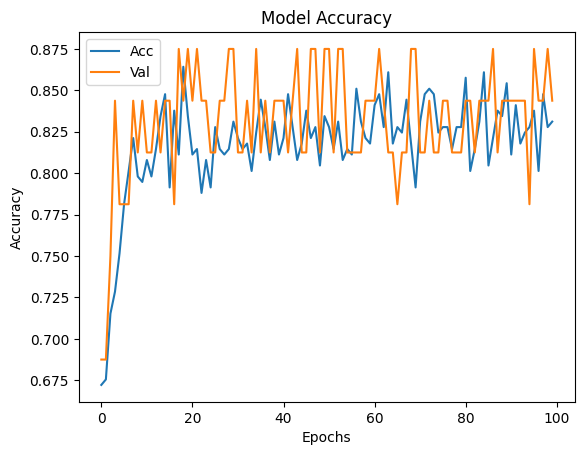

In [10]:
EPOCHS=100
MODELS=["xception"]
DROP_OUT=[0.1,0.5]
#DROP_OUT=[0.1]
N_NEURONS=[16,64]
#N_NEURONS=[16]
RUNS=3
for r in range(RUNS):
    for m in MODELS:
        for n_neurons in N_NEURONS:
            for drop_out in DROP_OUT:
                for td,exp_index in zip(t_data, enumerate(t_data)):
                    #t_data --> [tg,vg,labels,filters_name,data_set_name]
                    tg=td[0]
                    vg=td[1]
                    test_gen=td[5]
                    labels=td[2]
                    filters_name=td[3]
                    data_set_name=td[4]
                    
                    mlflow.set_experiment(m+" "+filters_name+" "+data_set_name+" dropout "+str(drop_out)+" n_neurons "+str(n_neurons)+" epochs "+str(EPOCHS))
                    with mlflow.start_run():
                        
                        # #limpiar callbacks del experimento pasado
                        # directory='callbacks'
                        # for filename in os.listdir(directory):
                        #     #print ('callbacks/model.'+str(file)+'.h5')
                        #     f = os.path.join(directory, filename)
                        #     os.remove(f)
                        #     #mlflow.log_artifact(f)
                        
                        mlflow.tensorflow.autolog()
                        model=model_selector(m,labels,n_neurons,drop_out)

                        my_callbacks = [
                            #tf.keras.callbacks.ModelCheckpoint(filepath='callbacks/model.{epoch:02d}.h5')
                            tf.keras.callbacks.ModelCheckpoint(
                            filepath='callbacks/model.h5'
                            ,monitor='val_accuracy'
                            ,verbose=1
                            ,save_weights_only=True
                            ,save_best_only=True
                            ,mode='max')
                        ]

                        history = model.fit(x=tg,validation_data=vg,epochs=EPOCHS,callbacks=my_callbacks, batch_size=16)

                        checkpoint_path='callbacks/model.h5'
                        model.load_weights(checkpoint_path)

                        test_evaluate=model.evaluate(test_gen)

                        #Metrics

                        for key in history.history:
                            clean_key=" ".join(re.findall("[a-zA-Z]+", key))
                            mlflow.tensorflow.mlflow.log_metric(clean_key,history.history[key][0])

                        # mlflow.tensorflow.mlflow.log_metric("acc", history.history["accuracy"][0])
                        # mlflow.tensorflow.mlflow.log_metric("val_loss",history.history["val_loss"][0])
                        # mlflow.tensorflow.mlflow.log_metric("val_acc", history.history["val_accuracy"][0])
                        # mlflow.tensorflow.mlflow.log_metric("val_acc", history.history["precision"][0])
                        # mlflow.tensorflow.mlflow.log_metric("val_acc", history.history["recall"][0])

                        mlflow.tensorflow.mlflow.log_metric("test_loss", test_evaluate[0])
                        mlflow.tensorflow.mlflow.log_metric("test_acc", test_evaluate[1])
                        mlflow.tensorflow.mlflow.log_metric("test_precision", test_evaluate[1])
                        mlflow.tensorflow.mlflow.log_metric("test_recall", test_evaluate[1])

                        #Plots
                        plt.clf()
                        plt.plot(history.history['accuracy'])
                        plt.plot(history.history['val_accuracy'])
                        plt.title('Model Accuracy')
                        plt.xlabel('Epochs')
                        plt.ylabel('Accuracy')
                        plt.legend(['Acc','Val'], loc = 'upper left')
                        plt.savefig("Training Plot.png")

                        directory='callbacks'
                        for filename in os.listdir(directory):
                            #print ('callbacks/model.'+str(file)+'.h5')
                            f = os.path.join(directory, filename)
                            mlflow.log_artifact(f)

                        mlflow.log_artifact("Training Plot.png")
                    mlflow.end_run()


## ResNet50

2023/03/01 06:40:26 INFO mlflow.tracking.fluent: Experiment with name 'ResNet50 grayscale SanoVsFito dropout 0.1 n_neurons 16 epochs 100' does not exist. Creating a new experiment.


94765736/94765736 [==============================] - 3s 0us/step
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6314 - accuracy: 0.6869 - precision: 0.6869 - recall: 0.6869
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 19s 648ms/step - loss: 0.6314 - accuracy: 0.6869 - precision: 0.6869 - recall: 0.6869 - val_loss: 0.6240 - val_accuracy: 0.6875 - val_precision: 0.6875 - val_recall: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6302 - accuracy: 0.6869 - precision: 0.6869 - recall: 0.6869
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 456ms/step - loss: 0.6302 - accuracy: 0.6869 - precision: 0.6869 - recall: 0.6869 - val_loss: 0.6232 - val_accuracy: 0.6875 - val_precision: 0.6875 - val_recall: 0.6875
Epoch 3/100
19/19 [==============================] - ETA: 0s - loss: 0.6266 - accuracy: 0.6869 - precisio

2023/03/01 06:54:44 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 06:54:44 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpqi6oh9rz\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpqi6oh9rz\model\data\model\assets
2023/03/01 06:55:22 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "c:\Users\USUARIO\anaconda3\envs\gpu_env\lib\site-packages\_distutils_hack\__init__.py:33: UserWarning: Setuptools is replacing distutils."


2/2 [==============================] - 1s 409ms/step - loss: 0.7413 - accuracy: 0.5000 - precision: 0.5000 - recall: 0.5000


2023/03/01 06:55:26 INFO mlflow.tracking.fluent: Experiment with name 'ResNet50 grayscale Mazorca_SF dropout 0.1 n_neurons 16 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6751 - accuracy: 0.5994 - precision_1: 0.5994 - recall_1: 0.5994
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 16s 629ms/step - loss: 0.6751 - accuracy: 0.5994 - precision_1: 0.5994 - recall_1: 0.5994 - val_loss: 0.6594 - val_accuracy: 0.6286 - val_precision_1: 0.6286 - val_recall_1: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6610 - accuracy: 0.6239 - precision_1: 0.6239 - recall_1: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 8s 403ms/step - loss: 0.6610 - accuracy: 0.6239 - precision_1: 0.6239 - recall_1: 0.6239 - val_loss: 0.6594 - val_accuracy: 0.6286 - val_precision_1: 0.6286 - val_recall_1: 0.6286
Epoch 3/100
21/21 [==============================] - ETA: 0s - loss: 0.6654 - accuracy: 0.6239 - precision_1: 0.6239 - recall_1: 0.6239
Epoch 3: v

2023/03/01 07:09:29 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 07:09:29 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp5zo8312e\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp5zo8312e\model\data\model\assets


2/2 [==============================] - 0s 85ms/step - loss: 0.7220 - accuracy: 0.5000 - precision_1: 0.5000 - recall_1: 0.5000


2023/03/01 07:09:58 INFO mlflow.tracking.fluent: Experiment with name 'ResNet50 grayscale Monoliosis EF_SF dropout 0.1 n_neurons 16 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6636 - accuracy: 0.6177 - precision_2: 0.6177 - recall_2: 0.6177
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 14s 585ms/step - loss: 0.6636 - accuracy: 0.6177 - precision_2: 0.6177 - recall_2: 0.6177 - val_loss: 0.6594 - val_accuracy: 0.6286 - val_precision_2: 0.6286 - val_recall_2: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6652 - accuracy: 0.6239 - precision_2: 0.6239 - recall_2: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 9s 413ms/step - loss: 0.6652 - accuracy: 0.6239 - precision_2: 0.6239 - recall_2: 0.6239 - val_loss: 0.6602 - val_accuracy: 0.6286 - val_precision_2: 0.6286 - val_recall_2: 0.6286
Epoch 3/100
21/21 [==============================] - ETA: 0s - loss: 0.6610 - accuracy: 0.6239 - precision_2: 0.6239 - recall_2: 0.6239
Epoch 3: v

2023/03/01 07:24:24 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 07:24:24 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpr97y9xvr\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpr97y9xvr\model\data\model\assets


2/2 [==============================] - 0s 84ms/step - loss: 0.5116 - accuracy: 0.7500 - precision_2: 0.7500 - recall_2: 0.7500


2023/03/01 07:24:52 INFO mlflow.tracking.fluent: Experiment with name 'ResNet50 grayscale Monoliosis_Intermedia_SF dropout 0.1 n_neurons 16 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6558 - accuracy: 0.6457 - precision_3: 0.6457 - recall_3: 0.6457
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 14s 637ms/step - loss: 0.6558 - accuracy: 0.6457 - precision_3: 0.6457 - recall_3: 0.6457 - val_loss: 0.6230 - val_accuracy: 0.6875 - val_precision_3: 0.6875 - val_recall_3: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6382 - accuracy: 0.6755 - precision_3: 0.6755 - recall_3: 0.6755
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 453ms/step - loss: 0.6382 - accuracy: 0.6755 - precision_3: 0.6755 - recall_3: 0.6755 - val_loss: 0.6215 - val_accuracy: 0.6875 - val_precision_3: 0.6875 - val_recall_3: 0.6875
Epoch 3/100
19/19 [==============================] - ETA: 0s - loss: 0.6363 - accuracy: 0.6755 - precision_3: 0.6755 - recall_3: 0.6755
Epoch 3: v

2023/03/01 07:38:57 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 07:38:57 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpoi1sazh0\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpoi1sazh0\model\data\model\assets


2/2 [==============================] - 0s 82ms/step - loss: 0.7435 - accuracy: 0.5000 - precision_3: 0.5000 - recall_3: 0.5000


2023/03/01 07:39:25 INFO mlflow.tracking.fluent: Experiment with name 'ResNet50 grayscale SanoVsFito dropout 0.5 n_neurons 16 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6601 - accuracy: 0.6566 - precision_4: 0.6566 - recall_4: 0.6566
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 14s 589ms/step - loss: 0.6601 - accuracy: 0.6566 - precision_4: 0.6566 - recall_4: 0.6566 - val_loss: 0.6358 - val_accuracy: 0.6875 - val_precision_4: 0.6875 - val_recall_4: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6462 - accuracy: 0.6869 - precision_4: 0.6869 - recall_4: 0.6869
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 470ms/step - loss: 0.6462 - accuracy: 0.6869 - precision_4: 0.6869 - recall_4: 0.6869 - val_loss: 0.6250 - val_accuracy: 0.6875 - val_precision_4: 0.6875 - val_recall_4: 0.6875
Epoch 3/100
19/19 [==============================] - ETA: 0s - loss: 0.6461 - accuracy: 0.6869 - precision_4: 0.6869 - recall_4: 0.6869
Epoch 3: v

2023/03/01 07:53:56 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 07:53:56 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp5plkjzrv\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp5plkjzrv\model\data\model\assets


2/2 [==============================] - 0s 90ms/step - loss: 0.7156 - accuracy: 0.5000 - precision_4: 0.5000 - recall_4: 0.5000


2023/03/01 07:54:23 INFO mlflow.tracking.fluent: Experiment with name 'ResNet50 grayscale Mazorca_SF dropout 0.5 n_neurons 16 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6756 - accuracy: 0.6055 - precision_5: 0.6055 - recall_5: 0.6055
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 13s 514ms/step - loss: 0.6756 - accuracy: 0.6055 - precision_5: 0.6055 - recall_5: 0.6055 - val_loss: 0.6612 - val_accuracy: 0.6286 - val_precision_5: 0.6286 - val_recall_5: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6794 - accuracy: 0.6239 - precision_5: 0.6239 - recall_5: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 9s 397ms/step - loss: 0.6794 - accuracy: 0.6239 - precision_5: 0.6239 - recall_5: 0.6239 - val_loss: 0.6671 - val_accuracy: 0.6286 - val_precision_5: 0.6286 - val_recall_5: 0.6286
Epoch 3/100
21/21 [==============================] - ETA: 0s - loss: 0.6709 - accuracy: 0.6239 - precision_5: 0.6239 - recall_5: 0.6239
Epoch 3: v

2023/03/01 08:08:43 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 08:08:43 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp2s7ffcdc\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp2s7ffcdc\model\data\model\assets


2/2 [==============================] - 0s 74ms/step - loss: 0.7125 - accuracy: 0.5000 - precision_5: 0.5000 - recall_5: 0.5000


2023/03/01 08:09:11 INFO mlflow.tracking.fluent: Experiment with name 'ResNet50 grayscale Monoliosis EF_SF dropout 0.5 n_neurons 16 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6796 - accuracy: 0.6055 - precision_6: 0.6055 - recall_6: 0.6055
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 14s 583ms/step - loss: 0.6796 - accuracy: 0.6055 - precision_6: 0.6055 - recall_6: 0.6055 - val_loss: 0.6639 - val_accuracy: 0.6286 - val_precision_6: 0.6286 - val_recall_6: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6728 - accuracy: 0.6239 - precision_6: 0.6239 - recall_6: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 9s 438ms/step - loss: 0.6728 - accuracy: 0.6239 - precision_6: 0.6239 - recall_6: 0.6239 - val_loss: 0.6617 - val_accuracy: 0.6286 - val_precision_6: 0.6286 - val_recall_6: 0.6286
Epoch 3/100
21/21 [==============================] - ETA: 0s - loss: 0.6806 - accuracy: 0.6239 - precision_6: 0.6239 - recall_6: 0.6239
Epoch 3: v

2023/03/01 08:23:54 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 08:23:54 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmptb6zz3bg\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmptb6zz3bg\model\data\model\assets


2/2 [==============================] - 0s 58ms/step - loss: 0.7073 - accuracy: 0.5000 - precision_6: 0.5000 - recall_6: 0.5000


2023/03/01 08:24:21 INFO mlflow.tracking.fluent: Experiment with name 'ResNet50 grayscale Monoliosis_Intermedia_SF dropout 0.5 n_neurons 16 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6551 - accuracy: 0.6623 - precision_7: 0.6623 - recall_7: 0.6623
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 13s 575ms/step - loss: 0.6551 - accuracy: 0.6623 - precision_7: 0.6623 - recall_7: 0.6623 - val_loss: 0.6298 - val_accuracy: 0.6875 - val_precision_7: 0.6875 - val_recall_7: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6471 - accuracy: 0.6755 - precision_7: 0.6755 - recall_7: 0.6755
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 455ms/step - loss: 0.6471 - accuracy: 0.6755 - precision_7: 0.6755 - recall_7: 0.6755 - val_loss: 0.6315 - val_accuracy: 0.6875 - val_precision_7: 0.6875 - val_recall_7: 0.6875
Epoch 3/100
19/19 [==============================] - ETA: 0s - loss: 0.6418 - accuracy: 0.6755 - precision_7: 0.6755 - recall_7: 0.6755
Epoch 3: v

2023/03/01 08:38:47 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 08:38:47 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp5btbvh2j\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp5btbvh2j\model\data\model\assets


2/2 [==============================] - 0s 63ms/step - loss: 0.7259 - accuracy: 0.5000 - precision_7: 0.5000 - recall_7: 0.5000


2023/03/01 08:39:14 INFO mlflow.tracking.fluent: Experiment with name 'ResNet50 grayscale SanoVsFito dropout 0.1 n_neurons 64 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6512 - accuracy: 0.6734 - precision_8: 0.6734 - recall_8: 0.6734
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 13s 574ms/step - loss: 0.6512 - accuracy: 0.6734 - precision_8: 0.6734 - recall_8: 0.6734 - val_loss: 0.6320 - val_accuracy: 0.6875 - val_precision_8: 0.6875 - val_recall_8: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6278 - accuracy: 0.6869 - precision_8: 0.6869 - recall_8: 0.6869
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 438ms/step - loss: 0.6278 - accuracy: 0.6869 - precision_8: 0.6869 - recall_8: 0.6869 - val_loss: 0.6255 - val_accuracy: 0.6875 - val_precision_8: 0.6875 - val_recall_8: 0.6875
Epoch 3/100
19/19 [==============================] - ETA: 0s - loss: 0.6225 - accuracy: 0.6869 - precision_8: 0.6869 - recall_8: 0.6869
Epoch 3: v

2023/03/01 08:53:53 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 08:53:53 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmplpnv7rn_\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmplpnv7rn_\model\data\model\assets


2/2 [==============================] - 1s 78ms/step - loss: 0.7214 - accuracy: 0.5000 - precision_8: 0.5000 - recall_8: 0.5000


2023/03/01 08:54:21 INFO mlflow.tracking.fluent: Experiment with name 'ResNet50 grayscale Mazorca_SF dropout 0.1 n_neurons 64 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6687 - accuracy: 0.6239 - precision_9: 0.6239 - recall_9: 0.6239
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 14s 579ms/step - loss: 0.6687 - accuracy: 0.6239 - precision_9: 0.6239 - recall_9: 0.6239 - val_loss: 0.6598 - val_accuracy: 0.6286 - val_precision_9: 0.6286 - val_recall_9: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6655 - accuracy: 0.6239 - precision_9: 0.6239 - recall_9: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 9s 407ms/step - loss: 0.6655 - accuracy: 0.6239 - precision_9: 0.6239 - recall_9: 0.6239 - val_loss: 0.6602 - val_accuracy: 0.6286 - val_precision_9: 0.6286 - val_recall_9: 0.6286
Epoch 3/100
21/21 [==============================] - ETA: 0s - loss: 0.6631 - accuracy: 0.6239 - precision_9: 0.6239 - recall_9: 0.6239
Epoch 3: v

2023/03/01 09:09:01 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 09:09:01 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp5zidrey4\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp5zidrey4\model\data\model\assets


2/2 [==============================] - 0s 96ms/step - loss: 0.7233 - accuracy: 0.5000 - precision_9: 0.5000 - recall_9: 0.5000


2023/03/01 09:09:29 INFO mlflow.tracking.fluent: Experiment with name 'ResNet50 grayscale Monoliosis EF_SF dropout 0.1 n_neurons 64 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6741 - accuracy: 0.6086 - precision_10: 0.6086 - recall_10: 0.6086
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 15s 599ms/step - loss: 0.6741 - accuracy: 0.6086 - precision_10: 0.6086 - recall_10: 0.6086 - val_loss: 0.6608 - val_accuracy: 0.6286 - val_precision_10: 0.6286 - val_recall_10: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6647 - accuracy: 0.6239 - precision_10: 0.6239 - recall_10: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 9s 430ms/step - loss: 0.6647 - accuracy: 0.6239 - precision_10: 0.6239 - recall_10: 0.6239 - val_loss: 0.6594 - val_accuracy: 0.6286 - val_precision_10: 0.6286 - val_recall_10: 0.6286
Epoch 3/100
21/21 [==============================] - ETA: 0s - loss: 0.6654 - accuracy: 0.6239 - precision_10: 0.6239 - recall_10: 0.6

2023/03/01 09:24:29 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 09:24:29 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpk4e063_y\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpk4e063_y\model\data\model\assets


2/2 [==============================] - 0s 82ms/step - loss: 0.5249 - accuracy: 0.7000 - precision_10: 0.7000 - recall_10: 0.7000


2023/03/01 09:24:57 INFO mlflow.tracking.fluent: Experiment with name 'ResNet50 grayscale Monoliosis_Intermedia_SF dropout 0.1 n_neurons 64 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6552 - accuracy: 0.6656 - precision_11: 0.6656 - recall_11: 0.6656
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 13s 551ms/step - loss: 0.6552 - accuracy: 0.6656 - precision_11: 0.6656 - recall_11: 0.6656 - val_loss: 0.6377 - val_accuracy: 0.6875 - val_precision_11: 0.6875 - val_recall_11: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6416 - accuracy: 0.6755 - precision_11: 0.6755 - recall_11: 0.6755
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 447ms/step - loss: 0.6416 - accuracy: 0.6755 - precision_11: 0.6755 - recall_11: 0.6755 - val_loss: 0.6285 - val_accuracy: 0.6875 - val_precision_11: 0.6875 - val_recall_11: 0.6875
Epoch 3/100
19/19 [==============================] - ETA: 0s - loss: 0.6389 - accuracy: 0.6755 - precision_11: 0.6755 - recall_11: 0.6

2023/03/01 09:39:31 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 09:39:31 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp7431aaw2\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp7431aaw2\model\data\model\assets


2/2 [==============================] - 0s 63ms/step - loss: 0.7133 - accuracy: 0.5000 - precision_11: 0.5000 - recall_11: 0.5000


2023/03/01 09:39:59 INFO mlflow.tracking.fluent: Experiment with name 'ResNet50 grayscale SanoVsFito dropout 0.5 n_neurons 64 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6682 - accuracy: 0.6532 - precision_12: 0.6532 - recall_12: 0.6532
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 14s 596ms/step - loss: 0.6682 - accuracy: 0.6532 - precision_12: 0.6532 - recall_12: 0.6532 - val_loss: 0.6484 - val_accuracy: 0.6875 - val_precision_12: 0.6875 - val_recall_12: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6566 - accuracy: 0.6869 - precision_12: 0.6869 - recall_12: 0.6869
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 472ms/step - loss: 0.6566 - accuracy: 0.6869 - precision_12: 0.6869 - recall_12: 0.6869 - val_loss: 0.6402 - val_accuracy: 0.6875 - val_precision_12: 0.6875 - val_recall_12: 0.6875
Epoch 3/100
19/19 [==============================] - ETA: 0s - loss: 0.6451 - accuracy: 0.6869 - precision_12: 0.6869 - recall_12: 0.6

2023/03/01 09:54:52 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 09:54:52 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpah63o17l\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpah63o17l\model\data\model\assets


2/2 [==============================] - 1s 87ms/step - loss: 0.7041 - accuracy: 0.5000 - precision_12: 0.5000 - recall_12: 0.5000


2023/03/01 09:55:20 INFO mlflow.tracking.fluent: Experiment with name 'ResNet50 grayscale Mazorca_SF dropout 0.5 n_neurons 64 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6739 - accuracy: 0.6055 - precision_13: 0.6055 - recall_13: 0.6055
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 13s 515ms/step - loss: 0.6739 - accuracy: 0.6055 - precision_13: 0.6055 - recall_13: 0.6055 - val_loss: 0.6656 - val_accuracy: 0.6286 - val_precision_13: 0.6286 - val_recall_13: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6616 - accuracy: 0.6239 - precision_13: 0.6239 - recall_13: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 9s 413ms/step - loss: 0.6616 - accuracy: 0.6239 - precision_13: 0.6239 - recall_13: 0.6239 - val_loss: 0.6624 - val_accuracy: 0.6286 - val_precision_13: 0.6286 - val_recall_13: 0.6286
Epoch 3/100
21/21 [==============================] - ETA: 0s - loss: 0.6747 - accuracy: 0.6239 - precision_13: 0.6239 - recall_13: 0.6

2023/03/01 10:10:00 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 10:10:00 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpg39lduiu\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpg39lduiu\model\data\model\assets


2/2 [==============================] - 0s 73ms/step - loss: 0.7051 - accuracy: 0.5000 - precision_13: 0.5000 - recall_13: 0.5000


2023/03/01 10:10:27 INFO mlflow.tracking.fluent: Experiment with name 'ResNet50 grayscale Monoliosis EF_SF dropout 0.5 n_neurons 64 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6725 - accuracy: 0.6208 - precision_14: 0.6208 - recall_14: 0.6208
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 13s 538ms/step - loss: 0.6725 - accuracy: 0.6208 - precision_14: 0.6208 - recall_14: 0.6208 - val_loss: 0.6638 - val_accuracy: 0.6286 - val_precision_14: 0.6286 - val_recall_14: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6722 - accuracy: 0.6239 - precision_14: 0.6239 - recall_14: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 9s 419ms/step - loss: 0.6722 - accuracy: 0.6239 - precision_14: 0.6239 - recall_14: 0.6239 - val_loss: 0.6630 - val_accuracy: 0.6286 - val_precision_14: 0.6286 - val_recall_14: 0.6286
Epoch 3/100
21/21 [==============================] - ETA: 0s - loss: 0.6696 - accuracy: 0.6239 - precision_14: 0.6239 - recall_14: 0.6

2023/03/01 10:25:23 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 10:25:23 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpl5b9i_3_\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpl5b9i_3_\model\data\model\assets


2/2 [==============================] - 0s 92ms/step - loss: 0.7081 - accuracy: 0.5000 - precision_14: 0.5000 - recall_14: 0.5000


2023/03/01 10:25:50 INFO mlflow.tracking.fluent: Experiment with name 'ResNet50 grayscale Monoliosis_Intermedia_SF dropout 0.5 n_neurons 64 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6557 - accuracy: 0.6457 - precision_15: 0.6457 - recall_15: 0.6457
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 14s 577ms/step - loss: 0.6557 - accuracy: 0.6457 - precision_15: 0.6457 - recall_15: 0.6457 - val_loss: 0.6283 - val_accuracy: 0.6875 - val_precision_15: 0.6875 - val_recall_15: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6575 - accuracy: 0.6755 - precision_15: 0.6755 - recall_15: 0.6755
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 447ms/step - loss: 0.6575 - accuracy: 0.6755 - precision_15: 0.6755 - recall_15: 0.6755 - val_loss: 0.6283 - val_accuracy: 0.6875 - val_precision_15: 0.6875 - val_recall_15: 0.6875
Epoch 3/100
19/19 [==============================] - ETA: 0s - loss: 0.6528 - accuracy: 0.6755 - precision_15: 0.6755 - recall_15: 0.6

2023/03/01 10:40:25 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 10:40:25 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpk7uyu070\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpk7uyu070\model\data\model\assets


2/2 [==============================] - 0s 61ms/step - loss: 0.7277 - accuracy: 0.5000 - precision_15: 0.5000 - recall_15: 0.5000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6546 - accuracy: 0.6330 - precision_16: 0.6330 - recall_16: 0.6330
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 13s 598ms/step - loss: 0.6546 - accuracy: 0.6330 - precision_16: 0.6330 - recall_16: 0.6330 - val_loss: 0.6293 - val_accuracy: 0.6875 - val_precision_16: 0.6875 - val_recall_16: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6397 - accuracy: 0.6869 - precision_16: 0.6869 - recall_16: 0.6869
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 466ms/step - loss: 0.6397 - accuracy: 0.6869 - precision_16: 0.6869 - recall_16: 0.6869 - val_loss: 0.6250 - val_accuracy: 0.6875 - val_precision_16: 0.6875 - val_recall_16: 0.6875
Epoch

2023/03/01 10:55:47 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 10:55:47 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmps8lc34tl\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmps8lc34tl\model\data\model\assets


2/2 [==============================] - 1s 86ms/step - loss: 0.7258 - accuracy: 0.5000 - precision_16: 0.5000 - recall_16: 0.5000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6745 - accuracy: 0.6147 - precision_17: 0.6147 - recall_17: 0.6147
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 13s 513ms/step - loss: 0.6745 - accuracy: 0.6147 - precision_17: 0.6147 - recall_17: 0.6147 - val_loss: 0.6607 - val_accuracy: 0.6286 - val_precision_17: 0.6286 - val_recall_17: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6724 - accuracy: 0.6239 - precision_17: 0.6239 - recall_17: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 9s 420ms/step - loss: 0.6724 - accuracy: 0.6239 - precision_17: 0.6239 - recall_17: 0.6239 - val_loss: 0.6622 - val_accuracy: 0.6286 - val_precision_17: 0.6286 - val_recall_17: 0.6286
Epoch

2023/03/01 11:10:52 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 11:10:52 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp25b6z70u\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp25b6z70u\model\data\model\assets


2/2 [==============================] - 0s 88ms/step - loss: 0.7175 - accuracy: 0.5000 - precision_17: 0.5000 - recall_17: 0.5000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6668 - accuracy: 0.6239 - precision_18: 0.6239 - recall_18: 0.6239
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 14s 543ms/step - loss: 0.6668 - accuracy: 0.6239 - precision_18: 0.6239 - recall_18: 0.6239 - val_loss: 0.6587 - val_accuracy: 0.6286 - val_precision_18: 0.6286 - val_recall_18: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6602 - accuracy: 0.6239 - precision_18: 0.6239 - recall_18: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 9s 419ms/step - loss: 0.6602 - accuracy: 0.6239 - precision_18: 0.6239 - recall_18: 0.6239 - val_loss: 0.6596 - val_accuracy: 0.6286 - val_precision_18: 0.6286 - val_recall_18: 0.6286
Epoch

2023/03/01 11:26:23 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 11:26:23 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp7huo1na6\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp7huo1na6\model\data\model\assets


2/2 [==============================] - 0s 63ms/step - loss: 0.5206 - accuracy: 0.8000 - precision_18: 0.8000 - recall_18: 0.8000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6509 - accuracy: 0.6358 - precision_19: 0.6358 - recall_19: 0.6358
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 15s 650ms/step - loss: 0.6509 - accuracy: 0.6358 - precision_19: 0.6358 - recall_19: 0.6358 - val_loss: 0.6216 - val_accuracy: 0.6875 - val_precision_19: 0.6875 - val_recall_19: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6315 - accuracy: 0.6755 - precision_19: 0.6755 - recall_19: 0.6755
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 466ms/step - loss: 0.6315 - accuracy: 0.6755 - precision_19: 0.6755 - recall_19: 0.6755 - val_loss: 0.6210 - val_accuracy: 0.6875 - val_precision_19: 0.6875 - val_recall_19: 0.6875
Epoch

2023/03/01 11:41:32 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 11:41:32 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpeyws3q12\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpeyws3q12\model\data\model\assets


2/2 [==============================] - 0s 101ms/step - loss: 0.7569 - accuracy: 0.5000 - precision_19: 0.5000 - recall_19: 0.5000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6729 - accuracy: 0.6734 - precision_20: 0.6734 - recall_20: 0.6734
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 15s 662ms/step - loss: 0.6729 - accuracy: 0.6734 - precision_20: 0.6734 - recall_20: 0.6734 - val_loss: 0.6451 - val_accuracy: 0.6875 - val_precision_20: 0.6875 - val_recall_20: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6572 - accuracy: 0.6869 - precision_20: 0.6869 - recall_20: 0.6869
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 458ms/step - loss: 0.6572 - accuracy: 0.6869 - precision_20: 0.6869 - recall_20: 0.6869 - val_loss: 0.6348 - val_accuracy: 0.6875 - val_precision_20: 0.6875 - val_recall_20: 0.6875
Epoc

2023/03/01 11:56:56 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 11:56:56 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmphld5fgwq\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmphld5fgwq\model\data\model\assets


2/2 [==============================] - 1s 109ms/step - loss: 0.7068 - accuracy: 0.5000 - precision_20: 0.5000 - recall_20: 0.5000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6731 - accuracy: 0.5963 - precision_21: 0.5963 - recall_21: 0.5963
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 17s 687ms/step - loss: 0.6731 - accuracy: 0.5963 - precision_21: 0.5963 - recall_21: 0.5963 - val_loss: 0.6625 - val_accuracy: 0.6286 - val_precision_21: 0.6286 - val_recall_21: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6652 - accuracy: 0.6239 - precision_21: 0.6239 - recall_21: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 9s 432ms/step - loss: 0.6652 - accuracy: 0.6239 - precision_21: 0.6239 - recall_21: 0.6239 - val_loss: 0.6626 - val_accuracy: 0.6286 - val_precision_21: 0.6286 - val_recall_21: 0.6286
Epoc

2023/03/01 12:12:09 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 12:12:09 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp1zozu7mh\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp1zozu7mh\model\data\model\assets


2/2 [==============================] - 0s 82ms/step - loss: 0.7093 - accuracy: 0.5000 - precision_21: 0.5000 - recall_21: 0.5000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6732 - accuracy: 0.5933 - precision_22: 0.5933 - recall_22: 0.5933
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 14s 546ms/step - loss: 0.6732 - accuracy: 0.5933 - precision_22: 0.5933 - recall_22: 0.5933 - val_loss: 0.6609 - val_accuracy: 0.6286 - val_precision_22: 0.6286 - val_recall_22: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6710 - accuracy: 0.6239 - precision_22: 0.6239 - recall_22: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 9s 418ms/step - loss: 0.6710 - accuracy: 0.6239 - precision_22: 0.6239 - recall_22: 0.6239 - val_loss: 0.6607 - val_accuracy: 0.6286 - val_precision_22: 0.6286 - val_recall_22: 0.6286
Epoch

2023/03/01 12:27:42 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 12:27:42 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpulah6qxf\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpulah6qxf\model\data\model\assets


2/2 [==============================] - 0s 79ms/step - loss: 0.5695 - accuracy: 0.7500 - precision_22: 0.7500 - recall_22: 0.7500
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6680 - accuracy: 0.6258 - precision_23: 0.6258 - recall_23: 0.6258
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 13s 580ms/step - loss: 0.6680 - accuracy: 0.6258 - precision_23: 0.6258 - recall_23: 0.6258 - val_loss: 0.6365 - val_accuracy: 0.6875 - val_precision_23: 0.6875 - val_recall_23: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6420 - accuracy: 0.6755 - precision_23: 0.6755 - recall_23: 0.6755
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 447ms/step - loss: 0.6420 - accuracy: 0.6755 - precision_23: 0.6755 - recall_23: 0.6755 - val_loss: 0.6301 - val_accuracy: 0.6875 - val_precision_23: 0.6875 - val_recall_23: 0.6875
Epoch

2023/03/01 12:42:45 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 12:42:45 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpha1nk8fc\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpha1nk8fc\model\data\model\assets


2/2 [==============================] - 0s 95ms/step - loss: 0.7147 - accuracy: 0.5000 - precision_23: 0.5000 - recall_23: 0.5000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6455 - accuracy: 0.6734 - precision_24: 0.6734 - recall_24: 0.6734
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 13s 586ms/step - loss: 0.6455 - accuracy: 0.6734 - precision_24: 0.6734 - recall_24: 0.6734 - val_loss: 0.6298 - val_accuracy: 0.6875 - val_precision_24: 0.6875 - val_recall_24: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6187 - accuracy: 0.6869 - precision_24: 0.6869 - recall_24: 0.6869
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 454ms/step - loss: 0.6187 - accuracy: 0.6869 - precision_24: 0.6869 - recall_24: 0.6869 - val_loss: 0.6231 - val_accuracy: 0.6875 - val_precision_24: 0.6875 - val_recall_24: 0.6875
Epoch

2023/03/01 12:57:57 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 12:57:57 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpzaj15cls\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpzaj15cls\model\data\model\assets


2/2 [==============================] - 1s 104ms/step - loss: 0.7247 - accuracy: 0.5000 - precision_24: 0.5000 - recall_24: 0.5000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6719 - accuracy: 0.6239 - precision_25: 0.6239 - recall_25: 0.6239
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 13s 532ms/step - loss: 0.6719 - accuracy: 0.6239 - precision_25: 0.6239 - recall_25: 0.6239 - val_loss: 0.6630 - val_accuracy: 0.6286 - val_precision_25: 0.6286 - val_recall_25: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6640 - accuracy: 0.6239 - precision_25: 0.6239 - recall_25: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 9s 412ms/step - loss: 0.6640 - accuracy: 0.6239 - precision_25: 0.6239 - recall_25: 0.6239 - val_loss: 0.6603 - val_accuracy: 0.6286 - val_precision_25: 0.6286 - val_recall_25: 0.6286
Epoc

2023/03/01 13:12:57 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 13:12:57 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpqgq26g7z\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpqgq26g7z\model\data\model\assets


2/2 [==============================] - 0s 77ms/step - loss: 0.7091 - accuracy: 0.5000 - precision_25: 0.5000 - recall_25: 0.5000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6780 - accuracy: 0.5902 - precision_26: 0.5902 - recall_26: 0.5902
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 13s 519ms/step - loss: 0.6780 - accuracy: 0.5902 - precision_26: 0.5902 - recall_26: 0.5902 - val_loss: 0.6661 - val_accuracy: 0.6286 - val_precision_26: 0.6286 - val_recall_26: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6622 - accuracy: 0.6239 - precision_26: 0.6239 - recall_26: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 9s 425ms/step - loss: 0.6622 - accuracy: 0.6239 - precision_26: 0.6239 - recall_26: 0.6239 - val_loss: 0.6605 - val_accuracy: 0.6286 - val_precision_26: 0.6286 - val_recall_26: 0.6286
Epoch

2023/03/01 13:28:09 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 13:28:09 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp4gwcaygk\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp4gwcaygk\model\data\model\assets


2/2 [==============================] - 0s 96ms/step - loss: 0.7035 - accuracy: 0.5000 - precision_26: 0.5000 - recall_26: 0.5000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6451 - accuracy: 0.6755 - precision_27: 0.6755 - recall_27: 0.6755
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 14s 592ms/step - loss: 0.6451 - accuracy: 0.6755 - precision_27: 0.6755 - recall_27: 0.6755 - val_loss: 0.6289 - val_accuracy: 0.6875 - val_precision_27: 0.6875 - val_recall_27: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6353 - accuracy: 0.6755 - precision_27: 0.6755 - recall_27: 0.6755
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 439ms/step - loss: 0.6353 - accuracy: 0.6755 - precision_27: 0.6755 - recall_27: 0.6755 - val_loss: 0.6255 - val_accuracy: 0.6875 - val_precision_27: 0.6875 - val_recall_27: 0.6875
Epoch

2023/03/01 13:43:02 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 13:43:02 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpi4x1i1bj\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpi4x1i1bj\model\data\model\assets


2/2 [==============================] - 0s 95ms/step - loss: 0.7270 - accuracy: 0.5000 - precision_27: 0.5000 - recall_27: 0.5000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6600 - accuracy: 0.6700 - precision_28: 0.6700 - recall_28: 0.6700
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 13s 577ms/step - loss: 0.6600 - accuracy: 0.6700 - precision_28: 0.6700 - recall_28: 0.6700 - val_loss: 0.6354 - val_accuracy: 0.6875 - val_precision_28: 0.6875 - val_recall_28: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6441 - accuracy: 0.6869 - precision_28: 0.6869 - recall_28: 0.6869
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 460ms/step - loss: 0.6441 - accuracy: 0.6869 - precision_28: 0.6869 - recall_28: 0.6869 - val_loss: 0.6336 - val_accuracy: 0.6875 - val_precision_28: 0.6875 - val_recall_28: 0.6875
Epoch

2023/03/01 13:58:12 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 13:58:12 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpoldb9gwk\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpoldb9gwk\model\data\model\assets


2/2 [==============================] - 1s 71ms/step - loss: 0.7163 - accuracy: 0.5000 - precision_28: 0.5000 - recall_28: 0.5000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6698 - accuracy: 0.5902 - precision_29: 0.5902 - recall_29: 0.5902
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 14s 554ms/step - loss: 0.6698 - accuracy: 0.5902 - precision_29: 0.5902 - recall_29: 0.5902 - val_loss: 0.6609 - val_accuracy: 0.6286 - val_precision_29: 0.6286 - val_recall_29: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6737 - accuracy: 0.6239 - precision_29: 0.6239 - recall_29: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 9s 397ms/step - loss: 0.6737 - accuracy: 0.6239 - precision_29: 0.6239 - recall_29: 0.6239 - val_loss: 0.6612 - val_accuracy: 0.6286 - val_precision_29: 0.6286 - val_recall_29: 0.6286
Epoch

2023/03/01 14:13:11 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 14:13:11 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpxtvhxb17\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpxtvhxb17\model\data\model\assets


2/2 [==============================] - 0s 71ms/step - loss: 0.7161 - accuracy: 0.5000 - precision_29: 0.5000 - recall_29: 0.5000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6703 - accuracy: 0.6239 - precision_30: 0.6239 - recall_30: 0.6239
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 13s 525ms/step - loss: 0.6703 - accuracy: 0.6239 - precision_30: 0.6239 - recall_30: 0.6239 - val_loss: 0.6602 - val_accuracy: 0.6286 - val_precision_30: 0.6286 - val_recall_30: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6678 - accuracy: 0.6239 - precision_30: 0.6239 - recall_30: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 9s 411ms/step - loss: 0.6678 - accuracy: 0.6239 - precision_30: 0.6239 - recall_30: 0.6239 - val_loss: 0.6609 - val_accuracy: 0.6286 - val_precision_30: 0.6286 - val_recall_30: 0.6286
Epoch

2023/03/01 14:28:29 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 14:28:29 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpqhk8zjrj\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpqhk8zjrj\model\data\model\assets


2/2 [==============================] - 0s 64ms/step - loss: 0.7204 - accuracy: 0.5000 - precision_30: 0.5000 - recall_30: 0.5000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6683 - accuracy: 0.6457 - precision_31: 0.6457 - recall_31: 0.6457
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 13s 579ms/step - loss: 0.6683 - accuracy: 0.6457 - precision_31: 0.6457 - recall_31: 0.6457 - val_loss: 0.6416 - val_accuracy: 0.6875 - val_precision_31: 0.6875 - val_recall_31: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6511 - accuracy: 0.6755 - precision_31: 0.6755 - recall_31: 0.6755
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 449ms/step - loss: 0.6511 - accuracy: 0.6755 - precision_31: 0.6755 - recall_31: 0.6755 - val_loss: 0.6371 - val_accuracy: 0.6875 - val_precision_31: 0.6875 - val_recall_31: 0.6875
Epoch

2023/03/01 14:43:47 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 14:43:47 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpxqox3zjs\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpxqox3zjs\model\data\model\assets


2/2 [==============================] - 0s 58ms/step - loss: 0.7095 - accuracy: 0.5000 - precision_31: 0.5000 - recall_31: 0.5000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6606 - accuracy: 0.6498 - precision_32: 0.6498 - recall_32: 0.6498
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 15s 659ms/step - loss: 0.6606 - accuracy: 0.6498 - precision_32: 0.6498 - recall_32: 0.6498 - val_loss: 0.6421 - val_accuracy: 0.6875 - val_precision_32: 0.6875 - val_recall_32: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6437 - accuracy: 0.6869 - precision_32: 0.6869 - recall_32: 0.6869
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 464ms/step - loss: 0.6437 - accuracy: 0.6869 - precision_32: 0.6869 - recall_32: 0.6869 - val_loss: 0.6372 - val_accuracy: 0.6875 - val_precision_32: 0.6875 - val_recall_32: 0.6875
Epoch

2023/03/01 14:59:11 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 14:59:11 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp9o_azc92\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp9o_azc92\model\data\model\assets


2/2 [==============================] - 1s 117ms/step - loss: 0.7090 - accuracy: 0.5000 - precision_32: 0.5000 - recall_32: 0.5000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6832 - accuracy: 0.5994 - precision_33: 0.5994 - recall_33: 0.5994
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 13s 532ms/step - loss: 0.6832 - accuracy: 0.5994 - precision_33: 0.5994 - recall_33: 0.5994 - val_loss: 0.6646 - val_accuracy: 0.6286 - val_precision_33: 0.6286 - val_recall_33: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6622 - accuracy: 0.6239 - precision_33: 0.6239 - recall_33: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 9s 404ms/step - loss: 0.6622 - accuracy: 0.6239 - precision_33: 0.6239 - recall_33: 0.6239 - val_loss: 0.6617 - val_accuracy: 0.6286 - val_precision_33: 0.6286 - val_recall_33: 0.6286
Epoc

2023/03/01 15:14:16 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 15:14:16 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp4ylmaz04\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp4ylmaz04\model\data\model\assets


2/2 [==============================] - 0s 91ms/step - loss: 0.7566 - accuracy: 0.5000 - precision_33: 0.5000 - recall_33: 0.5000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6669 - accuracy: 0.6055 - precision_34: 0.6055 - recall_34: 0.6055
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 15s 605ms/step - loss: 0.6669 - accuracy: 0.6055 - precision_34: 0.6055 - recall_34: 0.6055 - val_loss: 0.6601 - val_accuracy: 0.6286 - val_precision_34: 0.6286 - val_recall_34: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6695 - accuracy: 0.6239 - precision_34: 0.6239 - recall_34: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 9s 417ms/step - loss: 0.6695 - accuracy: 0.6239 - precision_34: 0.6239 - recall_34: 0.6239 - val_loss: 0.6595 - val_accuracy: 0.6286 - val_precision_34: 0.6286 - val_recall_34: 0.6286
Epoch

2023/03/01 15:29:44 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 15:29:44 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp9he1wkmz\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp9he1wkmz\model\data\model\assets


2/2 [==============================] - 0s 71ms/step - loss: 0.5275 - accuracy: 0.7500 - precision_34: 0.7500 - recall_34: 0.7500
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6375 - accuracy: 0.6755 - precision_35: 0.6755 - recall_35: 0.6755
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 13s 583ms/step - loss: 0.6375 - accuracy: 0.6755 - precision_35: 0.6755 - recall_35: 0.6755 - val_loss: 0.6210 - val_accuracy: 0.6875 - val_precision_35: 0.6875 - val_recall_35: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6324 - accuracy: 0.6755 - precision_35: 0.6755 - recall_35: 0.6755
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 446ms/step - loss: 0.6324 - accuracy: 0.6755 - precision_35: 0.6755 - recall_35: 0.6755 - val_loss: 0.6211 - val_accuracy: 0.6875 - val_precision_35: 0.6875 - val_recall_35: 0.6875
Epoch

2023/03/01 15:44:51 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 15:44:51 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpa7qr0t42\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpa7qr0t42\model\data\model\assets


2/2 [==============================] - 0s 88ms/step - loss: 0.7708 - accuracy: 0.5000 - precision_35: 0.5000 - recall_35: 0.5000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6497 - accuracy: 0.6768 - precision_36: 0.6768 - recall_36: 0.6768
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 13s 586ms/step - loss: 0.6497 - accuracy: 0.6768 - precision_36: 0.6768 - recall_36: 0.6768 - val_loss: 0.6388 - val_accuracy: 0.6875 - val_precision_36: 0.6875 - val_recall_36: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6428 - accuracy: 0.6869 - precision_36: 0.6869 - recall_36: 0.6869
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 463ms/step - loss: 0.6428 - accuracy: 0.6869 - precision_36: 0.6869 - recall_36: 0.6869 - val_loss: 0.6360 - val_accuracy: 0.6875 - val_precision_36: 0.6875 - val_recall_36: 0.6875
Epoch

2023/03/01 16:00:16 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 16:00:16 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp7cg7ogm7\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp7cg7ogm7\model\data\model\assets


2/2 [==============================] - 1s 76ms/step - loss: 0.7122 - accuracy: 0.5000 - precision_36: 0.5000 - recall_36: 0.5000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6918 - accuracy: 0.5382 - precision_37: 0.5382 - recall_37: 0.5382
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 13s 525ms/step - loss: 0.6918 - accuracy: 0.5382 - precision_37: 0.5382 - recall_37: 0.5382 - val_loss: 0.6778 - val_accuracy: 0.6286 - val_precision_37: 0.6286 - val_recall_37: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6797 - accuracy: 0.6239 - precision_37: 0.6239 - recall_37: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 9s 411ms/step - loss: 0.6797 - accuracy: 0.6239 - precision_37: 0.6239 - recall_37: 0.6239 - val_loss: 0.6747 - val_accuracy: 0.6286 - val_precision_37: 0.6286 - val_recall_37: 0.6286
Epoch

2023/03/01 16:15:31 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 16:15:31 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp7_05n062\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp7_05n062\model\data\model\assets


2/2 [==============================] - 0s 62ms/step - loss: 0.6954 - accuracy: 0.5000 - precision_37: 0.5000 - recall_37: 0.5000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6796 - accuracy: 0.5841 - precision_38: 0.5841 - recall_38: 0.5841
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 13s 513ms/step - loss: 0.6796 - accuracy: 0.5841 - precision_38: 0.5841 - recall_38: 0.5841 - val_loss: 0.6590 - val_accuracy: 0.6286 - val_precision_38: 0.6286 - val_recall_38: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6626 - accuracy: 0.6147 - precision_38: 0.6147 - recall_38: 0.6147
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 9s 431ms/step - loss: 0.6626 - accuracy: 0.6147 - precision_38: 0.6147 - recall_38: 0.6147 - val_loss: 0.6580 - val_accuracy: 0.6286 - val_precision_38: 0.6286 - val_recall_38: 0.6286
Epoch

2023/03/01 16:31:05 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 16:31:05 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpce3xw6dr\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpce3xw6dr\model\data\model\assets


2/2 [==============================] - 0s 88ms/step - loss: 0.5588 - accuracy: 0.7000 - precision_38: 0.7000 - recall_38: 0.7000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6747 - accuracy: 0.6457 - precision_39: 0.6457 - recall_39: 0.6457
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 13s 579ms/step - loss: 0.6747 - accuracy: 0.6457 - precision_39: 0.6457 - recall_39: 0.6457 - val_loss: 0.6331 - val_accuracy: 0.6875 - val_precision_39: 0.6875 - val_recall_39: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6422 - accuracy: 0.6755 - precision_39: 0.6755 - recall_39: 0.6755
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 460ms/step - loss: 0.6422 - accuracy: 0.6755 - precision_39: 0.6755 - recall_39: 0.6755 - val_loss: 0.6268 - val_accuracy: 0.6875 - val_precision_39: 0.6875 - val_recall_39: 0.6875
Epoch

2023/03/01 16:46:18 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 16:46:18 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpb4rpr425\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpb4rpr425\model\data\model\assets


2/2 [==============================] - 0s 68ms/step - loss: 0.7194 - accuracy: 0.5000 - precision_39: 0.5000 - recall_39: 0.5000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6539 - accuracy: 0.6700 - precision_40: 0.6700 - recall_40: 0.6700
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 13s 599ms/step - loss: 0.6539 - accuracy: 0.6700 - precision_40: 0.6700 - recall_40: 0.6700 - val_loss: 0.6400 - val_accuracy: 0.6875 - val_precision_40: 0.6875 - val_recall_40: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6393 - accuracy: 0.6869 - precision_40: 0.6869 - recall_40: 0.6869
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 450ms/step - loss: 0.6393 - accuracy: 0.6869 - precision_40: 0.6869 - recall_40: 0.6869 - val_loss: 0.6341 - val_accuracy: 0.6875 - val_precision_40: 0.6875 - val_recall_40: 0.6875
Epoch

2023/03/01 17:01:47 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 17:01:47 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpc5hrfdwm\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpc5hrfdwm\model\data\model\assets


2/2 [==============================] - 1s 129ms/step - loss: 0.7109 - accuracy: 0.5000 - precision_40: 0.5000 - recall_40: 0.5000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6667 - accuracy: 0.6239 - precision_41: 0.6239 - recall_41: 0.6239
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 13s 517ms/step - loss: 0.6667 - accuracy: 0.6239 - precision_41: 0.6239 - recall_41: 0.6239 - val_loss: 0.6614 - val_accuracy: 0.6286 - val_precision_41: 0.6286 - val_recall_41: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6627 - accuracy: 0.6239 - precision_41: 0.6239 - recall_41: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 9s 413ms/step - loss: 0.6627 - accuracy: 0.6239 - precision_41: 0.6239 - recall_41: 0.6239 - val_loss: 0.6602 - val_accuracy: 0.6286 - val_precision_41: 0.6286 - val_recall_41: 0.6286
Epoc

2023/03/01 17:17:04 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 17:17:04 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp203hdz0e\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp203hdz0e\model\data\model\assets


2/2 [==============================] - 0s 60ms/step - loss: 0.7145 - accuracy: 0.5000 - precision_41: 0.5000 - recall_41: 0.5000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6795 - accuracy: 0.5902 - precision_42: 0.5902 - recall_42: 0.5902
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 14s 529ms/step - loss: 0.6795 - accuracy: 0.5902 - precision_42: 0.5902 - recall_42: 0.5902 - val_loss: 0.6634 - val_accuracy: 0.6286 - val_precision_42: 0.6286 - val_recall_42: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6648 - accuracy: 0.6239 - precision_42: 0.6239 - recall_42: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 9s 420ms/step - loss: 0.6648 - accuracy: 0.6239 - precision_42: 0.6239 - recall_42: 0.6239 - val_loss: 0.6591 - val_accuracy: 0.6286 - val_precision_42: 0.6286 - val_recall_42: 0.6286
Epoch

2023/03/01 17:32:46 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 17:32:46 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp86tv4ggd\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp86tv4ggd\model\data\model\assets


2/2 [==============================] - 0s 59ms/step - loss: 0.4058 - accuracy: 0.8500 - precision_42: 0.8500 - recall_42: 0.8500
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6588 - accuracy: 0.6490 - precision_43: 0.6490 - recall_43: 0.6490
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 13s 577ms/step - loss: 0.6588 - accuracy: 0.6490 - precision_43: 0.6490 - recall_43: 0.6490 - val_loss: 0.6359 - val_accuracy: 0.6875 - val_precision_43: 0.6875 - val_recall_43: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6380 - accuracy: 0.6755 - precision_43: 0.6755 - recall_43: 0.6755
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 460ms/step - loss: 0.6380 - accuracy: 0.6755 - precision_43: 0.6755 - recall_43: 0.6755 - val_loss: 0.6252 - val_accuracy: 0.6875 - val_precision_43: 0.6875 - val_recall_43: 0.6875
Epoch

2023/03/01 17:47:56 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 17:47:56 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp0axm4eah\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp0axm4eah\model\data\model\assets


2/2 [==============================] - 0s 63ms/step - loss: 0.7157 - accuracy: 0.5000 - precision_43: 0.5000 - recall_43: 0.5000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6493 - accuracy: 0.6801 - precision_44: 0.6801 - recall_44: 0.6801
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 13s 597ms/step - loss: 0.6493 - accuracy: 0.6801 - precision_44: 0.6801 - recall_44: 0.6801 - val_loss: 0.6314 - val_accuracy: 0.6875 - val_precision_44: 0.6875 - val_recall_44: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6477 - accuracy: 0.6869 - precision_44: 0.6869 - recall_44: 0.6869
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 469ms/step - loss: 0.6477 - accuracy: 0.6869 - precision_44: 0.6869 - recall_44: 0.6869 - val_loss: 0.6355 - val_accuracy: 0.6875 - val_precision_44: 0.6875 - val_recall_44: 0.6875
Epoch

2023/03/01 18:03:18 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 18:03:18 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp5a5yh46d\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp5a5yh46d\model\data\model\assets


2/2 [==============================] - 1s 90ms/step - loss: 0.7222 - accuracy: 0.5000 - precision_44: 0.5000 - recall_44: 0.5000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6684 - accuracy: 0.6116 - precision_45: 0.6116 - recall_45: 0.6116
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 13s 525ms/step - loss: 0.6684 - accuracy: 0.6116 - precision_45: 0.6116 - recall_45: 0.6116 - val_loss: 0.6603 - val_accuracy: 0.6286 - val_precision_45: 0.6286 - val_recall_45: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6579 - accuracy: 0.6239 - precision_45: 0.6239 - recall_45: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 9s 413ms/step - loss: 0.6579 - accuracy: 0.6239 - precision_45: 0.6239 - recall_45: 0.6239 - val_loss: 0.6602 - val_accuracy: 0.6286 - val_precision_45: 0.6286 - val_recall_45: 0.6286
Epoch

2023/03/01 18:18:41 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 18:18:41 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmplkfbx5j4\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmplkfbx5j4\model\data\model\assets


2/2 [==============================] - 0s 92ms/step - loss: 0.7197 - accuracy: 0.5000 - precision_45: 0.5000 - recall_45: 0.5000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6699 - accuracy: 0.6177 - precision_46: 0.6177 - recall_46: 0.6177
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 13s 528ms/step - loss: 0.6699 - accuracy: 0.6177 - precision_46: 0.6177 - recall_46: 0.6177 - val_loss: 0.6603 - val_accuracy: 0.6286 - val_precision_46: 0.6286 - val_recall_46: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6571 - accuracy: 0.6239 - precision_46: 0.6239 - recall_46: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 9s 412ms/step - loss: 0.6571 - accuracy: 0.6239 - precision_46: 0.6239 - recall_46: 0.6239 - val_loss: 0.6600 - val_accuracy: 0.6286 - val_precision_46: 0.6286 - val_recall_46: 0.6286
Epoch

2023/03/01 18:34:21 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 18:34:21 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpe5k3tvnd\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpe5k3tvnd\model\data\model\assets


2/2 [==============================] - 0s 58ms/step - loss: 0.7196 - accuracy: 0.5000 - precision_46: 0.5000 - recall_46: 0.5000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6598 - accuracy: 0.6656 - precision_47: 0.6656 - recall_47: 0.6656
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 14s 589ms/step - loss: 0.6598 - accuracy: 0.6656 - precision_47: 0.6656 - recall_47: 0.6656 - val_loss: 0.6372 - val_accuracy: 0.6875 - val_precision_47: 0.6875 - val_recall_47: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6423 - accuracy: 0.6755 - precision_47: 0.6755 - recall_47: 0.6755
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 456ms/step - loss: 0.6423 - accuracy: 0.6755 - precision_47: 0.6755 - recall_47: 0.6755 - val_loss: 0.6309 - val_accuracy: 0.6875 - val_precision_47: 0.6875 - val_recall_47: 0.6875
Epoch

2023/03/01 18:49:36 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 18:49:36 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpma1qeyx7\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpma1qeyx7\model\data\model\assets


2/2 [==============================] - 0s 91ms/step - loss: 0.7138 - accuracy: 0.5000 - precision_47: 0.5000 - recall_47: 0.5000


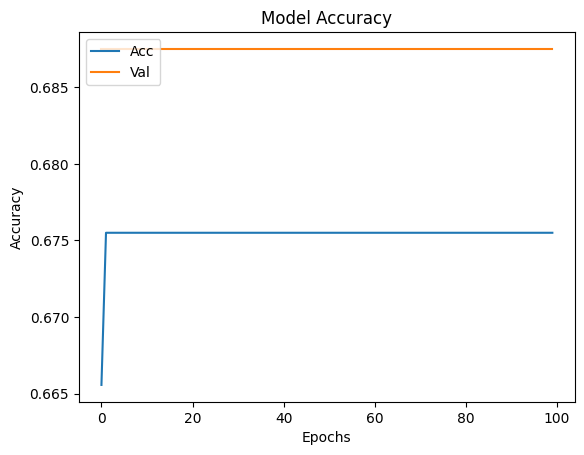

In [7]:
EPOCHS=100
MODELS=["ResNet50"]
DROP_OUT=[0.1,0.5]
#DROP_OUT=[0.1]
N_NEURONS=[16,64]
#N_NEURONS=[16]
RUNS=3
for r in range(RUNS):
    for m in MODELS:
        for n_neurons in N_NEURONS:
            for drop_out in DROP_OUT:
                for td,exp_index in zip(t_data, enumerate(t_data)):
                    #t_data --> [tg,vg,labels,filters_name,data_set_name]
                    tg=td[0]
                    vg=td[1]
                    test_gen=td[5]
                    labels=td[2]
                    filters_name=td[3]
                    data_set_name=td[4]
                    
                    mlflow.set_experiment(m+" "+filters_name+" "+data_set_name+" dropout "+str(drop_out)+" n_neurons "+str(n_neurons)+" epochs "+str(EPOCHS))
                    with mlflow.start_run():
                        
                        # #limpiar callbacks del experimento pasado
                        # directory='callbacks'
                        # for filename in os.listdir(directory):
                        #     #print ('callbacks/model.'+str(file)+'.h5')
                        #     f = os.path.join(directory, filename)
                        #     os.remove(f)
                        #     #mlflow.log_artifact(f)
                        
                        mlflow.tensorflow.autolog()
                        model=model_selector(m,labels,n_neurons,drop_out)

                        my_callbacks = [
                            #tf.keras.callbacks.ModelCheckpoint(filepath='callbacks/model.{epoch:02d}.h5')
                            tf.keras.callbacks.ModelCheckpoint(
                            filepath='callbacks/model.h5'
                            ,monitor='val_accuracy'
                            ,verbose=1
                            ,save_weights_only=True
                            ,save_best_only=True
                            ,mode='max')
                        ]

                        history = model.fit(x=tg,validation_data=vg,epochs=EPOCHS,callbacks=my_callbacks, batch_size=16)

                        checkpoint_path='callbacks/model.h5'
                        model.load_weights(checkpoint_path)

                        test_evaluate=model.evaluate(test_gen)

                        #Metrics

                        for key in history.history:
                            clean_key=" ".join(re.findall("[a-zA-Z]+", key))
                            mlflow.tensorflow.mlflow.log_metric(clean_key,history.history[key][0])

                        # mlflow.tensorflow.mlflow.log_metric("acc", history.history["accuracy"][0])
                        # mlflow.tensorflow.mlflow.log_metric("val_loss",history.history["val_loss"][0])
                        # mlflow.tensorflow.mlflow.log_metric("val_acc", history.history["val_accuracy"][0])
                        # mlflow.tensorflow.mlflow.log_metric("val_acc", history.history["precision"][0])
                        # mlflow.tensorflow.mlflow.log_metric("val_acc", history.history["recall"][0])

                        mlflow.tensorflow.mlflow.log_metric("test_loss", test_evaluate[0])
                        mlflow.tensorflow.mlflow.log_metric("test_acc", test_evaluate[1])
                        mlflow.tensorflow.mlflow.log_metric("test_precision", test_evaluate[1])
                        mlflow.tensorflow.mlflow.log_metric("test_recall", test_evaluate[1])

                        #Plots
                        plt.clf()
                        plt.plot(history.history['accuracy'])
                        plt.plot(history.history['val_accuracy'])
                        plt.title('Model Accuracy')
                        plt.xlabel('Epochs')
                        plt.ylabel('Accuracy')
                        plt.legend(['Acc','Val'], loc = 'upper left')
                        plt.savefig("Training Plot.png")

                        directory='callbacks'
                        for filename in os.listdir(directory):
                            #print ('callbacks/model.'+str(file)+'.h5')
                            f = os.path.join(directory, filename)
                            mlflow.log_artifact(f)

                        mlflow.log_artifact("Training Plot.png")
                    mlflow.end_run()


## EfficientNetV2L

Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6882 - accuracy: 0.5253 - precision: 0.5253 - recall: 0.5253
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 41s 1s/step - loss: 0.6882 - accuracy: 0.5253 - precision: 0.5253 - recall: 0.5253 - val_loss: 0.6623 - val_accuracy: 0.6875 - val_precision: 0.6875 - val_recall: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6478 - accuracy: 0.6869 - precision: 0.6869 - recall: 0.6869
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 10s 512ms/step - loss: 0.6478 - accuracy: 0.6869 - precision: 0.6869 - recall: 0.6869 - val_loss: 0.6424 - val_accuracy: 0.6875 - val_precision: 0.6875 - val_recall: 0.6875
Epoch 3/100
19/19 [==============================] - ETA: 0s - loss: 0.6356 - accuracy: 0.6869 - precision: 0.6869 - recall: 0.6869
Epoch 3: val_accuracy did not improve fr

2023/02/28 18:08:27 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/28 18:08:27 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpder7jwvp\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpder7jwvp\model\data\model\assets
2023/02/28 18:12:46 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "c:\Users\USUARIO\anaconda3\envs\gpu_env\lib\site-packages\_distutils_hack\__init__.py:33: UserWarning: Setuptools is replacing distutils."


2/2 [==============================] - 2s 773ms/step - loss: 0.6977 - accuracy: 0.5000 - precision: 0.5000 - recall: 0.5000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6788 - accuracy: 0.5933 - precision_1: 0.5933 - recall_1: 0.5933
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 39s 1s/step - loss: 0.6788 - accuracy: 0.5933 - precision_1: 0.5933 - recall_1: 0.5933 - val_loss: 0.6675 - val_accuracy: 0.6286 - val_precision_1: 0.6286 - val_recall_1: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6679 - accuracy: 0.6239 - precision_1: 0.6239 - recall_1: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 10s 451ms/step - loss: 0.6679 - accuracy: 0.6239 - precision_1: 0.6239 - recall_1: 0.6239 - val_loss: 0.6651 - val_accuracy: 0.6286 - val_precision_1: 0.6286 - val_recall_1: 0.6286
Epoch 3/100
21/21 [=====

2023/02/28 18:30:41 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/28 18:30:41 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp306tnf38\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp306tnf38\model\data\model\assets
2023/02/28 18:38:21 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\USUARIO\AppData\Local\Temp\tmp306tnf38\model, flavor: tensorflow), fall back to return ['tensorflow==2.9.0']. Set logging level to DEBUG to see the full traceback.


2/2 [==============================] - 1s 85ms/step - loss: 0.6957 - accuracy: 0.5000 - precision_1: 0.5000 - recall_1: 0.5000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6740 - accuracy: 0.6239 - precision_2: 0.6239 - recall_2: 0.6239
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 44s 1s/step - loss: 0.6740 - accuracy: 0.6239 - precision_2: 0.6239 - recall_2: 0.6239 - val_loss: 0.6666 - val_accuracy: 0.6286 - val_precision_2: 0.6286 - val_recall_2: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6617 - accuracy: 0.6239 - precision_2: 0.6239 - recall_2: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 11s 495ms/step - loss: 0.6617 - accuracy: 0.6239 - precision_2: 0.6239 - recall_2: 0.6239 - val_loss: 0.6634 - val_accuracy: 0.6286 - val_precision_2: 0.6286 - val_recall_2: 0.6286
Epoch 3/100
21/21 [==

2023/02/28 19:31:20 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/28 19:31:20 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp6fywcr65\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp6fywcr65\model\data\model\assets


2/2 [==============================] - 1s 98ms/step - loss: 0.6575 - accuracy: 0.6000 - precision_2: 0.6000 - recall_2: 0.6000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6922 - accuracy: 0.5033 - precision_3: 0.5033 - recall_3: 0.5033
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 39s 1s/step - loss: 0.6922 - accuracy: 0.5033 - precision_3: 0.5033 - recall_3: 0.5033 - val_loss: 0.6599 - val_accuracy: 0.6875 - val_precision_3: 0.6875 - val_recall_3: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6534 - accuracy: 0.6755 - precision_3: 0.6755 - recall_3: 0.6755
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 10s 521ms/step - loss: 0.6534 - accuracy: 0.6755 - precision_3: 0.6755 - recall_3: 0.6755 - val_loss: 0.6431 - val_accuracy: 0.6875 - val_precision_3: 0.6875 - val_recall_3: 0.6875
Epoch 3/100
19/19 [==

2023/02/28 19:53:42 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/28 19:53:42 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpi6njqd4v\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpi6njqd4v\model\data\model\assets


2/2 [==============================] - 1s 110ms/step - loss: 0.6994 - accuracy: 0.5000 - precision_3: 0.5000 - recall_3: 0.5000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6785 - accuracy: 0.5387 - precision_4: 0.5387 - recall_4: 0.5387
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 48s 1s/step - loss: 0.6785 - accuracy: 0.5387 - precision_4: 0.5387 - recall_4: 0.5387 - val_loss: 0.6538 - val_accuracy: 0.6875 - val_precision_4: 0.6875 - val_recall_4: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6475 - accuracy: 0.6532 - precision_4: 0.6532 - recall_4: 0.6532
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 11s 543ms/step - loss: 0.6475 - accuracy: 0.6532 - precision_4: 0.6532 - recall_4: 0.6532 - val_loss: 0.6330 - val_accuracy: 0.6875 - val_precision_4: 0.6875 - val_recall_4: 0.6875
Epoch 3/100
19/19 [=

2023/02/28 20:18:37 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/28 20:18:37 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpogavvq11\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpogavvq11\model\data\model\assets


2/2 [==============================] - 1s 112ms/step - loss: 0.7051 - accuracy: 0.5000 - precision_4: 0.5000 - recall_4: 0.5000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6975 - accuracy: 0.5229 - precision_5: 0.5229 - recall_5: 0.5229
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 40s 1s/step - loss: 0.6975 - accuracy: 0.5229 - precision_5: 0.5229 - recall_5: 0.5229 - val_loss: 0.6798 - val_accuracy: 0.6286 - val_precision_5: 0.6286 - val_recall_5: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6764 - accuracy: 0.6177 - precision_5: 0.6177 - recall_5: 0.6177
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 11s 523ms/step - loss: 0.6764 - accuracy: 0.6177 - precision_5: 0.6177 - recall_5: 0.6177 - val_loss: 0.6694 - val_accuracy: 0.6286 - val_precision_5: 0.6286 - val_recall_5: 0.6286
Epoch 3/100
21/21 [=

2023/02/28 20:43:16 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/28 20:43:16 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpv0dpndac\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpv0dpndac\model\data\model\assets


2/2 [==============================] - 1s 124ms/step - loss: 0.6927 - accuracy: 0.5000 - precision_5: 0.5000 - recall_5: 0.5000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6858 - accuracy: 0.5657 - precision_6: 0.5657 - recall_6: 0.5657
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 43s 1s/step - loss: 0.6858 - accuracy: 0.5657 - precision_6: 0.5657 - recall_6: 0.5657 - val_loss: 0.6729 - val_accuracy: 0.6286 - val_precision_6: 0.6286 - val_recall_6: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6674 - accuracy: 0.6391 - precision_6: 0.6391 - recall_6: 0.6391
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 11s 549ms/step - loss: 0.6674 - accuracy: 0.6391 - precision_6: 0.6391 - recall_6: 0.6391 - val_loss: 0.6672 - val_accuracy: 0.6286 - val_precision_6: 0.6286 - val_recall_6: 0.6286
Epoch 3/100
21/21 [=

2023/02/28 21:08:16 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/28 21:08:16 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpbmap_6be\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpbmap_6be\model\data\model\assets


2/2 [==============================] - 1s 112ms/step - loss: 0.6981 - accuracy: 0.5000 - precision_6: 0.5000 - recall_6: 0.5000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6566 - accuracy: 0.6821 - precision_7: 0.6821 - recall_7: 0.6821
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 45s 1s/step - loss: 0.6566 - accuracy: 0.6821 - precision_7: 0.6821 - recall_7: 0.6821 - val_loss: 0.6351 - val_accuracy: 0.6875 - val_precision_7: 0.6875 - val_recall_7: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6410 - accuracy: 0.6788 - precision_7: 0.6788 - recall_7: 0.6788
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 12s 600ms/step - loss: 0.6410 - accuracy: 0.6788 - precision_7: 0.6788 - recall_7: 0.6788 - val_loss: 0.6279 - val_accuracy: 0.6875 - val_precision_7: 0.6875 - val_recall_7: 0.6875
Epoch 3/100
19/19 [=

2023/02/28 21:32:44 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/28 21:32:44 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp2xtr8omo\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp2xtr8omo\model\data\model\assets


2/2 [==============================] - 1s 96ms/step - loss: 0.7180 - accuracy: 0.5000 - precision_7: 0.5000 - recall_7: 0.5000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6729 - accuracy: 0.6835 - precision_8: 0.6835 - recall_8: 0.6835
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 50s 1s/step - loss: 0.6729 - accuracy: 0.6835 - precision_8: 0.6835 - recall_8: 0.6835 - val_loss: 0.6595 - val_accuracy: 0.6875 - val_precision_8: 0.6875 - val_recall_8: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6503 - accuracy: 0.6869 - precision_8: 0.6869 - recall_8: 0.6869
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 12s 642ms/step - loss: 0.6503 - accuracy: 0.6869 - precision_8: 0.6869 - recall_8: 0.6869 - val_loss: 0.6420 - val_accuracy: 0.6875 - val_precision_8: 0.6875 - val_recall_8: 0.6875
Epoch 3/100
19/19 [==

2023/02/28 21:57:26 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/28 21:57:26 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpjw5tqcun\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpjw5tqcun\model\data\model\assets


2/2 [==============================] - 1s 103ms/step - loss: 0.7003 - accuracy: 0.5000 - precision_8: 0.5000 - recall_8: 0.5000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6827 - accuracy: 0.6116 - precision_9: 0.6116 - recall_9: 0.6116
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 44s 1s/step - loss: 0.6827 - accuracy: 0.6116 - precision_9: 0.6116 - recall_9: 0.6116 - val_loss: 0.6751 - val_accuracy: 0.6286 - val_precision_9: 0.6286 - val_recall_9: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6692 - accuracy: 0.6239 - precision_9: 0.6239 - recall_9: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 12s 571ms/step - loss: 0.6692 - accuracy: 0.6239 - precision_9: 0.6239 - recall_9: 0.6239 - val_loss: 0.6673 - val_accuracy: 0.6286 - val_precision_9: 0.6286 - val_recall_9: 0.6286
Epoch 3/100
21/21 [=

2023/02/28 22:22:47 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/28 22:22:47 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp25epv9st\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp25epv9st\model\data\model\assets


2/2 [==============================] - 1s 103ms/step - loss: 0.6969 - accuracy: 0.5000 - precision_9: 0.5000 - recall_9: 0.5000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6832 - accuracy: 0.6086 - precision_10: 0.6086 - recall_10: 0.6086
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 42s 1s/step - loss: 0.6832 - accuracy: 0.6086 - precision_10: 0.6086 - recall_10: 0.6086 - val_loss: 0.6740 - val_accuracy: 0.6286 - val_precision_10: 0.6286 - val_recall_10: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6696 - accuracy: 0.6239 - precision_10: 0.6239 - recall_10: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 13s 589ms/step - loss: 0.6696 - accuracy: 0.6239 - precision_10: 0.6239 - recall_10: 0.6239 - val_loss: 0.6662 - val_accuracy: 0.6286 - val_precision_10: 0.6286 - val_recall_10: 0.6286
Epoch 3/

2023/02/28 22:48:54 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/28 22:48:54 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpqktx_6xb\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpqktx_6xb\model\data\model\assets


2/2 [==============================] - 1s 108ms/step - loss: 0.7052 - accuracy: 0.5500 - precision_10: 0.5500 - recall_10: 0.5500
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6796 - accuracy: 0.6589 - precision_11: 0.6589 - recall_11: 0.6589
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 58s 1s/step - loss: 0.6796 - accuracy: 0.6589 - precision_11: 0.6589 - recall_11: 0.6589 - val_loss: 0.6600 - val_accuracy: 0.6875 - val_precision_11: 0.6875 - val_recall_11: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6544 - accuracy: 0.6755 - precision_11: 0.6755 - recall_11: 0.6755
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 12s 603ms/step - loss: 0.6544 - accuracy: 0.6755 - precision_11: 0.6755 - recall_11: 0.6755 - val_loss: 0.6443 - val_accuracy: 0.6875 - val_precision_11: 0.6875 - val_recall_11: 0.6875
Epoch 

2023/02/28 23:14:24 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/28 23:14:24 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpfnq37rac\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpfnq37rac\model\data\model\assets


2/2 [==============================] - 1s 91ms/step - loss: 0.6994 - accuracy: 0.5000 - precision_11: 0.5000 - recall_11: 0.5000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6814 - accuracy: 0.6296 - precision_12: 0.6296 - recall_12: 0.6296
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 43s 1s/step - loss: 0.6814 - accuracy: 0.6296 - precision_12: 0.6296 - recall_12: 0.6296 - val_loss: 0.6707 - val_accuracy: 0.6875 - val_precision_12: 0.6875 - val_recall_12: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6561 - accuracy: 0.6869 - precision_12: 0.6869 - recall_12: 0.6869
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 12s 634ms/step - loss: 0.6561 - accuracy: 0.6869 - precision_12: 0.6869 - recall_12: 0.6869 - val_loss: 0.6498 - val_accuracy: 0.6875 - val_precision_12: 0.6875 - val_recall_12: 0.6875
Epoch 3

2023/02/28 23:40:20 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/28 23:40:20 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpezgpn16h\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpezgpn16h\model\data\model\assets


2/2 [==============================] - 1s 111ms/step - loss: 0.6950 - accuracy: 0.5000 - precision_12: 0.5000 - recall_12: 0.5000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6865 - accuracy: 0.5780 - precision_13: 0.5780 - recall_13: 0.5780
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 45s 1s/step - loss: 0.6865 - accuracy: 0.5780 - precision_13: 0.5780 - recall_13: 0.5780 - val_loss: 0.6775 - val_accuracy: 0.6286 - val_precision_13: 0.6286 - val_recall_13: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6729 - accuracy: 0.6239 - precision_13: 0.6239 - recall_13: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 13s 580ms/step - loss: 0.6729 - accuracy: 0.6239 - precision_13: 0.6239 - recall_13: 0.6239 - val_loss: 0.6698 - val_accuracy: 0.6286 - val_precision_13: 0.6286 - val_recall_13: 0.6286
Epoch 

2023/03/01 00:05:54 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 00:05:54 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpcqwruol4\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpcqwruol4\model\data\model\assets


2/2 [==============================] - 1s 107ms/step - loss: 0.6950 - accuracy: 0.5000 - precision_13: 0.5000 - recall_13: 0.5000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6814 - accuracy: 0.6116 - precision_14: 0.6116 - recall_14: 0.6116
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 45s 1s/step - loss: 0.6814 - accuracy: 0.6116 - precision_14: 0.6116 - recall_14: 0.6116 - val_loss: 0.6726 - val_accuracy: 0.6286 - val_precision_14: 0.6286 - val_recall_14: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6699 - accuracy: 0.6239 - precision_14: 0.6239 - recall_14: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 13s 588ms/step - loss: 0.6699 - accuracy: 0.6239 - precision_14: 0.6239 - recall_14: 0.6239 - val_loss: 0.6676 - val_accuracy: 0.6286 - val_precision_14: 0.6286 - val_recall_14: 0.6286
Epoch 

2023/03/01 00:33:15 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 00:33:15 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmplxm9llik\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmplxm9llik\model\data\model\assets
2023/03/01 00:37:50 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\USUARIO\AppData\Local\Temp\tmplxm9llik\model, flavor: tensorflow), fall back to return ['tensorflow==2.9.0']. Set logging level to DEBUG to see the full traceback.


2/2 [==============================] - 1s 108ms/step - loss: 0.6730 - accuracy: 0.5500 - precision_14: 0.5500 - recall_14: 0.5500
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6801 - accuracy: 0.6523 - precision_15: 0.6523 - recall_15: 0.6523
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 60s 1s/step - loss: 0.6801 - accuracy: 0.6523 - precision_15: 0.6523 - recall_15: 0.6523 - val_loss: 0.6642 - val_accuracy: 0.6875 - val_precision_15: 0.6875 - val_recall_15: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6578 - accuracy: 0.6755 - precision_15: 0.6755 - recall_15: 0.6755
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 13s 653ms/step - loss: 0.6578 - accuracy: 0.6755 - precision_15: 0.6755 - recall_15: 0.6755 - val_loss: 0.6479 - val_accuracy: 0.6875 - val_precision_15: 0.6875 - val_recall_15: 0.6875
Epoch 

2023/03/01 00:59:56 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 00:59:56 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpd4c4qsgs\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpd4c4qsgs\model\data\model\assets


2/2 [==============================] - 1s 108ms/step - loss: 0.6983 - accuracy: 0.5000 - precision_15: 0.5000 - recall_15: 0.5000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6538 - accuracy: 0.6869 - precision_16: 0.6869 - recall_16: 0.6869
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 45s 1s/step - loss: 0.6538 - accuracy: 0.6869 - precision_16: 0.6869 - recall_16: 0.6869 - val_loss: 0.6375 - val_accuracy: 0.6875 - val_precision_16: 0.6875 - val_recall_16: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6359 - accuracy: 0.6869 - precision_16: 0.6869 - recall_16: 0.6869
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 13s 659ms/step - loss: 0.6359 - accuracy: 0.6869 - precision_16: 0.6869 - recall_16: 0.6869 - val_loss: 0.6282 - val_accuracy: 0.6875 - val_precision_16: 0.6875 - val_recall_16: 0.6875
Epoch 

2023/03/01 01:26:19 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 01:26:19 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpe0dibr_q\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpe0dibr_q\model\data\model\assets
2023/03/01 01:31:10 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\USUARIO\AppData\Local\Temp\tmpe0dibr_q\model, flavor: tensorflow), fall back to return ['tensorflow==2.9.0']. Set logging level to DEBUG to see the full traceback.


2/2 [==============================] - 1s 94ms/step - loss: 0.7188 - accuracy: 0.5000 - precision_16: 0.5000 - recall_16: 0.5000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6692 - accuracy: 0.6239 - precision_17: 0.6239 - recall_17: 0.6239
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 45s 1s/step - loss: 0.6692 - accuracy: 0.6239 - precision_17: 0.6239 - recall_17: 0.6239 - val_loss: 0.6630 - val_accuracy: 0.6286 - val_precision_17: 0.6286 - val_recall_17: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6668 - accuracy: 0.6239 - precision_17: 0.6239 - recall_17: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 13s 595ms/step - loss: 0.6668 - accuracy: 0.6239 - precision_17: 0.6239 - recall_17: 0.6239 - val_loss: 0.6613 - val_accuracy: 0.6286 - val_precision_17: 0.6286 - val_recall_17: 0.6286
Epoch 3

2023/03/01 01:53:50 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 01:53:50 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpq3_goxs5\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpq3_goxs5\model\data\model\assets


2/2 [==============================] - 1s 138ms/step - loss: 0.6997 - accuracy: 0.5500 - precision_17: 0.5500 - recall_17: 0.5500
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6749 - accuracy: 0.6024 - precision_18: 0.6024 - recall_18: 0.6024
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 48s 1s/step - loss: 0.6749 - accuracy: 0.6024 - precision_18: 0.6024 - recall_18: 0.6024 - val_loss: 0.6658 - val_accuracy: 0.6286 - val_precision_18: 0.6286 - val_recall_18: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6666 - accuracy: 0.6208 - precision_18: 0.6208 - recall_18: 0.6208
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 14s 646ms/step - loss: 0.6666 - accuracy: 0.6208 - precision_18: 0.6208 - recall_18: 0.6208 - val_loss: 0.6643 - val_accuracy: 0.6286 - val_precision_18: 0.6286 - val_recall_18: 0.6286
Epoch 

2023/03/01 02:21:47 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/03/01 02:21:47 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmptk1wol6e\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmptk1wol6e\model\data\model\assets
2023/03/01 02:26:42 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\USUARIO\AppData\Local\Temp\tmptk1wol6e\model, flavor: tensorflow), fall back to return ['tensorflow==2.9.0']. Set logging level to DEBUG to see the full traceback.


2/2 [==============================] - 1s 87ms/step - loss: 0.6247 - accuracy: 0.7000 - precision_18: 0.7000 - recall_18: 0.7000


ResourceExhaustedError: failed to allocate memory [Op:AddV2]

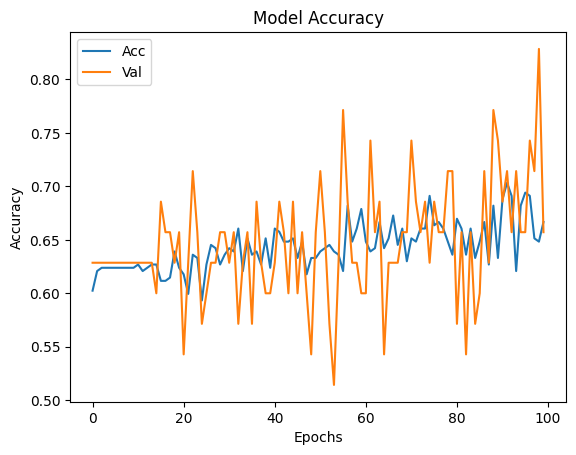

In [7]:
EPOCHS=100
MODELS=["EfficientNetV2L"]
DROP_OUT=[0.1,0.5]
#DROP_OUT=[0.1]
N_NEURONS=[16,64]
#N_NEURONS=[16]
RUNS=1
for r in range(RUNS):
    for m in MODELS:
        for n_neurons in N_NEURONS:
            for drop_out in DROP_OUT:
                for td,exp_index in zip(t_data, enumerate(t_data)):
                    #t_data --> [tg,vg,labels,filters_name,data_set_name]
                    tg=td[0]
                    vg=td[1]
                    test_gen=td[5]
                    labels=td[2]
                    filters_name=td[3]
                    data_set_name=td[4]
                    
                    mlflow.set_experiment(m+" "+filters_name+" "+data_set_name+" dropout "+str(drop_out)+" n_neurons "+str(n_neurons)+" epochs "+str(EPOCHS))
                    with mlflow.start_run():
                        
                        # #limpiar callbacks del experimento pasado
                        # directory='callbacks'
                        # for filename in os.listdir(directory):
                        #     #print ('callbacks/model.'+str(file)+'.h5')
                        #     f = os.path.join(directory, filename)
                        #     os.remove(f)
                        #     #mlflow.log_artifact(f)
                        
                        mlflow.tensorflow.autolog()
                        model=model_selector(m,labels,n_neurons,drop_out)

                        my_callbacks = [
                            #tf.keras.callbacks.ModelCheckpoint(filepath='callbacks/model.{epoch:02d}.h5')
                            tf.keras.callbacks.ModelCheckpoint(
                            filepath='callbacks/model.h5'
                            ,monitor='val_accuracy'
                            ,verbose=1
                            ,save_weights_only=True
                            ,save_best_only=True
                            ,mode='max')
                        ]

                        history = model.fit(x=tg,validation_data=vg,epochs=EPOCHS,callbacks=my_callbacks,batch_size=16)

                        checkpoint_path='callbacks/model.h5'
                        model.load_weights(checkpoint_path)

                        test_evaluate=model.evaluate(test_gen)

                        #Metrics

                        for key in history.history:
                            clean_key=" ".join(re.findall("[a-zA-Z]+", key))
                            mlflow.tensorflow.mlflow.log_metric(clean_key,history.history[key][0])

                        # mlflow.tensorflow.mlflow.log_metric("acc", history.history["accuracy"][0])
                        # mlflow.tensorflow.mlflow.log_metric("val_loss",history.history["val_loss"][0])
                        # mlflow.tensorflow.mlflow.log_metric("val_acc", history.history["val_accuracy"][0])
                        # mlflow.tensorflow.mlflow.log_metric("val_acc", history.history["precision"][0])
                        # mlflow.tensorflow.mlflow.log_metric("val_acc", history.history["recall"][0])

                        mlflow.tensorflow.mlflow.log_metric("test_loss", test_evaluate[0])
                        mlflow.tensorflow.mlflow.log_metric("test_acc", test_evaluate[1])
                        mlflow.tensorflow.mlflow.log_metric("test_precision", test_evaluate[1])
                        mlflow.tensorflow.mlflow.log_metric("test_recall", test_evaluate[1])

                        #Plots
                        plt.clf()
                        plt.plot(history.history['accuracy'])
                        plt.plot(history.history['val_accuracy'])
                        plt.title('Model Accuracy')
                        plt.xlabel('Epochs')
                        plt.ylabel('Accuracy')
                        plt.legend(['Acc','Val'], loc = 'upper left')
                        plt.savefig("Training Plot.png")

                        directory='callbacks'
                        for filename in os.listdir(directory):
                            #print ('callbacks/model.'+str(file)+'.h5')
                            f = os.path.join(directory, filename)
                            mlflow.log_artifact(f)

                        mlflow.log_artifact("Training Plot.png")
                    mlflow.end_run()


## vgg19

2023/02/26 22:03:32 INFO mlflow.tracking.fluent: Experiment with name 'vgg19 grayscale SanoVsFito dropout 0.1 n_neurons 16 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.7199 - accuracy: 0.4040 - precision: 0.4040 - recall: 0.4040
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 17s 556ms/step - loss: 0.7199 - accuracy: 0.4040 - precision: 0.4040 - recall: 0.4040 - val_loss: 0.6692 - val_accuracy: 0.6875 - val_precision: 0.6875 - val_recall: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6496 - accuracy: 0.6869 - precision: 0.6869 - recall: 0.6869
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 446ms/step - loss: 0.6496 - accuracy: 0.6869 - precision: 0.6869 - recall: 0.6869 - val_loss: 0.6281 - val_accuracy: 0.6875 - val_precision: 0.6875 - val_recall: 0.6875
Epoch 3/100
19/19 [==============================] - ETA: 0s - loss: 0.6242 - accuracy: 0.6869 - precision: 0.6869 - recall: 0.6869
Epoch 3: val_accuracy did not improve 

2023/02/26 22:17:45 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/26 22:17:45 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp69du8xc6\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp69du8xc6\model\data\model\assets
2023/02/26 22:18:06 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "c:\Users\USUARIO\anaconda3\envs\gpu_env\lib\site-packages\_distutils_hack\__init__.py:33: UserWarning: Setuptools is replacing distutils."


2/2 [==============================] - 1s 441ms/step - loss: 0.4415 - accuracy: 0.8500 - precision: 0.8500 - recall: 0.8500


2023/02/26 22:18:09 INFO mlflow.tracking.fluent: Experiment with name 'vgg19 grayscale Mazorca_SF dropout 0.1 n_neurons 16 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6724 - accuracy: 0.6239 - precision_1: 0.6239 - recall_1: 0.6239
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 12s 539ms/step - loss: 0.6724 - accuracy: 0.6239 - precision_1: 0.6239 - recall_1: 0.6239 - val_loss: 0.6608 - val_accuracy: 0.6286 - val_precision_1: 0.6286 - val_recall_1: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6611 - accuracy: 0.6239 - precision_1: 0.6239 - recall_1: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 8s 389ms/step - loss: 0.6611 - accuracy: 0.6239 - precision_1: 0.6239 - recall_1: 0.6239 - val_loss: 0.6571 - val_accuracy: 0.6286 - val_precision_1: 0.6286 - val_recall_1: 0.6286
Epoch 3/100
21/21 [==============================] - ETA: 0s - loss: 0.6576 - accuracy: 0.6239 - precision_1: 0.6239 - recall_1: 0.6239
Epoch 3: v

2023/02/26 22:31:58 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/26 22:31:58 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpi7tmk42v\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpi7tmk42v\model\data\model\assets


2/2 [==============================] - 0s 115ms/step - loss: 0.4618 - accuracy: 0.8500 - precision_1: 0.8500 - recall_1: 0.8500


2023/02/26 22:32:13 INFO mlflow.tracking.fluent: Experiment with name 'vgg19 grayscale Monoliosis EF_SF dropout 0.1 n_neurons 16 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6930 - accuracy: 0.5199 - precision_2: 0.5199 - recall_2: 0.5199
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 12s 522ms/step - loss: 0.6930 - accuracy: 0.5199 - precision_2: 0.5199 - recall_2: 0.5199 - val_loss: 0.6716 - val_accuracy: 0.6286 - val_precision_2: 0.6286 - val_recall_2: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6664 - accuracy: 0.6239 - precision_2: 0.6239 - recall_2: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 8s 402ms/step - loss: 0.6664 - accuracy: 0.6239 - precision_2: 0.6239 - recall_2: 0.6239 - val_loss: 0.6598 - val_accuracy: 0.6286 - val_precision_2: 0.6286 - val_recall_2: 0.6286
Epoch 3/100
21/21 [==============================] - ETA: 0s - loss: 0.6554 - accuracy: 0.6239 - precision_2: 0.6239 - recall_2: 0.6239
Epoch 3: v

2023/02/26 22:46:27 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/26 22:46:27 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpa_zyyny4\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpa_zyyny4\model\data\model\assets


2/2 [==============================] - 0s 77ms/step - loss: 0.1818 - accuracy: 1.0000 - precision_2: 1.0000 - recall_2: 1.0000


2023/02/26 22:46:40 INFO mlflow.tracking.fluent: Experiment with name 'vgg19 grayscale Monoliosis_Intermedia_SF dropout 0.1 n_neurons 16 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6990 - accuracy: 0.5066 - precision_3: 0.5066 - recall_3: 0.5066
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 12s 578ms/step - loss: 0.6990 - accuracy: 0.5066 - precision_3: 0.5066 - recall_3: 0.5066 - val_loss: 0.6609 - val_accuracy: 0.6875 - val_precision_3: 0.6875 - val_recall_3: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6537 - accuracy: 0.6755 - precision_3: 0.6755 - recall_3: 0.6755
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 8s 427ms/step - loss: 0.6537 - accuracy: 0.6755 - precision_3: 0.6755 - recall_3: 0.6755 - val_loss: 0.6344 - val_accuracy: 0.6875 - val_precision_3: 0.6875 - val_recall_3: 0.6875
Epoch 3/100
19/19 [==============================] - ETA: 0s - loss: 0.6319 - accuracy: 0.6755 - precision_3: 0.6755 - recall_3: 0.6755
Epoch 3: v

2023/02/26 23:00:29 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/26 23:00:29 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpbshi8slk\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpbshi8slk\model\data\model\assets


2/2 [==============================] - 0s 93ms/step - loss: 0.5596 - accuracy: 0.8500 - precision_3: 0.8500 - recall_3: 0.8500


2023/02/26 23:00:40 INFO mlflow.tracking.fluent: Experiment with name 'vgg19 grayscale SanoVsFito dropout 0.3 n_neurons 16 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6854 - accuracy: 0.5286 - precision_4: 0.5286 - recall_4: 0.5286
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 10s 502ms/step - loss: 0.6854 - accuracy: 0.5286 - precision_4: 0.5286 - recall_4: 0.5286 - val_loss: 0.6487 - val_accuracy: 0.6875 - val_precision_4: 0.6875 - val_recall_4: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6401 - accuracy: 0.6835 - precision_4: 0.6835 - recall_4: 0.6835
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 8s 443ms/step - loss: 0.6401 - accuracy: 0.6835 - precision_4: 0.6835 - recall_4: 0.6835 - val_loss: 0.6316 - val_accuracy: 0.6875 - val_precision_4: 0.6875 - val_recall_4: 0.6875
Epoch 3/100
19/19 [==============================] - ETA: 0s - loss: 0.6172 - accuracy: 0.6869 - precision_4: 0.6869 - recall_4: 0.6869
Epoch 3: v

2023/02/26 23:14:52 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/26 23:14:52 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp7c3_znvt\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp7c3_znvt\model\data\model\assets


2/2 [==============================] - 1s 101ms/step - loss: 0.5016 - accuracy: 0.7000 - precision_4: 0.7000 - recall_4: 0.7000


2023/02/26 23:15:06 INFO mlflow.tracking.fluent: Experiment with name 'vgg19 grayscale Mazorca_SF dropout 0.3 n_neurons 16 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6955 - accuracy: 0.4862 - precision_5: 0.4862 - recall_5: 0.4862
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 10s 443ms/step - loss: 0.6955 - accuracy: 0.4862 - precision_5: 0.4862 - recall_5: 0.4862 - val_loss: 0.6718 - val_accuracy: 0.6286 - val_precision_5: 0.6286 - val_recall_5: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6693 - accuracy: 0.6239 - precision_5: 0.6239 - recall_5: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 8s 384ms/step - loss: 0.6693 - accuracy: 0.6239 - precision_5: 0.6239 - recall_5: 0.6239 - val_loss: 0.6620 - val_accuracy: 0.6286 - val_precision_5: 0.6286 - val_recall_5: 0.6286
Epoch 3/100
21/21 [==============================] - ETA: 0s - loss: 0.6679 - accuracy: 0.6239 - precision_5: 0.6239 - recall_5: 0.6239
Epoch 3: v

2023/02/26 23:28:58 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/26 23:28:58 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpqejrkl0r\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpqejrkl0r\model\data\model\assets


2/2 [==============================] - 0s 64ms/step - loss: 0.5281 - accuracy: 0.8500 - precision_5: 0.8500 - recall_5: 0.8500


2023/02/26 23:29:10 INFO mlflow.tracking.fluent: Experiment with name 'vgg19 grayscale Monoliosis EF_SF dropout 0.3 n_neurons 16 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6743 - accuracy: 0.6239 - precision_6: 0.6239 - recall_6: 0.6239
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 10s 455ms/step - loss: 0.6743 - accuracy: 0.6239 - precision_6: 0.6239 - recall_6: 0.6239 - val_loss: 0.6616 - val_accuracy: 0.6286 - val_precision_6: 0.6286 - val_recall_6: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6649 - accuracy: 0.6239 - precision_6: 0.6239 - recall_6: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 9s 419ms/step - loss: 0.6649 - accuracy: 0.6239 - precision_6: 0.6239 - recall_6: 0.6239 - val_loss: 0.6551 - val_accuracy: 0.6286 - val_precision_6: 0.6286 - val_recall_6: 0.6286
Epoch 3/100
21/21 [==============================] - ETA: 0s - loss: 0.6553 - accuracy: 0.6239 - precision_6: 0.6239 - recall_6: 0.6239
Epoch 3: v

2023/02/26 23:43:25 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/26 23:43:25 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpxb_cjr36\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpxb_cjr36\model\data\model\assets


2/2 [==============================] - 0s 80ms/step - loss: 0.2120 - accuracy: 0.9500 - precision_6: 0.9500 - recall_6: 0.9500


2023/02/26 23:43:38 INFO mlflow.tracking.fluent: Experiment with name 'vgg19 grayscale Monoliosis_Intermedia_SF dropout 0.3 n_neurons 16 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6759 - accuracy: 0.5728 - precision_7: 0.5728 - recall_7: 0.5728
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 10s 492ms/step - loss: 0.6759 - accuracy: 0.5728 - precision_7: 0.5728 - recall_7: 0.5728 - val_loss: 0.6427 - val_accuracy: 0.6875 - val_precision_7: 0.6875 - val_recall_7: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6379 - accuracy: 0.6755 - precision_7: 0.6755 - recall_7: 0.6755
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 8s 429ms/step - loss: 0.6379 - accuracy: 0.6755 - precision_7: 0.6755 - recall_7: 0.6755 - val_loss: 0.6274 - val_accuracy: 0.6875 - val_precision_7: 0.6875 - val_recall_7: 0.6875
Epoch 3/100
19/19 [==============================] - ETA: 0s - loss: 0.6466 - accuracy: 0.6755 - precision_7: 0.6755 - recall_7: 0.6755
Epoch 3: v

2023/02/26 23:57:30 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/26 23:57:30 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp52h57yfi\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp52h57yfi\model\data\model\assets


2/2 [==============================] - 0s 99ms/step - loss: 0.5255 - accuracy: 0.8500 - precision_7: 0.8500 - recall_7: 0.8500


2023/02/26 23:57:41 INFO mlflow.tracking.fluent: Experiment with name 'vgg19 grayscale SanoVsFito dropout 0.5 n_neurons 16 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6461 - accuracy: 0.6700 - precision_8: 0.6700 - recall_8: 0.6700
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 10s 519ms/step - loss: 0.6461 - accuracy: 0.6700 - precision_8: 0.6700 - recall_8: 0.6700 - val_loss: 0.6278 - val_accuracy: 0.6875 - val_precision_8: 0.6875 - val_recall_8: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6218 - accuracy: 0.6869 - precision_8: 0.6869 - recall_8: 0.6869
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 8s 441ms/step - loss: 0.6218 - accuracy: 0.6869 - precision_8: 0.6869 - recall_8: 0.6869 - val_loss: 0.6196 - val_accuracy: 0.6875 - val_precision_8: 0.6875 - val_recall_8: 0.6875
Epoch 3/100
19/19 [==============================] - ETA: 0s - loss: 0.6428 - accuracy: 0.6869 - precision_8: 0.6869 - recall_8: 0.6869
Epoch 3: v

2023/02/27 00:11:47 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 00:11:47 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpdxjkq6p5\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpdxjkq6p5\model\data\model\assets


2/2 [==============================] - 1s 67ms/step - loss: 0.5068 - accuracy: 0.6500 - precision_8: 0.6500 - recall_8: 0.6500


2023/02/27 00:11:59 INFO mlflow.tracking.fluent: Experiment with name 'vgg19 grayscale Mazorca_SF dropout 0.5 n_neurons 16 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6845 - accuracy: 0.5688 - precision_9: 0.5688 - recall_9: 0.5688
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 10s 469ms/step - loss: 0.6845 - accuracy: 0.5688 - precision_9: 0.5688 - recall_9: 0.5688 - val_loss: 0.6701 - val_accuracy: 0.6286 - val_precision_9: 0.6286 - val_recall_9: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6713 - accuracy: 0.6208 - precision_9: 0.6208 - recall_9: 0.6208
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 8s 392ms/step - loss: 0.6713 - accuracy: 0.6208 - precision_9: 0.6208 - recall_9: 0.6208 - val_loss: 0.6604 - val_accuracy: 0.6286 - val_precision_9: 0.6286 - val_recall_9: 0.6286
Epoch 3/100
21/21 [==============================] - ETA: 0s - loss: 0.6651 - accuracy: 0.6239 - precision_9: 0.6239 - recall_9: 0.6239
Epoch 3: v

2023/02/27 00:25:50 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 00:25:50 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpqkkxl7f6\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpqkkxl7f6\model\data\model\assets


2/2 [==============================] - 0s 76ms/step - loss: 0.5420 - accuracy: 0.6500 - precision_9: 0.6500 - recall_9: 0.6500


2023/02/27 00:26:02 INFO mlflow.tracking.fluent: Experiment with name 'vgg19 grayscale Monoliosis EF_SF dropout 0.5 n_neurons 16 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6654 - accuracy: 0.5902 - precision_10: 0.5902 - recall_10: 0.5902
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 10s 462ms/step - loss: 0.6654 - accuracy: 0.5902 - precision_10: 0.5902 - recall_10: 0.5902 - val_loss: 0.6585 - val_accuracy: 0.6286 - val_precision_10: 0.6286 - val_recall_10: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6677 - accuracy: 0.6147 - precision_10: 0.6147 - recall_10: 0.6147
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 8s 400ms/step - loss: 0.6677 - accuracy: 0.6147 - precision_10: 0.6147 - recall_10: 0.6147 - val_loss: 0.6543 - val_accuracy: 0.6286 - val_precision_10: 0.6286 - val_recall_10: 0.6286
Epoch 3/100
21/21 [==============================] - ETA: 0s - loss: 0.6597 - accuracy: 0.6330 - precision_10: 0.6330 - recall_10: 0.6

2023/02/27 00:40:10 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 00:40:10 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpjzsnm_gc\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpjzsnm_gc\model\data\model\assets


2/2 [==============================] - 0s 73ms/step - loss: 0.3459 - accuracy: 0.9500 - precision_10: 0.9500 - recall_10: 0.9500


2023/02/27 00:40:22 INFO mlflow.tracking.fluent: Experiment with name 'vgg19 grayscale Monoliosis_Intermedia_SF dropout 0.5 n_neurons 16 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6706 - accuracy: 0.5861 - precision_11: 0.5861 - recall_11: 0.5861
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 10s 500ms/step - loss: 0.6706 - accuracy: 0.5861 - precision_11: 0.5861 - recall_11: 0.5861 - val_loss: 0.6402 - val_accuracy: 0.6875 - val_precision_11: 0.6875 - val_recall_11: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6314 - accuracy: 0.6689 - precision_11: 0.6689 - recall_11: 0.6689
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 8s 422ms/step - loss: 0.6314 - accuracy: 0.6689 - precision_11: 0.6689 - recall_11: 0.6689 - val_loss: 0.6258 - val_accuracy: 0.6875 - val_precision_11: 0.6875 - val_recall_11: 0.6875
Epoch 3/100
19/19 [==============================] - ETA: 0s - loss: 0.6429 - accuracy: 0.6755 - precision_11: 0.6755 - recall_11: 0.6

2023/02/27 00:54:12 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 00:54:12 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpj_4y8vlh\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpj_4y8vlh\model\data\model\assets


2/2 [==============================] - 0s 76ms/step - loss: 0.6001 - accuracy: 0.7000 - precision_11: 0.7000 - recall_11: 0.7000


2023/02/27 00:54:24 INFO mlflow.tracking.fluent: Experiment with name 'vgg19 grayscale SanoVsFito dropout 0.1 n_neurons 32 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6855 - accuracy: 0.5758 - precision_12: 0.5758 - recall_12: 0.5758
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 10s 517ms/step - loss: 0.6855 - accuracy: 0.5758 - precision_12: 0.5758 - recall_12: 0.5758 - val_loss: 0.6593 - val_accuracy: 0.6875 - val_precision_12: 0.6875 - val_recall_12: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6490 - accuracy: 0.6869 - precision_12: 0.6869 - recall_12: 0.6869
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 8s 441ms/step - loss: 0.6490 - accuracy: 0.6869 - precision_12: 0.6869 - recall_12: 0.6869 - val_loss: 0.6376 - val_accuracy: 0.6875 - val_precision_12: 0.6875 - val_recall_12: 0.6875
Epoch 3/100
19/19 [==============================] - ETA: 0s - loss: 0.6370 - accuracy: 0.6869 - precision_12: 0.6869 - recall_12: 0.6

2023/02/27 01:08:38 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 01:08:38 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpl6y5ays6\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpl6y5ays6\model\data\model\assets


2/2 [==============================] - 1s 94ms/step - loss: 0.4033 - accuracy: 0.9500 - precision_12: 0.9500 - recall_12: 0.9500


2023/02/27 01:08:50 INFO mlflow.tracking.fluent: Experiment with name 'vgg19 grayscale Mazorca_SF dropout 0.1 n_neurons 32 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6898 - accuracy: 0.5107 - precision_13: 0.5107 - recall_13: 0.5107
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 10s 455ms/step - loss: 0.6898 - accuracy: 0.5107 - precision_13: 0.5107 - recall_13: 0.5107 - val_loss: 0.6730 - val_accuracy: 0.6286 - val_precision_13: 0.6286 - val_recall_13: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6670 - accuracy: 0.6239 - precision_13: 0.6239 - recall_13: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 8s 401ms/step - loss: 0.6670 - accuracy: 0.6239 - precision_13: 0.6239 - recall_13: 0.6239 - val_loss: 0.6626 - val_accuracy: 0.6286 - val_precision_13: 0.6286 - val_recall_13: 0.6286
Epoch 3/100
21/21 [==============================] - ETA: 0s - loss: 0.6616 - accuracy: 0.6239 - precision_13: 0.6239 - recall_13: 0.6

2023/02/27 01:22:49 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 01:22:49 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpim3kqkh4\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpim3kqkh4\model\data\model\assets


2/2 [==============================] - 0s 80ms/step - loss: 0.4512 - accuracy: 0.8000 - precision_13: 0.8000 - recall_13: 0.8000


2023/02/27 01:23:01 INFO mlflow.tracking.fluent: Experiment with name 'vgg19 grayscale Monoliosis EF_SF dropout 0.1 n_neurons 32 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6734 - accuracy: 0.6239 - precision_14: 0.6239 - recall_14: 0.6239
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 11s 465ms/step - loss: 0.6734 - accuracy: 0.6239 - precision_14: 0.6239 - recall_14: 0.6239 - val_loss: 0.6619 - val_accuracy: 0.6286 - val_precision_14: 0.6286 - val_recall_14: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6599 - accuracy: 0.6239 - precision_14: 0.6239 - recall_14: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 8s 398ms/step - loss: 0.6599 - accuracy: 0.6239 - precision_14: 0.6239 - recall_14: 0.6239 - val_loss: 0.6564 - val_accuracy: 0.6286 - val_precision_14: 0.6286 - val_recall_14: 0.6286
Epoch 3/100
21/21 [==============================] - ETA: 0s - loss: 0.6559 - accuracy: 0.6239 - precision_14: 0.6239 - recall_14: 0.6

2023/02/27 01:37:21 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 01:37:21 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpb7u76n5o\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpb7u76n5o\model\data\model\assets


2/2 [==============================] - 0s 87ms/step - loss: 0.1482 - accuracy: 1.0000 - precision_14: 1.0000 - recall_14: 1.0000


2023/02/27 01:37:33 INFO mlflow.tracking.fluent: Experiment with name 'vgg19 grayscale Monoliosis_Intermedia_SF dropout 0.1 n_neurons 32 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6730 - accuracy: 0.6291 - precision_15: 0.6291 - recall_15: 0.6291
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 10s 500ms/step - loss: 0.6730 - accuracy: 0.6291 - precision_15: 0.6291 - recall_15: 0.6291 - val_loss: 0.6493 - val_accuracy: 0.6875 - val_precision_15: 0.6875 - val_recall_15: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6435 - accuracy: 0.6755 - precision_15: 0.6755 - recall_15: 0.6755
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 8s 433ms/step - loss: 0.6435 - accuracy: 0.6755 - precision_15: 0.6755 - recall_15: 0.6755 - val_loss: 0.6270 - val_accuracy: 0.6875 - val_precision_15: 0.6875 - val_recall_15: 0.6875
Epoch 3/100
19/19 [==============================] - ETA: 0s - loss: 0.6352 - accuracy: 0.6755 - precision_15: 0.6755 - recall_15: 0.6

2023/02/27 01:51:25 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 01:51:25 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpdk_mcrjo\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpdk_mcrjo\model\data\model\assets


2/2 [==============================] - 0s 81ms/step - loss: 0.4292 - accuracy: 0.9500 - precision_15: 0.9500 - recall_15: 0.9500


2023/02/27 01:51:38 INFO mlflow.tracking.fluent: Experiment with name 'vgg19 grayscale SanoVsFito dropout 0.3 n_neurons 32 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6560 - accuracy: 0.6869 - precision_16: 0.6869 - recall_16: 0.6869
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 10s 513ms/step - loss: 0.6560 - accuracy: 0.6869 - precision_16: 0.6869 - recall_16: 0.6869 - val_loss: 0.6429 - val_accuracy: 0.6875 - val_precision_16: 0.6875 - val_recall_16: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6337 - accuracy: 0.6869 - precision_16: 0.6869 - recall_16: 0.6869
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 8s 446ms/step - loss: 0.6337 - accuracy: 0.6869 - precision_16: 0.6869 - recall_16: 0.6869 - val_loss: 0.6315 - val_accuracy: 0.6875 - val_precision_16: 0.6875 - val_recall_16: 0.6875
Epoch 3/100
19/19 [==============================] - ETA: 0s - loss: 0.6336 - accuracy: 0.6869 - precision_16: 0.6869 - recall_16: 0.6

2023/02/27 02:05:44 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 02:05:44 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpqvzr3ku0\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpqvzr3ku0\model\data\model\assets


2/2 [==============================] - 1s 104ms/step - loss: 0.4555 - accuracy: 0.8500 - precision_16: 0.8500 - recall_16: 0.8500


2023/02/27 02:05:56 INFO mlflow.tracking.fluent: Experiment with name 'vgg19 grayscale Mazorca_SF dropout 0.3 n_neurons 32 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6738 - accuracy: 0.6177 - precision_17: 0.6177 - recall_17: 0.6177
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 10s 455ms/step - loss: 0.6738 - accuracy: 0.6177 - precision_17: 0.6177 - recall_17: 0.6177 - val_loss: 0.6636 - val_accuracy: 0.6286 - val_precision_17: 0.6286 - val_recall_17: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6647 - accuracy: 0.6239 - precision_17: 0.6239 - recall_17: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 8s 388ms/step - loss: 0.6647 - accuracy: 0.6239 - precision_17: 0.6239 - recall_17: 0.6239 - val_loss: 0.6605 - val_accuracy: 0.6286 - val_precision_17: 0.6286 - val_recall_17: 0.6286
Epoch 3/100
21/21 [==============================] - ETA: 0s - loss: 0.6611 - accuracy: 0.6239 - precision_17: 0.6239 - recall_17: 0.6

2023/02/27 02:19:51 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 02:19:51 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp1g7wyjdr\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp1g7wyjdr\model\data\model\assets


2/2 [==============================] - 0s 69ms/step - loss: 0.4877 - accuracy: 0.8000 - precision_17: 0.8000 - recall_17: 0.8000


2023/02/27 02:20:03 INFO mlflow.tracking.fluent: Experiment with name 'vgg19 grayscale Monoliosis EF_SF dropout 0.3 n_neurons 32 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6972 - accuracy: 0.4862 - precision_18: 0.4862 - recall_18: 0.4862
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 11s 476ms/step - loss: 0.6972 - accuracy: 0.4862 - precision_18: 0.4862 - recall_18: 0.4862 - val_loss: 0.6783 - val_accuracy: 0.6286 - val_precision_18: 0.6286 - val_recall_18: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6741 - accuracy: 0.6239 - precision_18: 0.6239 - recall_18: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 9s 406ms/step - loss: 0.6741 - accuracy: 0.6239 - precision_18: 0.6239 - recall_18: 0.6239 - val_loss: 0.6648 - val_accuracy: 0.6286 - val_precision_18: 0.6286 - val_recall_18: 0.6286
Epoch 3/100
21/21 [==============================] - ETA: 0s - loss: 0.6637 - accuracy: 0.6239 - precision_18: 0.6239 - recall_18: 0.6

2023/02/27 02:34:17 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 02:34:17 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpvc1ducgn\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpvc1ducgn\model\data\model\assets


2/2 [==============================] - 0s 99ms/step - loss: 0.2000 - accuracy: 1.0000 - precision_18: 1.0000 - recall_18: 1.0000


2023/02/27 02:34:28 INFO mlflow.tracking.fluent: Experiment with name 'vgg19 grayscale Monoliosis_Intermedia_SF dropout 0.3 n_neurons 32 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6717 - accuracy: 0.6722 - precision_19: 0.6722 - recall_19: 0.6722
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 10s 491ms/step - loss: 0.6717 - accuracy: 0.6722 - precision_19: 0.6722 - recall_19: 0.6722 - val_loss: 0.6512 - val_accuracy: 0.6875 - val_precision_19: 0.6875 - val_recall_19: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6391 - accuracy: 0.6755 - precision_19: 0.6755 - recall_19: 0.6755
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 8s 444ms/step - loss: 0.6391 - accuracy: 0.6755 - precision_19: 0.6755 - recall_19: 0.6755 - val_loss: 0.6294 - val_accuracy: 0.6875 - val_precision_19: 0.6875 - val_recall_19: 0.6875
Epoch 3/100
19/19 [==============================] - ETA: 0s - loss: 0.6324 - accuracy: 0.6755 - precision_19: 0.6755 - recall_19: 0.6

2023/02/27 02:48:18 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 02:48:18 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp310d9ri2\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp310d9ri2\model\data\model\assets


2/2 [==============================] - 0s 87ms/step - loss: 0.6017 - accuracy: 0.7000 - precision_19: 0.7000 - recall_19: 0.7000


2023/02/27 02:48:31 INFO mlflow.tracking.fluent: Experiment with name 'vgg19 grayscale SanoVsFito dropout 0.5 n_neurons 32 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6870 - accuracy: 0.5724 - precision_20: 0.5724 - recall_20: 0.5724
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 10s 489ms/step - loss: 0.6870 - accuracy: 0.5724 - precision_20: 0.5724 - recall_20: 0.5724 - val_loss: 0.6593 - val_accuracy: 0.6875 - val_precision_20: 0.6875 - val_recall_20: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6483 - accuracy: 0.6869 - precision_20: 0.6869 - recall_20: 0.6869
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 8s 451ms/step - loss: 0.6483 - accuracy: 0.6869 - precision_20: 0.6869 - recall_20: 0.6869 - val_loss: 0.6400 - val_accuracy: 0.6875 - val_precision_20: 0.6875 - val_recall_20: 0.6875
Epoch 3/100
19/19 [==============================] - ETA: 0s - loss: 0.6401 - accuracy: 0.6869 - precision_20: 0.6869 - recall_20: 0.6

2023/02/27 03:02:38 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 03:02:38 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmphvv7aig5\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmphvv7aig5\model\data\model\assets


2/2 [==============================] - 1s 115ms/step - loss: 0.5208 - accuracy: 0.7500 - precision_20: 0.7500 - recall_20: 0.7500


2023/02/27 03:02:51 INFO mlflow.tracking.fluent: Experiment with name 'vgg19 grayscale Mazorca_SF dropout 0.5 n_neurons 32 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6745 - accuracy: 0.6177 - precision_21: 0.6177 - recall_21: 0.6177
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 10s 451ms/step - loss: 0.6745 - accuracy: 0.6177 - precision_21: 0.6177 - recall_21: 0.6177 - val_loss: 0.6650 - val_accuracy: 0.6286 - val_precision_21: 0.6286 - val_recall_21: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6676 - accuracy: 0.6239 - precision_21: 0.6239 - recall_21: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 8s 392ms/step - loss: 0.6676 - accuracy: 0.6239 - precision_21: 0.6239 - recall_21: 0.6239 - val_loss: 0.6592 - val_accuracy: 0.6286 - val_precision_21: 0.6286 - val_recall_21: 0.6286
Epoch 3/100
21/21 [==============================] - ETA: 0s - loss: 0.6612 - accuracy: 0.6239 - precision_21: 0.6239 - recall_21: 0.6

2023/02/27 03:16:43 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 03:16:43 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp9rsq5fa9\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp9rsq5fa9\model\data\model\assets


2/2 [==============================] - 0s 92ms/step - loss: 0.5463 - accuracy: 0.7000 - precision_21: 0.7000 - recall_21: 0.7000


2023/02/27 03:16:54 INFO mlflow.tracking.fluent: Experiment with name 'vgg19 grayscale Monoliosis EF_SF dropout 0.5 n_neurons 32 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6778 - accuracy: 0.6086 - precision_22: 0.6086 - recall_22: 0.6086
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 10s 459ms/step - loss: 0.6778 - accuracy: 0.6086 - precision_22: 0.6086 - recall_22: 0.6086 - val_loss: 0.6690 - val_accuracy: 0.6286 - val_precision_22: 0.6286 - val_recall_22: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6670 - accuracy: 0.6269 - precision_22: 0.6269 - recall_22: 0.6269
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 8s 398ms/step - loss: 0.6670 - accuracy: 0.6269 - precision_22: 0.6269 - recall_22: 0.6269 - val_loss: 0.6609 - val_accuracy: 0.6286 - val_precision_22: 0.6286 - val_recall_22: 0.6286
Epoch 3/100
21/21 [==============================] - ETA: 0s - loss: 0.6500 - accuracy: 0.6239 - precision_22: 0.6239 - recall_22: 0.6

2023/02/27 03:31:04 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 03:31:04 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpkgu0464y\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpkgu0464y\model\data\model\assets


2/2 [==============================] - 0s 69ms/step - loss: 0.3522 - accuracy: 0.9500 - precision_22: 0.9500 - recall_22: 0.9500


2023/02/27 03:31:16 INFO mlflow.tracking.fluent: Experiment with name 'vgg19 grayscale Monoliosis_Intermedia_SF dropout 0.5 n_neurons 32 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6859 - accuracy: 0.5695 - precision_23: 0.5695 - recall_23: 0.5695
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 11s 537ms/step - loss: 0.6859 - accuracy: 0.5695 - precision_23: 0.5695 - recall_23: 0.5695 - val_loss: 0.6535 - val_accuracy: 0.6875 - val_precision_23: 0.6875 - val_recall_23: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6468 - accuracy: 0.6689 - precision_23: 0.6689 - recall_23: 0.6689
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 8s 434ms/step - loss: 0.6468 - accuracy: 0.6689 - precision_23: 0.6689 - recall_23: 0.6689 - val_loss: 0.6353 - val_accuracy: 0.6875 - val_precision_23: 0.6875 - val_recall_23: 0.6875
Epoch 3/100
19/19 [==============================] - ETA: 0s - loss: 0.6410 - accuracy: 0.6755 - precision_23: 0.6755 - recall_23: 0.6

2023/02/27 03:45:15 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 03:45:15 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpww0v0dy_\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpww0v0dy_\model\data\model\assets


2/2 [==============================] - 0s 80ms/step - loss: 0.6012 - accuracy: 0.5500 - precision_23: 0.5500 - recall_23: 0.5500


2023/02/27 03:45:27 INFO mlflow.tracking.fluent: Experiment with name 'vgg19 grayscale SanoVsFito dropout 0.1 n_neurons 64 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6732 - accuracy: 0.6768 - precision_24: 0.6768 - recall_24: 0.6768
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 10s 500ms/step - loss: 0.6732 - accuracy: 0.6768 - precision_24: 0.6768 - recall_24: 0.6768 - val_loss: 0.6537 - val_accuracy: 0.6875 - val_precision_24: 0.6875 - val_recall_24: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6470 - accuracy: 0.6869 - precision_24: 0.6869 - recall_24: 0.6869
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 8s 439ms/step - loss: 0.6470 - accuracy: 0.6869 - precision_24: 0.6869 - recall_24: 0.6869 - val_loss: 0.6394 - val_accuracy: 0.6875 - val_precision_24: 0.6875 - val_recall_24: 0.6875
Epoch 3/100
19/19 [==============================] - ETA: 0s - loss: 0.6370 - accuracy: 0.6869 - precision_24: 0.6869 - recall_24: 0.6

2023/02/27 03:59:34 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 03:59:34 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp3rlaf8kr\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp3rlaf8kr\model\data\model\assets


2/2 [==============================] - 1s 68ms/step - loss: 0.3562 - accuracy: 1.0000 - precision_24: 1.0000 - recall_24: 1.0000


2023/02/27 03:59:46 INFO mlflow.tracking.fluent: Experiment with name 'vgg19 grayscale Mazorca_SF dropout 0.1 n_neurons 64 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6840 - accuracy: 0.5933 - precision_25: 0.5933 - recall_25: 0.5933
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 10s 441ms/step - loss: 0.6840 - accuracy: 0.5933 - precision_25: 0.5933 - recall_25: 0.5933 - val_loss: 0.6738 - val_accuracy: 0.6286 - val_precision_25: 0.6286 - val_recall_25: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6705 - accuracy: 0.6239 - precision_25: 0.6239 - recall_25: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 8s 397ms/step - loss: 0.6705 - accuracy: 0.6239 - precision_25: 0.6239 - recall_25: 0.6239 - val_loss: 0.6637 - val_accuracy: 0.6286 - val_precision_25: 0.6286 - val_recall_25: 0.6286
Epoch 3/100
21/21 [==============================] - ETA: 0s - loss: 0.6617 - accuracy: 0.6239 - precision_25: 0.6239 - recall_25: 0.6

2023/02/27 04:13:36 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 04:13:36 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpjc1zthie\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpjc1zthie\model\data\model\assets


2/2 [==============================] - 0s 70ms/step - loss: 0.5019 - accuracy: 0.8000 - precision_25: 0.8000 - recall_25: 0.8000


2023/02/27 04:13:48 INFO mlflow.tracking.fluent: Experiment with name 'vgg19 grayscale Monoliosis EF_SF dropout 0.1 n_neurons 64 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6748 - accuracy: 0.6239 - precision_26: 0.6239 - recall_26: 0.6239
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 10s 467ms/step - loss: 0.6748 - accuracy: 0.6239 - precision_26: 0.6239 - recall_26: 0.6239 - val_loss: 0.6652 - val_accuracy: 0.6286 - val_precision_26: 0.6286 - val_recall_26: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6630 - accuracy: 0.6239 - precision_26: 0.6239 - recall_26: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 8s 405ms/step - loss: 0.6630 - accuracy: 0.6239 - precision_26: 0.6239 - recall_26: 0.6239 - val_loss: 0.6582 - val_accuracy: 0.6286 - val_precision_26: 0.6286 - val_recall_26: 0.6286
Epoch 3/100
21/21 [==============================] - ETA: 0s - loss: 0.6558 - accuracy: 0.6239 - precision_26: 0.6239 - recall_26: 0.6

2023/02/27 04:27:55 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 04:27:55 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp_mehf_gi\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp_mehf_gi\model\data\model\assets


2/2 [==============================] - 0s 68ms/step - loss: 0.1695 - accuracy: 1.0000 - precision_26: 1.0000 - recall_26: 1.0000


2023/02/27 04:28:08 INFO mlflow.tracking.fluent: Experiment with name 'vgg19 grayscale Monoliosis_Intermedia_SF dropout 0.1 n_neurons 64 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6687 - accuracy: 0.6755 - precision_27: 0.6755 - recall_27: 0.6755
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 10s 483ms/step - loss: 0.6687 - accuracy: 0.6755 - precision_27: 0.6755 - recall_27: 0.6755 - val_loss: 0.6477 - val_accuracy: 0.6875 - val_precision_27: 0.6875 - val_recall_27: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6480 - accuracy: 0.6755 - precision_27: 0.6755 - recall_27: 0.6755
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 8s 440ms/step - loss: 0.6480 - accuracy: 0.6755 - precision_27: 0.6755 - recall_27: 0.6755 - val_loss: 0.6362 - val_accuracy: 0.6875 - val_precision_27: 0.6875 - val_recall_27: 0.6875
Epoch 3/100
19/19 [==============================] - ETA: 0s - loss: 0.6386 - accuracy: 0.6755 - precision_27: 0.6755 - recall_27: 0.6

2023/02/27 04:41:59 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 04:41:59 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp_iu59apa\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp_iu59apa\model\data\model\assets


2/2 [==============================] - 0s 92ms/step - loss: 0.4994 - accuracy: 0.8500 - precision_27: 0.8500 - recall_27: 0.8500


2023/02/27 04:42:11 INFO mlflow.tracking.fluent: Experiment with name 'vgg19 grayscale SanoVsFito dropout 0.3 n_neurons 64 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6674 - accuracy: 0.6835 - precision_28: 0.6835 - recall_28: 0.6835
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 10s 522ms/step - loss: 0.6674 - accuracy: 0.6835 - precision_28: 0.6835 - recall_28: 0.6835 - val_loss: 0.6484 - val_accuracy: 0.6875 - val_precision_28: 0.6875 - val_recall_28: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6389 - accuracy: 0.6869 - precision_28: 0.6869 - recall_28: 0.6869
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 8s 443ms/step - loss: 0.6389 - accuracy: 0.6869 - precision_28: 0.6869 - recall_28: 0.6869 - val_loss: 0.6334 - val_accuracy: 0.6875 - val_precision_28: 0.6875 - val_recall_28: 0.6875
Epoch 3/100
19/19 [==============================] - ETA: 0s - loss: 0.6342 - accuracy: 0.6869 - precision_28: 0.6869 - recall_28: 0.6

2023/02/27 04:56:20 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 04:56:20 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmppt5sn0ob\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmppt5sn0ob\model\data\model\assets


2/2 [==============================] - 1s 73ms/step - loss: 0.4331 - accuracy: 0.9000 - precision_28: 0.9000 - recall_28: 0.9000


2023/02/27 04:56:32 INFO mlflow.tracking.fluent: Experiment with name 'vgg19 grayscale Mazorca_SF dropout 0.3 n_neurons 64 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6879 - accuracy: 0.5505 - precision_29: 0.5505 - recall_29: 0.5505
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 10s 441ms/step - loss: 0.6879 - accuracy: 0.5505 - precision_29: 0.5505 - recall_29: 0.5505 - val_loss: 0.6732 - val_accuracy: 0.6286 - val_precision_29: 0.6286 - val_recall_29: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6701 - accuracy: 0.6239 - precision_29: 0.6239 - recall_29: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 8s 402ms/step - loss: 0.6701 - accuracy: 0.6239 - precision_29: 0.6239 - recall_29: 0.6239 - val_loss: 0.6636 - val_accuracy: 0.6286 - val_precision_29: 0.6286 - val_recall_29: 0.6286
Epoch 3/100
21/21 [==============================] - ETA: 0s - loss: 0.6624 - accuracy: 0.6239 - precision_29: 0.6239 - recall_29: 0.6

2023/02/27 05:10:27 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 05:10:27 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpjq_c644m\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpjq_c644m\model\data\model\assets


2/2 [==============================] - 0s 80ms/step - loss: 0.5186 - accuracy: 0.7500 - precision_29: 0.7500 - recall_29: 0.7500


2023/02/27 05:10:39 INFO mlflow.tracking.fluent: Experiment with name 'vgg19 grayscale Monoliosis EF_SF dropout 0.3 n_neurons 64 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6823 - accuracy: 0.6208 - precision_30: 0.6208 - recall_30: 0.6208
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 10s 466ms/step - loss: 0.6823 - accuracy: 0.6208 - precision_30: 0.6208 - recall_30: 0.6208 - val_loss: 0.6680 - val_accuracy: 0.6286 - val_precision_30: 0.6286 - val_recall_30: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6623 - accuracy: 0.6239 - precision_30: 0.6239 - recall_30: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 8s 386ms/step - loss: 0.6623 - accuracy: 0.6239 - precision_30: 0.6239 - recall_30: 0.6239 - val_loss: 0.6552 - val_accuracy: 0.6286 - val_precision_30: 0.6286 - val_recall_30: 0.6286
Epoch 3/100
21/21 [==============================] - ETA: 0s - loss: 0.6647 - accuracy: 0.6239 - precision_30: 0.6239 - recall_30: 0.6

2023/02/27 05:24:48 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 05:24:48 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpa4ql145c\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpa4ql145c\model\data\model\assets


2/2 [==============================] - 0s 91ms/step - loss: 0.2201 - accuracy: 1.0000 - precision_30: 1.0000 - recall_30: 1.0000


2023/02/27 05:25:00 INFO mlflow.tracking.fluent: Experiment with name 'vgg19 grayscale Monoliosis_Intermedia_SF dropout 0.3 n_neurons 64 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6839 - accuracy: 0.5927 - precision_31: 0.5927 - recall_31: 0.5927
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 10s 494ms/step - loss: 0.6839 - accuracy: 0.5927 - precision_31: 0.5927 - recall_31: 0.5927 - val_loss: 0.6597 - val_accuracy: 0.6875 - val_precision_31: 0.6875 - val_recall_31: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6516 - accuracy: 0.6755 - precision_31: 0.6755 - recall_31: 0.6755
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 8s 430ms/step - loss: 0.6516 - accuracy: 0.6755 - precision_31: 0.6755 - recall_31: 0.6755 - val_loss: 0.6422 - val_accuracy: 0.6875 - val_precision_31: 0.6875 - val_recall_31: 0.6875
Epoch 3/100
19/19 [==============================] - ETA: 0s - loss: 0.6462 - accuracy: 0.6755 - precision_31: 0.6755 - recall_31: 0.6

2023/02/27 05:38:53 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 05:38:53 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpu_4o66ca\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpu_4o66ca\model\data\model\assets


2/2 [==============================] - 0s 98ms/step - loss: 0.6299 - accuracy: 0.5500 - precision_31: 0.5500 - recall_31: 0.5500


2023/02/27 05:39:06 INFO mlflow.tracking.fluent: Experiment with name 'vgg19 grayscale SanoVsFito dropout 0.5 n_neurons 64 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6760 - accuracy: 0.6330 - precision_32: 0.6330 - recall_32: 0.6330
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 10s 512ms/step - loss: 0.6760 - accuracy: 0.6330 - precision_32: 0.6330 - recall_32: 0.6330 - val_loss: 0.6551 - val_accuracy: 0.6875 - val_precision_32: 0.6875 - val_recall_32: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6495 - accuracy: 0.6869 - precision_32: 0.6869 - recall_32: 0.6869
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 8s 445ms/step - loss: 0.6495 - accuracy: 0.6869 - precision_32: 0.6869 - recall_32: 0.6869 - val_loss: 0.6365 - val_accuracy: 0.6875 - val_precision_32: 0.6875 - val_recall_32: 0.6875
Epoch 3/100
19/19 [==============================] - ETA: 0s - loss: 0.6351 - accuracy: 0.6869 - precision_32: 0.6869 - recall_32: 0.6

2023/02/27 05:53:28 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 05:53:28 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp4ae5_z44\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp4ae5_z44\model\data\model\assets


2/2 [==============================] - 1s 151ms/step - loss: 0.5234 - accuracy: 0.7000 - precision_32: 0.7000 - recall_32: 0.7000


2023/02/27 05:53:42 INFO mlflow.tracking.fluent: Experiment with name 'vgg19 grayscale Mazorca_SF dropout 0.5 n_neurons 64 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6842 - accuracy: 0.5841 - precision_33: 0.5841 - recall_33: 0.5841
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 11s 465ms/step - loss: 0.6842 - accuracy: 0.5841 - precision_33: 0.5841 - recall_33: 0.5841 - val_loss: 0.6733 - val_accuracy: 0.6286 - val_precision_33: 0.6286 - val_recall_33: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6709 - accuracy: 0.6239 - precision_33: 0.6239 - recall_33: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 9s 440ms/step - loss: 0.6709 - accuracy: 0.6239 - precision_33: 0.6239 - recall_33: 0.6239 - val_loss: 0.6662 - val_accuracy: 0.6286 - val_precision_33: 0.6286 - val_recall_33: 0.6286
Epoch 3/100
21/21 [==============================] - ETA: 0s - loss: 0.6660 - accuracy: 0.6239 - precision_33: 0.6239 - recall_33: 0.6

2023/02/27 06:07:47 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 06:07:47 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp2ukt4112\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp2ukt4112\model\data\model\assets


2/2 [==============================] - 0s 80ms/step - loss: 0.5547 - accuracy: 0.7000 - precision_33: 0.7000 - recall_33: 0.7000


2023/02/27 06:07:59 INFO mlflow.tracking.fluent: Experiment with name 'vgg19 grayscale Monoliosis EF_SF dropout 0.5 n_neurons 64 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6803 - accuracy: 0.6116 - precision_34: 0.6116 - recall_34: 0.6116
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 10s 435ms/step - loss: 0.6803 - accuracy: 0.6116 - precision_34: 0.6116 - recall_34: 0.6116 - val_loss: 0.6707 - val_accuracy: 0.6286 - val_precision_34: 0.6286 - val_recall_34: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6707 - accuracy: 0.6239 - precision_34: 0.6239 - recall_34: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 8s 401ms/step - loss: 0.6707 - accuracy: 0.6239 - precision_34: 0.6239 - recall_34: 0.6239 - val_loss: 0.6646 - val_accuracy: 0.6286 - val_precision_34: 0.6286 - val_recall_34: 0.6286
Epoch 3/100
21/21 [==============================] - ETA: 0s - loss: 0.6655 - accuracy: 0.6239 - precision_34: 0.6239 - recall_34: 0.6

2023/02/27 06:22:09 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 06:22:09 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpotyuf1ps\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpotyuf1ps\model\data\model\assets


2/2 [==============================] - 0s 86ms/step - loss: 0.2553 - accuracy: 0.9500 - precision_34: 0.9500 - recall_34: 0.9500


2023/02/27 06:22:20 INFO mlflow.tracking.fluent: Experiment with name 'vgg19 grayscale Monoliosis_Intermedia_SF dropout 0.5 n_neurons 64 epochs 100' does not exist. Creating a new experiment.


Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6771 - accuracy: 0.6623 - precision_35: 0.6623 - recall_35: 0.6623
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 10s 494ms/step - loss: 0.6771 - accuracy: 0.6623 - precision_35: 0.6623 - recall_35: 0.6623 - val_loss: 0.6595 - val_accuracy: 0.6875 - val_precision_35: 0.6875 - val_recall_35: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6561 - accuracy: 0.6755 - precision_35: 0.6755 - recall_35: 0.6755
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 8s 436ms/step - loss: 0.6561 - accuracy: 0.6755 - precision_35: 0.6755 - recall_35: 0.6755 - val_loss: 0.6440 - val_accuracy: 0.6875 - val_precision_35: 0.6875 - val_recall_35: 0.6875
Epoch 3/100
19/19 [==============================] - ETA: 0s - loss: 0.6421 - accuracy: 0.6755 - precision_35: 0.6755 - recall_35: 0.6

2023/02/27 06:36:19 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 06:36:19 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpuell2h2u\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpuell2h2u\model\data\model\assets


2/2 [==============================] - 0s 92ms/step - loss: 0.5749 - accuracy: 0.7000 - precision_35: 0.7000 - recall_35: 0.7000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6399 - accuracy: 0.6869 - precision_36: 0.6869 - recall_36: 0.6869
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 10s 513ms/step - loss: 0.6399 - accuracy: 0.6869 - precision_36: 0.6869 - recall_36: 0.6869 - val_loss: 0.6261 - val_accuracy: 0.6875 - val_precision_36: 0.6875 - val_recall_36: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6232 - accuracy: 0.6869 - precision_36: 0.6869 - recall_36: 0.6869
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 451ms/step - loss: 0.6232 - accuracy: 0.6869 - precision_36: 0.6869 - recall_36: 0.6869 - val_loss: 0.6231 - val_accuracy: 0.6875 - val_precision_36: 0.6875 - val_recall_36: 0.6875
Epoch

2023/02/27 06:50:38 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 06:50:38 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp6f_rn1xj\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp6f_rn1xj\model\data\model\assets


2/2 [==============================] - 1s 130ms/step - loss: 0.3904 - accuracy: 0.9500 - precision_36: 0.9500 - recall_36: 0.9500
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6643 - accuracy: 0.6239 - precision_37: 0.6239 - recall_37: 0.6239
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 10s 455ms/step - loss: 0.6643 - accuracy: 0.6239 - precision_37: 0.6239 - recall_37: 0.6239 - val_loss: 0.6588 - val_accuracy: 0.6286 - val_precision_37: 0.6286 - val_recall_37: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6616 - accuracy: 0.6239 - precision_37: 0.6239 - recall_37: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 8s 393ms/step - loss: 0.6616 - accuracy: 0.6239 - precision_37: 0.6239 - recall_37: 0.6239 - val_loss: 0.6561 - val_accuracy: 0.6286 - val_precision_37: 0.6286 - val_recall_37: 0.6286
Epoc

2023/02/27 07:04:47 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 07:04:47 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpkrs5fk4u\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpkrs5fk4u\model\data\model\assets


2/2 [==============================] - 0s 89ms/step - loss: 0.5728 - accuracy: 0.7500 - precision_37: 0.7500 - recall_37: 0.7500
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6829 - accuracy: 0.5749 - precision_38: 0.5749 - recall_38: 0.5749
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 11s 466ms/step - loss: 0.6829 - accuracy: 0.5749 - precision_38: 0.5749 - recall_38: 0.5749 - val_loss: 0.6626 - val_accuracy: 0.6286 - val_precision_38: 0.6286 - val_recall_38: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6618 - accuracy: 0.6239 - precision_38: 0.6239 - recall_38: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 8s 396ms/step - loss: 0.6618 - accuracy: 0.6239 - precision_38: 0.6239 - recall_38: 0.6239 - val_loss: 0.6519 - val_accuracy: 0.6286 - val_precision_38: 0.6286 - val_recall_38: 0.6286
Epoch

2023/02/27 07:19:16 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 07:19:16 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpjkfcri5n\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpjkfcri5n\model\data\model\assets


2/2 [==============================] - 0s 69ms/step - loss: 0.1771 - accuracy: 1.0000 - precision_38: 1.0000 - recall_38: 1.0000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6664 - accuracy: 0.6722 - precision_39: 0.6722 - recall_39: 0.6722
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 10s 475ms/step - loss: 0.6664 - accuracy: 0.6722 - precision_39: 0.6722 - recall_39: 0.6722 - val_loss: 0.6457 - val_accuracy: 0.6875 - val_precision_39: 0.6875 - val_recall_39: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6410 - accuracy: 0.6755 - precision_39: 0.6755 - recall_39: 0.6755
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 8s 428ms/step - loss: 0.6410 - accuracy: 0.6755 - precision_39: 0.6755 - recall_39: 0.6755 - val_loss: 0.6308 - val_accuracy: 0.6875 - val_precision_39: 0.6875 - val_recall_39: 0.6875
Epoch

2023/02/27 07:33:21 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 07:33:21 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpg4m864md\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpg4m864md\model\data\model\assets


2/2 [==============================] - 0s 89ms/step - loss: 0.4375 - accuracy: 0.8500 - precision_39: 0.8500 - recall_39: 0.8500
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6401 - accuracy: 0.6869 - precision_40: 0.6869 - recall_40: 0.6869
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 10s 490ms/step - loss: 0.6401 - accuracy: 0.6869 - precision_40: 0.6869 - recall_40: 0.6869 - val_loss: 0.6231 - val_accuracy: 0.6875 - val_precision_40: 0.6875 - val_recall_40: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6270 - accuracy: 0.6869 - precision_40: 0.6869 - recall_40: 0.6869
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 443ms/step - loss: 0.6270 - accuracy: 0.6869 - precision_40: 0.6869 - recall_40: 0.6869 - val_loss: 0.6208 - val_accuracy: 0.6875 - val_precision_40: 0.6875 - val_recall_40: 0.6875
Epoch

2023/02/27 07:47:48 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 07:47:48 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmprq61cwib\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmprq61cwib\model\data\model\assets


2/2 [==============================] - 1s 109ms/step - loss: 0.4825 - accuracy: 0.7500 - precision_40: 0.7500 - recall_40: 0.7500
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6735 - accuracy: 0.6086 - precision_41: 0.6086 - recall_41: 0.6086
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 11s 500ms/step - loss: 0.6735 - accuracy: 0.6086 - precision_41: 0.6086 - recall_41: 0.6086 - val_loss: 0.6656 - val_accuracy: 0.6286 - val_precision_41: 0.6286 - val_recall_41: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6710 - accuracy: 0.6239 - precision_41: 0.6239 - recall_41: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 8s 406ms/step - loss: 0.6710 - accuracy: 0.6239 - precision_41: 0.6239 - recall_41: 0.6239 - val_loss: 0.6594 - val_accuracy: 0.6286 - val_precision_41: 0.6286 - val_recall_41: 0.6286
Epoc

2023/02/27 08:01:58 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 08:01:58 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpd0ys8qpz\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpd0ys8qpz\model\data\model\assets


2/2 [==============================] - 0s 75ms/step - loss: 0.4854 - accuracy: 0.8500 - precision_41: 0.8500 - recall_41: 0.8500
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6805 - accuracy: 0.5749 - precision_42: 0.5749 - recall_42: 0.5749
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 12s 524ms/step - loss: 0.6805 - accuracy: 0.5749 - precision_42: 0.5749 - recall_42: 0.5749 - val_loss: 0.6586 - val_accuracy: 0.6286 - val_precision_42: 0.6286 - val_recall_42: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6647 - accuracy: 0.6269 - precision_42: 0.6269 - recall_42: 0.6269
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 9s 399ms/step - loss: 0.6647 - accuracy: 0.6269 - precision_42: 0.6269 - recall_42: 0.6269 - val_loss: 0.6538 - val_accuracy: 0.6286 - val_precision_42: 0.6286 - val_recall_42: 0.6286
Epoch

2023/02/27 08:16:24 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 08:16:24 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpdzyom6mo\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpdzyom6mo\model\data\model\assets


2/2 [==============================] - 0s 102ms/step - loss: 0.2798 - accuracy: 1.0000 - precision_42: 1.0000 - recall_42: 1.0000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6711 - accuracy: 0.6159 - precision_43: 0.6159 - recall_43: 0.6159
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 12s 578ms/step - loss: 0.6711 - accuracy: 0.6159 - precision_43: 0.6159 - recall_43: 0.6159 - val_loss: 0.6432 - val_accuracy: 0.6875 - val_precision_43: 0.6875 - val_recall_43: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6374 - accuracy: 0.6755 - precision_43: 0.6755 - recall_43: 0.6755
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 8s 438ms/step - loss: 0.6374 - accuracy: 0.6755 - precision_43: 0.6755 - recall_43: 0.6755 - val_loss: 0.6291 - val_accuracy: 0.6875 - val_precision_43: 0.6875 - val_recall_43: 0.6875
Epoc

2023/02/27 08:30:35 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 08:30:35 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp06xubcul\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp06xubcul\model\data\model\assets


2/2 [==============================] - 0s 98ms/step - loss: 0.5999 - accuracy: 0.6000 - precision_43: 0.6000 - recall_43: 0.6000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6862 - accuracy: 0.5488 - precision_44: 0.5488 - recall_44: 0.5488
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 10s 493ms/step - loss: 0.6862 - accuracy: 0.5488 - precision_44: 0.5488 - recall_44: 0.5488 - val_loss: 0.6522 - val_accuracy: 0.6875 - val_precision_44: 0.6875 - val_recall_44: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6503 - accuracy: 0.6902 - precision_44: 0.6902 - recall_44: 0.6902
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 8s 441ms/step - loss: 0.6503 - accuracy: 0.6902 - precision_44: 0.6902 - recall_44: 0.6902 - val_loss: 0.6281 - val_accuracy: 0.6875 - val_precision_44: 0.6875 - val_recall_44: 0.6875
Epoch

2023/02/27 08:44:55 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 08:44:55 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpzyxx7ggv\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpzyxx7ggv\model\data\model\assets


2/2 [==============================] - 1s 99ms/step - loss: 0.7029 - accuracy: 0.5000 - precision_44: 0.5000 - recall_44: 0.5000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6879 - accuracy: 0.5505 - precision_45: 0.5505 - recall_45: 0.5505
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 10s 441ms/step - loss: 0.6879 - accuracy: 0.5505 - precision_45: 0.5505 - recall_45: 0.5505 - val_loss: 0.6721 - val_accuracy: 0.6286 - val_precision_45: 0.6286 - val_recall_45: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6740 - accuracy: 0.6147 - precision_45: 0.6147 - recall_45: 0.6147
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 8s 406ms/step - loss: 0.6740 - accuracy: 0.6147 - precision_45: 0.6147 - recall_45: 0.6147 - val_loss: 0.6649 - val_accuracy: 0.6286 - val_precision_45: 0.6286 - val_recall_45: 0.6286
Epoch

2023/02/27 08:59:04 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 08:59:04 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp0xdg_2yc\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp0xdg_2yc\model\data\model\assets


2/2 [==============================] - 0s 84ms/step - loss: 0.5807 - accuracy: 0.7000 - precision_45: 0.7000 - recall_45: 0.7000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6800 - accuracy: 0.5627 - precision_46: 0.5627 - recall_46: 0.5627
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 10s 450ms/step - loss: 0.6800 - accuracy: 0.5627 - precision_46: 0.5627 - recall_46: 0.5627 - val_loss: 0.6626 - val_accuracy: 0.6286 - val_precision_46: 0.6286 - val_recall_46: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6636 - accuracy: 0.6177 - precision_46: 0.6177 - recall_46: 0.6177
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 8s 396ms/step - loss: 0.6636 - accuracy: 0.6177 - precision_46: 0.6177 - recall_46: 0.6177 - val_loss: 0.6519 - val_accuracy: 0.6286 - val_precision_46: 0.6286 - val_recall_46: 0.6286
Epoch

2023/02/27 09:13:25 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 09:13:25 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp5h64x0ib\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp5h64x0ib\model\data\model\assets


2/2 [==============================] - 0s 62ms/step - loss: 0.2568 - accuracy: 0.9500 - precision_46: 0.9500 - recall_46: 0.9500
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6731 - accuracy: 0.5927 - precision_47: 0.5927 - recall_47: 0.5927
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 10s 476ms/step - loss: 0.6731 - accuracy: 0.5927 - precision_47: 0.5927 - recall_47: 0.5927 - val_loss: 0.6475 - val_accuracy: 0.6875 - val_precision_47: 0.6875 - val_recall_47: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6511 - accuracy: 0.6755 - precision_47: 0.6755 - recall_47: 0.6755
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 8s 438ms/step - loss: 0.6511 - accuracy: 0.6755 - precision_47: 0.6755 - recall_47: 0.6755 - val_loss: 0.6275 - val_accuracy: 0.6875 - val_precision_47: 0.6875 - val_recall_47: 0.6875
Epoch

2023/02/27 09:27:31 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 09:27:31 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpgtz4uoc9\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpgtz4uoc9\model\data\model\assets


2/2 [==============================] - 0s 92ms/step - loss: 0.5959 - accuracy: 0.7000 - precision_47: 0.7000 - recall_47: 0.7000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6574 - accuracy: 0.6869 - precision_48: 0.6869 - recall_48: 0.6869
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 10s 500ms/step - loss: 0.6574 - accuracy: 0.6869 - precision_48: 0.6869 - recall_48: 0.6869 - val_loss: 0.6402 - val_accuracy: 0.6875 - val_precision_48: 0.6875 - val_recall_48: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6334 - accuracy: 0.6869 - precision_48: 0.6869 - recall_48: 0.6869
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 8s 437ms/step - loss: 0.6334 - accuracy: 0.6869 - precision_48: 0.6869 - recall_48: 0.6869 - val_loss: 0.6242 - val_accuracy: 0.6875 - val_precision_48: 0.6875 - val_recall_48: 0.6875
Epoch

2023/02/27 09:41:53 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 09:41:53 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmppade4ke3\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmppade4ke3\model\data\model\assets


2/2 [==============================] - 1s 82ms/step - loss: 0.4735 - accuracy: 0.8000 - precision_48: 0.8000 - recall_48: 0.8000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6768 - accuracy: 0.6177 - precision_49: 0.6177 - recall_49: 0.6177
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 10s 442ms/step - loss: 0.6768 - accuracy: 0.6177 - precision_49: 0.6177 - recall_49: 0.6177 - val_loss: 0.6665 - val_accuracy: 0.6286 - val_precision_49: 0.6286 - val_recall_49: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6632 - accuracy: 0.6239 - precision_49: 0.6239 - recall_49: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 8s 387ms/step - loss: 0.6632 - accuracy: 0.6239 - precision_49: 0.6239 - recall_49: 0.6239 - val_loss: 0.6583 - val_accuracy: 0.6286 - val_precision_49: 0.6286 - val_recall_49: 0.6286
Epoch

2023/02/27 09:55:57 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 09:55:57 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpy6mhefy4\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpy6mhefy4\model\data\model\assets


2/2 [==============================] - 0s 63ms/step - loss: 0.4974 - accuracy: 0.8500 - precision_49: 0.8500 - recall_49: 0.8500
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6774 - accuracy: 0.6300 - precision_50: 0.6300 - recall_50: 0.6300
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 10s 444ms/step - loss: 0.6774 - accuracy: 0.6300 - precision_50: 0.6300 - recall_50: 0.6300 - val_loss: 0.6623 - val_accuracy: 0.6286 - val_precision_50: 0.6286 - val_recall_50: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6629 - accuracy: 0.6239 - precision_50: 0.6239 - recall_50: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 9s 405ms/step - loss: 0.6629 - accuracy: 0.6239 - precision_50: 0.6239 - recall_50: 0.6239 - val_loss: 0.6562 - val_accuracy: 0.6286 - val_precision_50: 0.6286 - val_recall_50: 0.6286
Epoch

2023/02/27 10:10:16 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 10:10:16 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmprjkrzl6i\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmprjkrzl6i\model\data\model\assets


2/2 [==============================] - 0s 82ms/step - loss: 0.1807 - accuracy: 1.0000 - precision_50: 1.0000 - recall_50: 1.0000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6608 - accuracy: 0.6722 - precision_51: 0.6722 - recall_51: 0.6722
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 10s 484ms/step - loss: 0.6608 - accuracy: 0.6722 - precision_51: 0.6722 - recall_51: 0.6722 - val_loss: 0.6377 - val_accuracy: 0.6875 - val_precision_51: 0.6875 - val_recall_51: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6363 - accuracy: 0.6755 - precision_51: 0.6755 - recall_51: 0.6755
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 8s 436ms/step - loss: 0.6363 - accuracy: 0.6755 - precision_51: 0.6755 - recall_51: 0.6755 - val_loss: 0.6267 - val_accuracy: 0.6875 - val_precision_51: 0.6875 - val_recall_51: 0.6875
Epoch

2023/02/27 10:24:24 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 10:24:24 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp4m5lkhj9\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp4m5lkhj9\model\data\model\assets


2/2 [==============================] - 0s 97ms/step - loss: 0.4528 - accuracy: 0.8500 - precision_51: 0.8500 - recall_51: 0.8500
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6659 - accuracy: 0.6498 - precision_52: 0.6498 - recall_52: 0.6498
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 10s 492ms/step - loss: 0.6659 - accuracy: 0.6498 - precision_52: 0.6498 - recall_52: 0.6498 - val_loss: 0.6445 - val_accuracy: 0.6875 - val_precision_52: 0.6875 - val_recall_52: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6364 - accuracy: 0.6869 - precision_52: 0.6869 - recall_52: 0.6869
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 8s 449ms/step - loss: 0.6364 - accuracy: 0.6869 - precision_52: 0.6869 - recall_52: 0.6869 - val_loss: 0.6311 - val_accuracy: 0.6875 - val_precision_52: 0.6875 - val_recall_52: 0.6875
Epoch

2023/02/27 10:38:48 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 10:38:48 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpj3za2jnt\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpj3za2jnt\model\data\model\assets


2/2 [==============================] - 1s 80ms/step - loss: 0.4607 - accuracy: 1.0000 - precision_52: 1.0000 - recall_52: 1.0000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6892 - accuracy: 0.5321 - precision_53: 0.5321 - recall_53: 0.5321
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 10s 429ms/step - loss: 0.6892 - accuracy: 0.5321 - precision_53: 0.5321 - recall_53: 0.5321 - val_loss: 0.6711 - val_accuracy: 0.6286 - val_precision_53: 0.6286 - val_recall_53: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6705 - accuracy: 0.6239 - precision_53: 0.6239 - recall_53: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 8s 382ms/step - loss: 0.6705 - accuracy: 0.6239 - precision_53: 0.6239 - recall_53: 0.6239 - val_loss: 0.6629 - val_accuracy: 0.6286 - val_precision_53: 0.6286 - val_recall_53: 0.6286
Epoch

2023/02/27 10:52:52 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 10:52:52 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpsxdaeehp\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpsxdaeehp\model\data\model\assets


2/2 [==============================] - 0s 84ms/step - loss: 0.5621 - accuracy: 0.6500 - precision_53: 0.6500 - recall_53: 0.6500
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6785 - accuracy: 0.6239 - precision_54: 0.6239 - recall_54: 0.6239
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 10s 446ms/step - loss: 0.6785 - accuracy: 0.6239 - precision_54: 0.6239 - recall_54: 0.6239 - val_loss: 0.6688 - val_accuracy: 0.6286 - val_precision_54: 0.6286 - val_recall_54: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6647 - accuracy: 0.6239 - precision_54: 0.6239 - recall_54: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 8s 404ms/step - loss: 0.6647 - accuracy: 0.6239 - precision_54: 0.6239 - recall_54: 0.6239 - val_loss: 0.6599 - val_accuracy: 0.6286 - val_precision_54: 0.6286 - val_recall_54: 0.6286
Epoch

2023/02/27 11:07:18 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 11:07:18 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmppwt9qgzi\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmppwt9qgzi\model\data\model\assets


2/2 [==============================] - 0s 64ms/step - loss: 0.2772 - accuracy: 0.9500 - precision_54: 0.9500 - recall_54: 0.9500
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6740 - accuracy: 0.6060 - precision_55: 0.6060 - recall_55: 0.6060
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 10s 492ms/step - loss: 0.6740 - accuracy: 0.6060 - precision_55: 0.6060 - recall_55: 0.6060 - val_loss: 0.6527 - val_accuracy: 0.6875 - val_precision_55: 0.6875 - val_recall_55: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6498 - accuracy: 0.6755 - precision_55: 0.6755 - recall_55: 0.6755
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 8s 443ms/step - loss: 0.6498 - accuracy: 0.6755 - precision_55: 0.6755 - recall_55: 0.6755 - val_loss: 0.6334 - val_accuracy: 0.6875 - val_precision_55: 0.6875 - val_recall_55: 0.6875
Epoch

2023/02/27 11:21:28 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 11:21:28 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpj_2awkp5\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpj_2awkp5\model\data\model\assets


2/2 [==============================] - 0s 74ms/step - loss: 0.5269 - accuracy: 0.7500 - precision_55: 0.7500 - recall_55: 0.7500
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6676 - accuracy: 0.6397 - precision_56: 0.6397 - recall_56: 0.6397
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 11s 491ms/step - loss: 0.6676 - accuracy: 0.6397 - precision_56: 0.6397 - recall_56: 0.6397 - val_loss: 0.6409 - val_accuracy: 0.6875 - val_precision_56: 0.6875 - val_recall_56: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6378 - accuracy: 0.6869 - precision_56: 0.6869 - recall_56: 0.6869
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 443ms/step - loss: 0.6378 - accuracy: 0.6869 - precision_56: 0.6869 - recall_56: 0.6869 - val_loss: 0.6261 - val_accuracy: 0.6875 - val_precision_56: 0.6875 - val_recall_56: 0.6875
Epoch

2023/02/27 11:35:48 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 11:35:48 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpbtp3a8hk\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpbtp3a8hk\model\data\model\assets


2/2 [==============================] - 1s 90ms/step - loss: 0.5159 - accuracy: 0.6500 - precision_56: 0.6500 - recall_56: 0.6500
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6814 - accuracy: 0.5872 - precision_57: 0.5872 - recall_57: 0.5872
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 10s 436ms/step - loss: 0.6814 - accuracy: 0.5872 - precision_57: 0.5872 - recall_57: 0.5872 - val_loss: 0.6680 - val_accuracy: 0.6286 - val_precision_57: 0.6286 - val_recall_57: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6675 - accuracy: 0.6239 - precision_57: 0.6239 - recall_57: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 8s 392ms/step - loss: 0.6675 - accuracy: 0.6239 - precision_57: 0.6239 - recall_57: 0.6239 - val_loss: 0.6610 - val_accuracy: 0.6286 - val_precision_57: 0.6286 - val_recall_57: 0.6286
Epoch

2023/02/27 11:49:54 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 11:49:54 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp20ngh6m4\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp20ngh6m4\model\data\model\assets


2/2 [==============================] - 0s 83ms/step - loss: 0.5557 - accuracy: 0.6500 - precision_57: 0.6500 - recall_57: 0.6500
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6843 - accuracy: 0.5719 - precision_58: 0.5719 - recall_58: 0.5719
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 10s 465ms/step - loss: 0.6843 - accuracy: 0.5719 - precision_58: 0.5719 - recall_58: 0.5719 - val_loss: 0.6688 - val_accuracy: 0.6286 - val_precision_58: 0.6286 - val_recall_58: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6641 - accuracy: 0.6269 - precision_58: 0.6269 - recall_58: 0.6269
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 8s 389ms/step - loss: 0.6641 - accuracy: 0.6269 - precision_58: 0.6269 - recall_58: 0.6269 - val_loss: 0.6593 - val_accuracy: 0.6286 - val_precision_58: 0.6286 - val_recall_58: 0.6286
Epoch

2023/02/27 12:04:17 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 12:04:17 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpy5t87b1y\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpy5t87b1y\model\data\model\assets


2/2 [==============================] - 0s 81ms/step - loss: 0.2931 - accuracy: 0.9500 - precision_58: 0.9500 - recall_58: 0.9500
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6613 - accuracy: 0.6755 - precision_59: 0.6755 - recall_59: 0.6755
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 10s 495ms/step - loss: 0.6613 - accuracy: 0.6755 - precision_59: 0.6755 - recall_59: 0.6755 - val_loss: 0.6386 - val_accuracy: 0.6875 - val_precision_59: 0.6875 - val_recall_59: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6349 - accuracy: 0.6755 - precision_59: 0.6755 - recall_59: 0.6755
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 8s 443ms/step - loss: 0.6349 - accuracy: 0.6755 - precision_59: 0.6755 - recall_59: 0.6755 - val_loss: 0.6270 - val_accuracy: 0.6875 - val_precision_59: 0.6875 - val_recall_59: 0.6875
Epoch

2023/02/27 12:18:30 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 12:18:30 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp94ezsqpr\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp94ezsqpr\model\data\model\assets


2/2 [==============================] - 1s 103ms/step - loss: 0.5552 - accuracy: 0.8000 - precision_59: 0.8000 - recall_59: 0.8000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6683 - accuracy: 0.6734 - precision_60: 0.6734 - recall_60: 0.6734
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 10s 496ms/step - loss: 0.6683 - accuracy: 0.6734 - precision_60: 0.6734 - recall_60: 0.6734 - val_loss: 0.6498 - val_accuracy: 0.6875 - val_precision_60: 0.6875 - val_recall_60: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6423 - accuracy: 0.6869 - precision_60: 0.6869 - recall_60: 0.6869
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 455ms/step - loss: 0.6423 - accuracy: 0.6869 - precision_60: 0.6869 - recall_60: 0.6869 - val_loss: 0.6335 - val_accuracy: 0.6875 - val_precision_60: 0.6875 - val_recall_60: 0.6875
Epoc

2023/02/27 12:32:58 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 12:32:58 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp0d359x3u\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp0d359x3u\model\data\model\assets


2/2 [==============================] - 1s 158ms/step - loss: 0.4466 - accuracy: 0.8500 - precision_60: 0.8500 - recall_60: 0.8500
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6738 - accuracy: 0.6239 - precision_61: 0.6239 - recall_61: 0.6239
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 10s 429ms/step - loss: 0.6738 - accuracy: 0.6239 - precision_61: 0.6239 - recall_61: 0.6239 - val_loss: 0.6658 - val_accuracy: 0.6286 - val_precision_61: 0.6286 - val_recall_61: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6644 - accuracy: 0.6239 - precision_61: 0.6239 - recall_61: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 8s 386ms/step - loss: 0.6644 - accuracy: 0.6239 - precision_61: 0.6239 - recall_61: 0.6239 - val_loss: 0.6610 - val_accuracy: 0.6286 - val_precision_61: 0.6286 - val_recall_61: 0.6286
Epoc

2023/02/27 12:47:13 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 12:47:13 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpj1ibd6a8\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpj1ibd6a8\model\data\model\assets


2/2 [==============================] - 0s 92ms/step - loss: 0.4550 - accuracy: 0.8000 - precision_61: 0.8000 - recall_61: 0.8000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6750 - accuracy: 0.6239 - precision_62: 0.6239 - recall_62: 0.6239
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 10s 472ms/step - loss: 0.6750 - accuracy: 0.6239 - precision_62: 0.6239 - recall_62: 0.6239 - val_loss: 0.6656 - val_accuracy: 0.6286 - val_precision_62: 0.6286 - val_recall_62: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6648 - accuracy: 0.6239 - precision_62: 0.6239 - recall_62: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 9s 410ms/step - loss: 0.6648 - accuracy: 0.6239 - precision_62: 0.6239 - recall_62: 0.6239 - val_loss: 0.6573 - val_accuracy: 0.6286 - val_precision_62: 0.6286 - val_recall_62: 0.6286
Epoch

2023/02/27 13:01:42 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 13:01:42 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmppdu99ifx\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmppdu99ifx\model\data\model\assets


2/2 [==============================] - 0s 102ms/step - loss: 0.1471 - accuracy: 1.0000 - precision_62: 1.0000 - recall_62: 1.0000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6623 - accuracy: 0.6755 - precision_63: 0.6755 - recall_63: 0.6755
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 10s 475ms/step - loss: 0.6623 - accuracy: 0.6755 - precision_63: 0.6755 - recall_63: 0.6755 - val_loss: 0.6454 - val_accuracy: 0.6875 - val_precision_63: 0.6875 - val_recall_63: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6448 - accuracy: 0.6755 - precision_63: 0.6755 - recall_63: 0.6755
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 8s 425ms/step - loss: 0.6448 - accuracy: 0.6755 - precision_63: 0.6755 - recall_63: 0.6755 - val_loss: 0.6346 - val_accuracy: 0.6875 - val_precision_63: 0.6875 - val_recall_63: 0.6875
Epoc

2023/02/27 13:15:47 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 13:15:47 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpxsqqeqfb\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpxsqqeqfb\model\data\model\assets


2/2 [==============================] - 0s 106ms/step - loss: 0.4656 - accuracy: 0.8500 - precision_63: 0.8500 - recall_63: 0.8500
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6771 - accuracy: 0.6296 - precision_64: 0.6296 - recall_64: 0.6296
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 10s 496ms/step - loss: 0.6771 - accuracy: 0.6296 - precision_64: 0.6296 - recall_64: 0.6296 - val_loss: 0.6548 - val_accuracy: 0.6875 - val_precision_64: 0.6875 - val_recall_64: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6464 - accuracy: 0.6869 - precision_64: 0.6869 - recall_64: 0.6869
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 8s 447ms/step - loss: 0.6464 - accuracy: 0.6869 - precision_64: 0.6869 - recall_64: 0.6869 - val_loss: 0.6383 - val_accuracy: 0.6875 - val_precision_64: 0.6875 - val_recall_64: 0.6875
Epoc

2023/02/27 13:30:08 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 13:30:08 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp4dds9cdg\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp4dds9cdg\model\data\model\assets


2/2 [==============================] - 1s 110ms/step - loss: 0.4639 - accuracy: 0.8000 - precision_64: 0.8000 - recall_64: 0.8000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6830 - accuracy: 0.5994 - precision_65: 0.5994 - recall_65: 0.5994
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 10s 439ms/step - loss: 0.6830 - accuracy: 0.5994 - precision_65: 0.5994 - recall_65: 0.5994 - val_loss: 0.6709 - val_accuracy: 0.6286 - val_precision_65: 0.6286 - val_recall_65: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6686 - accuracy: 0.6239 - precision_65: 0.6239 - recall_65: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 8s 397ms/step - loss: 0.6686 - accuracy: 0.6239 - precision_65: 0.6239 - recall_65: 0.6239 - val_loss: 0.6632 - val_accuracy: 0.6286 - val_precision_65: 0.6286 - val_recall_65: 0.6286
Epoc

2023/02/27 13:44:16 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 13:44:16 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmplb4iw8a7\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmplb4iw8a7\model\data\model\assets


2/2 [==============================] - 0s 92ms/step - loss: 0.4508 - accuracy: 0.8500 - precision_65: 0.8500 - recall_65: 0.8500
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6806 - accuracy: 0.5994 - precision_66: 0.5994 - recall_66: 0.5994
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 10s 443ms/step - loss: 0.6806 - accuracy: 0.5994 - precision_66: 0.5994 - recall_66: 0.5994 - val_loss: 0.6665 - val_accuracy: 0.6286 - val_precision_66: 0.6286 - val_recall_66: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6666 - accuracy: 0.6239 - precision_66: 0.6239 - recall_66: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 8s 402ms/step - loss: 0.6666 - accuracy: 0.6239 - precision_66: 0.6239 - recall_66: 0.6239 - val_loss: 0.6592 - val_accuracy: 0.6286 - val_precision_66: 0.6286 - val_recall_66: 0.6286
Epoch

2023/02/27 13:58:39 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 13:58:39 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpohyntyw7\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpohyntyw7\model\data\model\assets


2/2 [==============================] - 0s 95ms/step - loss: 0.2689 - accuracy: 1.0000 - precision_66: 1.0000 - recall_66: 1.0000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6726 - accuracy: 0.6755 - precision_67: 0.6755 - recall_67: 0.6755
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 11s 516ms/step - loss: 0.6726 - accuracy: 0.6755 - precision_67: 0.6755 - recall_67: 0.6755 - val_loss: 0.6535 - val_accuracy: 0.6875 - val_precision_67: 0.6875 - val_recall_67: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6480 - accuracy: 0.6755 - precision_67: 0.6755 - recall_67: 0.6755
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 8s 438ms/step - loss: 0.6480 - accuracy: 0.6755 - precision_67: 0.6755 - recall_67: 0.6755 - val_loss: 0.6361 - val_accuracy: 0.6875 - val_precision_67: 0.6875 - val_recall_67: 0.6875
Epoch

2023/02/27 14:12:46 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 14:12:46 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpofz8sdqu\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpofz8sdqu\model\data\model\assets


2/2 [==============================] - 1s 86ms/step - loss: 0.5824 - accuracy: 0.7000 - precision_67: 0.7000 - recall_67: 0.7000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6670 - accuracy: 0.6869 - precision_68: 0.6869 - recall_68: 0.6869
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 10s 515ms/step - loss: 0.6670 - accuracy: 0.6869 - precision_68: 0.6869 - recall_68: 0.6869 - val_loss: 0.6517 - val_accuracy: 0.6875 - val_precision_68: 0.6875 - val_recall_68: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6498 - accuracy: 0.6869 - precision_68: 0.6869 - recall_68: 0.6869
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 449ms/step - loss: 0.6498 - accuracy: 0.6869 - precision_68: 0.6869 - recall_68: 0.6869 - val_loss: 0.6393 - val_accuracy: 0.6875 - val_precision_68: 0.6875 - val_recall_68: 0.6875
Epoch

2023/02/27 14:27:09 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 14:27:09 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpk3zqppxl\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpk3zqppxl\model\data\model\assets


2/2 [==============================] - 1s 127ms/step - loss: 0.5045 - accuracy: 0.7000 - precision_68: 0.7000 - recall_68: 0.7000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6769 - accuracy: 0.6239 - precision_69: 0.6239 - recall_69: 0.6239
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 10s 441ms/step - loss: 0.6769 - accuracy: 0.6239 - precision_69: 0.6239 - recall_69: 0.6239 - val_loss: 0.6690 - val_accuracy: 0.6286 - val_precision_69: 0.6286 - val_recall_69: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6734 - accuracy: 0.6239 - precision_69: 0.6239 - recall_69: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 8s 390ms/step - loss: 0.6734 - accuracy: 0.6239 - precision_69: 0.6239 - recall_69: 0.6239 - val_loss: 0.6659 - val_accuracy: 0.6286 - val_precision_69: 0.6286 - val_recall_69: 0.6286
Epoc

2023/02/27 14:41:19 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 14:41:19 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpr0hiyy0w\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpr0hiyy0w\model\data\model\assets


2/2 [==============================] - 0s 81ms/step - loss: 0.5262 - accuracy: 0.7000 - precision_69: 0.7000 - recall_69: 0.7000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6802 - accuracy: 0.6116 - precision_70: 0.6116 - recall_70: 0.6116
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 10s 447ms/step - loss: 0.6802 - accuracy: 0.6116 - precision_70: 0.6116 - recall_70: 0.6116 - val_loss: 0.6697 - val_accuracy: 0.6286 - val_precision_70: 0.6286 - val_recall_70: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6680 - accuracy: 0.6239 - precision_70: 0.6239 - recall_70: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 8s 393ms/step - loss: 0.6680 - accuracy: 0.6239 - precision_70: 0.6239 - recall_70: 0.6239 - val_loss: 0.6634 - val_accuracy: 0.6286 - val_precision_70: 0.6286 - val_recall_70: 0.6286
Epoch

2023/02/27 14:55:42 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 14:55:42 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpupnwh46p\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpupnwh46p\model\data\model\assets


2/2 [==============================] - 0s 100ms/step - loss: 0.2483 - accuracy: 1.0000 - precision_70: 1.0000 - recall_70: 1.0000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6730 - accuracy: 0.6755 - precision_71: 0.6755 - recall_71: 0.6755
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 10s 491ms/step - loss: 0.6730 - accuracy: 0.6755 - precision_71: 0.6755 - recall_71: 0.6755 - val_loss: 0.6562 - val_accuracy: 0.6875 - val_precision_71: 0.6875 - val_recall_71: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6539 - accuracy: 0.6755 - precision_71: 0.6755 - recall_71: 0.6755
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 8s 438ms/step - loss: 0.6539 - accuracy: 0.6755 - precision_71: 0.6755 - recall_71: 0.6755 - val_loss: 0.6407 - val_accuracy: 0.6875 - val_precision_71: 0.6875 - val_recall_71: 0.6875
Epoc

2023/02/27 15:09:50 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 15:09:50 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpj79j49mi\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpj79j49mi\model\data\model\assets


2/2 [==============================] - 0s 74ms/step - loss: 0.6114 - accuracy: 0.6000 - precision_71: 0.6000 - recall_71: 0.6000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6887 - accuracy: 0.5387 - precision_72: 0.5387 - recall_72: 0.5387
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 11s 536ms/step - loss: 0.6887 - accuracy: 0.5387 - precision_72: 0.5387 - recall_72: 0.5387 - val_loss: 0.6463 - val_accuracy: 0.6875 - val_precision_72: 0.6875 - val_recall_72: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6423 - accuracy: 0.6869 - precision_72: 0.6869 - recall_72: 0.6869
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 8s 441ms/step - loss: 0.6423 - accuracy: 0.6869 - precision_72: 0.6869 - recall_72: 0.6869 - val_loss: 0.6245 - val_accuracy: 0.6875 - val_precision_72: 0.6875 - val_recall_72: 0.6875
Epoch

2023/02/27 15:24:14 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 15:24:14 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpb41e5_jp\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpb41e5_jp\model\data\model\assets


2/2 [==============================] - 1s 138ms/step - loss: 0.3359 - accuracy: 1.0000 - precision_72: 1.0000 - recall_72: 1.0000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6886 - accuracy: 0.5443 - precision_73: 0.5443 - recall_73: 0.5443
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 10s 423ms/step - loss: 0.6886 - accuracy: 0.5443 - precision_73: 0.5443 - recall_73: 0.5443 - val_loss: 0.6758 - val_accuracy: 0.6286 - val_precision_73: 0.6286 - val_recall_73: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6712 - accuracy: 0.6239 - precision_73: 0.6239 - recall_73: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 8s 396ms/step - loss: 0.6712 - accuracy: 0.6239 - precision_73: 0.6239 - recall_73: 0.6239 - val_loss: 0.6664 - val_accuracy: 0.6286 - val_precision_73: 0.6286 - val_recall_73: 0.6286
Epoc

2023/02/27 15:38:23 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 15:38:23 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmput5t32aj\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmput5t32aj\model\data\model\assets


2/2 [==============================] - 0s 106ms/step - loss: 0.4085 - accuracy: 0.8000 - precision_73: 0.8000 - recall_73: 0.8000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6873 - accuracy: 0.5382 - precision_74: 0.5382 - recall_74: 0.5382
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 10s 458ms/step - loss: 0.6873 - accuracy: 0.5382 - precision_74: 0.5382 - recall_74: 0.5382 - val_loss: 0.6707 - val_accuracy: 0.6286 - val_precision_74: 0.6286 - val_recall_74: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6634 - accuracy: 0.6239 - precision_74: 0.6239 - recall_74: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 8s 406ms/step - loss: 0.6634 - accuracy: 0.6239 - precision_74: 0.6239 - recall_74: 0.6239 - val_loss: 0.6540 - val_accuracy: 0.6286 - val_precision_74: 0.6286 - val_recall_74: 0.6286
Epoc

2023/02/27 15:52:44 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 15:52:44 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpwkwaw39n\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpwkwaw39n\model\data\model\assets


2/2 [==============================] - 0s 78ms/step - loss: 0.1698 - accuracy: 0.9500 - precision_74: 0.9500 - recall_74: 0.9500
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6651 - accuracy: 0.6358 - precision_75: 0.6358 - recall_75: 0.6358
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 10s 491ms/step - loss: 0.6651 - accuracy: 0.6358 - precision_75: 0.6358 - recall_75: 0.6358 - val_loss: 0.6322 - val_accuracy: 0.6875 - val_precision_75: 0.6875 - val_recall_75: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6337 - accuracy: 0.6755 - precision_75: 0.6755 - recall_75: 0.6755
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 8s 436ms/step - loss: 0.6337 - accuracy: 0.6755 - precision_75: 0.6755 - recall_75: 0.6755 - val_loss: 0.6240 - val_accuracy: 0.6875 - val_precision_75: 0.6875 - val_recall_75: 0.6875
Epoch

2023/02/27 16:06:51 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 16:06:51 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpb4j3h53h\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpb4j3h53h\model\data\model\assets


2/2 [==============================] - 0s 95ms/step - loss: 0.4589 - accuracy: 0.8500 - precision_75: 0.8500 - recall_75: 0.8500
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6587 - accuracy: 0.6498 - precision_76: 0.6498 - recall_76: 0.6498
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 10s 505ms/step - loss: 0.6587 - accuracy: 0.6498 - precision_76: 0.6498 - recall_76: 0.6498 - val_loss: 0.6352 - val_accuracy: 0.6875 - val_precision_76: 0.6875 - val_recall_76: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6436 - accuracy: 0.6869 - precision_76: 0.6869 - recall_76: 0.6869
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 8s 444ms/step - loss: 0.6436 - accuracy: 0.6869 - precision_76: 0.6869 - recall_76: 0.6869 - val_loss: 0.6225 - val_accuracy: 0.6875 - val_precision_76: 0.6875 - val_recall_76: 0.6875
Epoch

2023/02/27 16:21:12 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 16:21:12 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpak1kvg5y\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpak1kvg5y\model\data\model\assets


2/2 [==============================] - 1s 80ms/step - loss: 0.4811 - accuracy: 0.7500 - precision_76: 0.7500 - recall_76: 0.7500
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6783 - accuracy: 0.6055 - precision_77: 0.6055 - recall_77: 0.6055
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 10s 456ms/step - loss: 0.6783 - accuracy: 0.6055 - precision_77: 0.6055 - recall_77: 0.6055 - val_loss: 0.6638 - val_accuracy: 0.6286 - val_precision_77: 0.6286 - val_recall_77: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6634 - accuracy: 0.6239 - precision_77: 0.6239 - recall_77: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 8s 395ms/step - loss: 0.6634 - accuracy: 0.6239 - precision_77: 0.6239 - recall_77: 0.6239 - val_loss: 0.6576 - val_accuracy: 0.6286 - val_precision_77: 0.6286 - val_recall_77: 0.6286
Epoch

2023/02/27 16:35:21 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 16:35:21 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp0238jx13\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp0238jx13\model\data\model\assets


2/2 [==============================] - 0s 111ms/step - loss: 0.5245 - accuracy: 0.7500 - precision_77: 0.7500 - recall_77: 0.7500
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6603 - accuracy: 0.6239 - precision_78: 0.6239 - recall_78: 0.6239
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 11s 480ms/step - loss: 0.6603 - accuracy: 0.6239 - precision_78: 0.6239 - recall_78: 0.6239 - val_loss: 0.6530 - val_accuracy: 0.6286 - val_precision_78: 0.6286 - val_recall_78: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6570 - accuracy: 0.6239 - precision_78: 0.6239 - recall_78: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 9s 405ms/step - loss: 0.6570 - accuracy: 0.6239 - precision_78: 0.6239 - recall_78: 0.6239 - val_loss: 0.6485 - val_accuracy: 0.6286 - val_precision_78: 0.6286 - val_recall_78: 0.6286
Epoc

2023/02/27 16:49:53 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 16:49:53 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpziy52l9b\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpziy52l9b\model\data\model\assets


2/2 [==============================] - 0s 72ms/step - loss: 0.2122 - accuracy: 0.9500 - precision_78: 0.9500 - recall_78: 0.9500
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6811 - accuracy: 0.5563 - precision_79: 0.5563 - recall_79: 0.5563
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 11s 501ms/step - loss: 0.6811 - accuracy: 0.5563 - precision_79: 0.5563 - recall_79: 0.5563 - val_loss: 0.6473 - val_accuracy: 0.6875 - val_precision_79: 0.6875 - val_recall_79: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6456 - accuracy: 0.6755 - precision_79: 0.6755 - recall_79: 0.6755
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 8s 435ms/step - loss: 0.6456 - accuracy: 0.6755 - precision_79: 0.6755 - recall_79: 0.6755 - val_loss: 0.6320 - val_accuracy: 0.6875 - val_precision_79: 0.6875 - val_recall_79: 0.6875
Epoch

2023/02/27 17:03:58 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 17:03:58 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp11nv_5k0\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp11nv_5k0\model\data\model\assets


2/2 [==============================] - 0s 87ms/step - loss: 0.5910 - accuracy: 0.6500 - precision_79: 0.6500 - recall_79: 0.6500
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6858 - accuracy: 0.5522 - precision_80: 0.5522 - recall_80: 0.5522
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 10s 518ms/step - loss: 0.6858 - accuracy: 0.5522 - precision_80: 0.5522 - recall_80: 0.5522 - val_loss: 0.6658 - val_accuracy: 0.6875 - val_precision_80: 0.6875 - val_recall_80: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6578 - accuracy: 0.6801 - precision_80: 0.6801 - recall_80: 0.6801
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 8s 441ms/step - loss: 0.6578 - accuracy: 0.6801 - precision_80: 0.6801 - recall_80: 0.6801 - val_loss: 0.6437 - val_accuracy: 0.6875 - val_precision_80: 0.6875 - val_recall_80: 0.6875
Epoch

2023/02/27 17:18:21 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 17:18:21 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp098yy47b\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp098yy47b\model\data\model\assets


2/2 [==============================] - 1s 92ms/step - loss: 0.6958 - accuracy: 0.5000 - precision_80: 0.5000 - recall_80: 0.5000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6882 - accuracy: 0.5749 - precision_81: 0.5749 - recall_81: 0.5749
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 10s 462ms/step - loss: 0.6882 - accuracy: 0.5749 - precision_81: 0.5749 - recall_81: 0.5749 - val_loss: 0.6730 - val_accuracy: 0.6286 - val_precision_81: 0.6286 - val_recall_81: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6713 - accuracy: 0.6177 - precision_81: 0.6177 - recall_81: 0.6177
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 8s 385ms/step - loss: 0.6713 - accuracy: 0.6177 - precision_81: 0.6177 - recall_81: 0.6177 - val_loss: 0.6645 - val_accuracy: 0.6286 - val_precision_81: 0.6286 - val_recall_81: 0.6286
Epoch

2023/02/27 17:32:26 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 17:32:26 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpob7vpt97\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpob7vpt97\model\data\model\assets


2/2 [==============================] - 0s 83ms/step - loss: 0.5335 - accuracy: 0.7000 - precision_81: 0.7000 - recall_81: 0.7000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6848 - accuracy: 0.5933 - precision_82: 0.5933 - recall_82: 0.5933
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 10s 450ms/step - loss: 0.6848 - accuracy: 0.5933 - precision_82: 0.5933 - recall_82: 0.5933 - val_loss: 0.6658 - val_accuracy: 0.6286 - val_precision_82: 0.6286 - val_recall_82: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6668 - accuracy: 0.6239 - precision_82: 0.6239 - recall_82: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 8s 391ms/step - loss: 0.6668 - accuracy: 0.6239 - precision_82: 0.6239 - recall_82: 0.6239 - val_loss: 0.6588 - val_accuracy: 0.6286 - val_precision_82: 0.6286 - val_recall_82: 0.6286
Epoch

2023/02/27 17:46:47 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 17:46:47 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpwnpup3my\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpwnpup3my\model\data\model\assets


2/2 [==============================] - 0s 70ms/step - loss: 0.2914 - accuracy: 0.9500 - precision_82: 0.9500 - recall_82: 0.9500
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6538 - accuracy: 0.6424 - precision_83: 0.6424 - recall_83: 0.6424
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 12s 564ms/step - loss: 0.6538 - accuracy: 0.6424 - precision_83: 0.6424 - recall_83: 0.6424 - val_loss: 0.6331 - val_accuracy: 0.6875 - val_precision_83: 0.6875 - val_recall_83: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6344 - accuracy: 0.6755 - precision_83: 0.6755 - recall_83: 0.6755
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 8s 436ms/step - loss: 0.6344 - accuracy: 0.6755 - precision_83: 0.6755 - recall_83: 0.6755 - val_loss: 0.6227 - val_accuracy: 0.6875 - val_precision_83: 0.6875 - val_recall_83: 0.6875
Epoch

2023/02/27 18:00:55 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 18:00:55 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpf_m_mtjt\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpf_m_mtjt\model\data\model\assets


2/2 [==============================] - 0s 121ms/step - loss: 0.5729 - accuracy: 0.6500 - precision_83: 0.6500 - recall_83: 0.6500
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6474 - accuracy: 0.6869 - precision_84: 0.6869 - recall_84: 0.6869
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 12s 603ms/step - loss: 0.6474 - accuracy: 0.6869 - precision_84: 0.6869 - recall_84: 0.6869 - val_loss: 0.6356 - val_accuracy: 0.6875 - val_precision_84: 0.6875 - val_recall_84: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6301 - accuracy: 0.6869 - precision_84: 0.6869 - recall_84: 0.6869
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 8s 439ms/step - loss: 0.6301 - accuracy: 0.6869 - precision_84: 0.6869 - recall_84: 0.6869 - val_loss: 0.6257 - val_accuracy: 0.6875 - val_precision_84: 0.6875 - val_recall_84: 0.6875
Epoc

2023/02/27 18:15:16 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 18:15:16 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp61p7mxz6\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp61p7mxz6\model\data\model\assets


2/2 [==============================] - 1s 146ms/step - loss: 0.4151 - accuracy: 0.9000 - precision_84: 0.9000 - recall_84: 0.9000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6826 - accuracy: 0.6055 - precision_85: 0.6055 - recall_85: 0.6055
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 12s 549ms/step - loss: 0.6826 - accuracy: 0.6055 - precision_85: 0.6055 - recall_85: 0.6055 - val_loss: 0.6687 - val_accuracy: 0.6286 - val_precision_85: 0.6286 - val_recall_85: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6685 - accuracy: 0.6239 - precision_85: 0.6239 - recall_85: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 8s 397ms/step - loss: 0.6685 - accuracy: 0.6239 - precision_85: 0.6239 - recall_85: 0.6239 - val_loss: 0.6620 - val_accuracy: 0.6286 - val_precision_85: 0.6286 - val_recall_85: 0.6286
Epoc

2023/02/27 18:29:22 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 18:29:22 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpnhevk97h\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpnhevk97h\model\data\model\assets


2/2 [==============================] - 0s 89ms/step - loss: 0.4475 - accuracy: 0.8500 - precision_85: 0.8500 - recall_85: 0.8500
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6742 - accuracy: 0.6300 - precision_86: 0.6300 - recall_86: 0.6300
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 10s 466ms/step - loss: 0.6742 - accuracy: 0.6300 - precision_86: 0.6300 - recall_86: 0.6300 - val_loss: 0.6618 - val_accuracy: 0.6286 - val_precision_86: 0.6286 - val_recall_86: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6618 - accuracy: 0.6239 - precision_86: 0.6239 - recall_86: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 8s 398ms/step - loss: 0.6618 - accuracy: 0.6239 - precision_86: 0.6239 - recall_86: 0.6239 - val_loss: 0.6531 - val_accuracy: 0.6286 - val_precision_86: 0.6286 - val_recall_86: 0.6286
Epoch

2023/02/27 18:43:42 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 18:43:42 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmplg5g6lp2\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmplg5g6lp2\model\data\model\assets


2/2 [==============================] - 0s 102ms/step - loss: 0.1999 - accuracy: 1.0000 - precision_86: 1.0000 - recall_86: 1.0000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6694 - accuracy: 0.6656 - precision_87: 0.6656 - recall_87: 0.6656
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 10s 508ms/step - loss: 0.6694 - accuracy: 0.6656 - precision_87: 0.6656 - recall_87: 0.6656 - val_loss: 0.6423 - val_accuracy: 0.6875 - val_precision_87: 0.6875 - val_recall_87: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6436 - accuracy: 0.6755 - precision_87: 0.6755 - recall_87: 0.6755
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 8s 437ms/step - loss: 0.6436 - accuracy: 0.6755 - precision_87: 0.6755 - recall_87: 0.6755 - val_loss: 0.6321 - val_accuracy: 0.6875 - val_precision_87: 0.6875 - val_recall_87: 0.6875
Epoc

2023/02/27 18:57:54 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 18:57:54 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpvizhy4xc\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpvizhy4xc\model\data\model\assets


2/2 [==============================] - 0s 68ms/step - loss: 0.5021 - accuracy: 0.9000 - precision_87: 0.9000 - recall_87: 0.9000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6648 - accuracy: 0.6700 - precision_88: 0.6700 - recall_88: 0.6700
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 10s 507ms/step - loss: 0.6648 - accuracy: 0.6700 - precision_88: 0.6700 - recall_88: 0.6700 - val_loss: 0.6456 - val_accuracy: 0.6875 - val_precision_88: 0.6875 - val_recall_88: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6382 - accuracy: 0.6869 - precision_88: 0.6869 - recall_88: 0.6869
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 8s 439ms/step - loss: 0.6382 - accuracy: 0.6869 - precision_88: 0.6869 - recall_88: 0.6869 - val_loss: 0.6281 - val_accuracy: 0.6875 - val_precision_88: 0.6875 - val_recall_88: 0.6875
Epoch

2023/02/27 19:12:21 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 19:12:21 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpx7iw65sa\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpx7iw65sa\model\data\model\assets


2/2 [==============================] - 1s 92ms/step - loss: 0.4766 - accuracy: 0.8000 - precision_88: 0.8000 - recall_88: 0.8000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6728 - accuracy: 0.6300 - precision_89: 0.6300 - recall_89: 0.6300
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 10s 443ms/step - loss: 0.6728 - accuracy: 0.6300 - precision_89: 0.6300 - recall_89: 0.6300 - val_loss: 0.6641 - val_accuracy: 0.6286 - val_precision_89: 0.6286 - val_recall_89: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6633 - accuracy: 0.6239 - precision_89: 0.6239 - recall_89: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 8s 403ms/step - loss: 0.6633 - accuracy: 0.6239 - precision_89: 0.6239 - recall_89: 0.6239 - val_loss: 0.6606 - val_accuracy: 0.6286 - val_precision_89: 0.6286 - val_recall_89: 0.6286
Epoch

2023/02/27 19:26:37 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 19:26:37 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpup8w53aw\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpup8w53aw\model\data\model\assets


2/2 [==============================] - 0s 87ms/step - loss: 0.5276 - accuracy: 0.8500 - precision_89: 0.8500 - recall_89: 0.8500
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6769 - accuracy: 0.6208 - precision_90: 0.6208 - recall_90: 0.6208
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 10s 462ms/step - loss: 0.6769 - accuracy: 0.6208 - precision_90: 0.6208 - recall_90: 0.6208 - val_loss: 0.6637 - val_accuracy: 0.6286 - val_precision_90: 0.6286 - val_recall_90: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6633 - accuracy: 0.6239 - precision_90: 0.6239 - recall_90: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 9s 401ms/step - loss: 0.6633 - accuracy: 0.6239 - precision_90: 0.6239 - recall_90: 0.6239 - val_loss: 0.6596 - val_accuracy: 0.6286 - val_precision_90: 0.6286 - val_recall_90: 0.6286
Epoch

2023/02/27 19:41:07 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 19:41:07 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmppgoc0qhs\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmppgoc0qhs\model\data\model\assets


2/2 [==============================] - 0s 85ms/step - loss: 0.2090 - accuracy: 1.0000 - precision_90: 1.0000 - recall_90: 1.0000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6613 - accuracy: 0.6722 - precision_91: 0.6722 - recall_91: 0.6722
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 10s 513ms/step - loss: 0.6613 - accuracy: 0.6722 - precision_91: 0.6722 - recall_91: 0.6722 - val_loss: 0.6424 - val_accuracy: 0.6875 - val_precision_91: 0.6875 - val_recall_91: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6440 - accuracy: 0.6755 - precision_91: 0.6755 - recall_91: 0.6755
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 8s 418ms/step - loss: 0.6440 - accuracy: 0.6755 - precision_91: 0.6755 - recall_91: 0.6755 - val_loss: 0.6339 - val_accuracy: 0.6875 - val_precision_91: 0.6875 - val_recall_91: 0.6875
Epoch

2023/02/27 19:55:07 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 19:55:07 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp8pp4wew5\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp8pp4wew5\model\data\model\assets


2/2 [==============================] - 0s 85ms/step - loss: 0.5723 - accuracy: 0.7000 - precision_91: 0.7000 - recall_91: 0.7000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6651 - accuracy: 0.6633 - precision_92: 0.6633 - recall_92: 0.6633
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 10s 513ms/step - loss: 0.6651 - accuracy: 0.6633 - precision_92: 0.6633 - recall_92: 0.6633 - val_loss: 0.6463 - val_accuracy: 0.6875 - val_precision_92: 0.6875 - val_recall_92: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6451 - accuracy: 0.6869 - precision_92: 0.6869 - recall_92: 0.6869
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 8s 438ms/step - loss: 0.6451 - accuracy: 0.6869 - precision_92: 0.6869 - recall_92: 0.6869 - val_loss: 0.6361 - val_accuracy: 0.6875 - val_precision_92: 0.6875 - val_recall_92: 0.6875
Epoch

2023/02/27 20:09:23 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 20:09:23 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpsgew14jv\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpsgew14jv\model\data\model\assets


2/2 [==============================] - 1s 107ms/step - loss: 0.5288 - accuracy: 0.6500 - precision_92: 0.6500 - recall_92: 0.6500
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6798 - accuracy: 0.6177 - precision_93: 0.6177 - recall_93: 0.6177
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 11s 463ms/step - loss: 0.6798 - accuracy: 0.6177 - precision_93: 0.6177 - recall_93: 0.6177 - val_loss: 0.6650 - val_accuracy: 0.6286 - val_precision_93: 0.6286 - val_recall_93: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6634 - accuracy: 0.6269 - precision_93: 0.6269 - recall_93: 0.6269
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 8s 404ms/step - loss: 0.6634 - accuracy: 0.6269 - precision_93: 0.6269 - recall_93: 0.6269 - val_loss: 0.6588 - val_accuracy: 0.6286 - val_precision_93: 0.6286 - val_recall_93: 0.6286
Epoc

2023/02/27 20:23:28 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 20:23:28 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp9eegsjq0\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp9eegsjq0\model\data\model\assets


2/2 [==============================] - 0s 84ms/step - loss: 0.5280 - accuracy: 0.7000 - precision_93: 0.7000 - recall_93: 0.7000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6839 - accuracy: 0.5902 - precision_94: 0.5902 - recall_94: 0.5902
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 10s 462ms/step - loss: 0.6839 - accuracy: 0.5902 - precision_94: 0.5902 - recall_94: 0.5902 - val_loss: 0.6663 - val_accuracy: 0.6286 - val_precision_94: 0.6286 - val_recall_94: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6611 - accuracy: 0.6239 - precision_94: 0.6239 - recall_94: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 8s 395ms/step - loss: 0.6611 - accuracy: 0.6239 - precision_94: 0.6239 - recall_94: 0.6239 - val_loss: 0.6589 - val_accuracy: 0.6286 - val_precision_94: 0.6286 - val_recall_94: 0.6286
Epoch

2023/02/27 20:37:46 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 20:37:46 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpo_rt3p34\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpo_rt3p34\model\data\model\assets


2/2 [==============================] - 0s 99ms/step - loss: 0.3055 - accuracy: 0.9500 - precision_94: 0.9500 - recall_94: 0.9500
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6689 - accuracy: 0.6325 - precision_95: 0.6325 - recall_95: 0.6325
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 10s 492ms/step - loss: 0.6689 - accuracy: 0.6325 - precision_95: 0.6325 - recall_95: 0.6325 - val_loss: 0.6487 - val_accuracy: 0.6875 - val_precision_95: 0.6875 - val_recall_95: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6450 - accuracy: 0.6821 - precision_95: 0.6821 - recall_95: 0.6821
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 8s 433ms/step - loss: 0.6450 - accuracy: 0.6821 - precision_95: 0.6821 - recall_95: 0.6821 - val_loss: 0.6354 - val_accuracy: 0.6875 - val_precision_95: 0.6875 - val_recall_95: 0.6875
Epoch

2023/02/27 20:51:49 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 20:51:49 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpslqbmba6\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpslqbmba6\model\data\model\assets


2/2 [==============================] - 0s 86ms/step - loss: 0.5913 - accuracy: 0.7500 - precision_95: 0.7500 - recall_95: 0.7500
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6621 - accuracy: 0.6869 - precision_96: 0.6869 - recall_96: 0.6869
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 11s 529ms/step - loss: 0.6621 - accuracy: 0.6869 - precision_96: 0.6869 - recall_96: 0.6869 - val_loss: 0.6456 - val_accuracy: 0.6875 - val_precision_96: 0.6875 - val_recall_96: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6407 - accuracy: 0.6869 - precision_96: 0.6869 - recall_96: 0.6869
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 8s 437ms/step - loss: 0.6407 - accuracy: 0.6869 - precision_96: 0.6869 - recall_96: 0.6869 - val_loss: 0.6345 - val_accuracy: 0.6875 - val_precision_96: 0.6875 - val_recall_96: 0.6875
Epoch

2023/02/27 21:06:08 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 21:06:08 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpodn5t2o2\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpodn5t2o2\model\data\model\assets


2/2 [==============================] - 1s 113ms/step - loss: 0.3942 - accuracy: 0.8500 - precision_96: 0.8500 - recall_96: 0.8500
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6814 - accuracy: 0.6177 - precision_97: 0.6177 - recall_97: 0.6177
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 10s 448ms/step - loss: 0.6814 - accuracy: 0.6177 - precision_97: 0.6177 - recall_97: 0.6177 - val_loss: 0.6703 - val_accuracy: 0.6286 - val_precision_97: 0.6286 - val_recall_97: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6679 - accuracy: 0.6239 - precision_97: 0.6239 - recall_97: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 8s 388ms/step - loss: 0.6679 - accuracy: 0.6239 - precision_97: 0.6239 - recall_97: 0.6239 - val_loss: 0.6634 - val_accuracy: 0.6286 - val_precision_97: 0.6286 - val_recall_97: 0.6286
Epoc

2023/02/27 21:20:07 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 21:20:07 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp5j8qx5ju\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp5j8qx5ju\model\data\model\assets


2/2 [==============================] - 0s 92ms/step - loss: 0.4826 - accuracy: 0.7500 - precision_97: 0.7500 - recall_97: 0.7500
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6868 - accuracy: 0.5596 - precision_98: 0.5596 - recall_98: 0.5596
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 10s 468ms/step - loss: 0.6868 - accuracy: 0.5596 - precision_98: 0.5596 - recall_98: 0.5596 - val_loss: 0.6729 - val_accuracy: 0.6286 - val_precision_98: 0.6286 - val_recall_98: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6705 - accuracy: 0.6239 - precision_98: 0.6239 - recall_98: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 8s 393ms/step - loss: 0.6705 - accuracy: 0.6239 - precision_98: 0.6239 - recall_98: 0.6239 - val_loss: 0.6623 - val_accuracy: 0.6286 - val_precision_98: 0.6286 - val_recall_98: 0.6286
Epoch

2023/02/27 21:34:24 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 21:34:24 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp3vty7t6p\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp3vty7t6p\model\data\model\assets


2/2 [==============================] - 0s 85ms/step - loss: 0.2166 - accuracy: 1.0000 - precision_98: 1.0000 - recall_98: 1.0000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6718 - accuracy: 0.6589 - precision_99: 0.6589 - recall_99: 0.6589
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 10s 507ms/step - loss: 0.6718 - accuracy: 0.6589 - precision_99: 0.6589 - recall_99: 0.6589 - val_loss: 0.6534 - val_accuracy: 0.6875 - val_precision_99: 0.6875 - val_recall_99: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6504 - accuracy: 0.6755 - precision_99: 0.6755 - recall_99: 0.6755
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 8s 434ms/step - loss: 0.6504 - accuracy: 0.6755 - precision_99: 0.6755 - recall_99: 0.6755 - val_loss: 0.6400 - val_accuracy: 0.6875 - val_precision_99: 0.6875 - val_recall_99: 0.6875
Epoch

2023/02/27 21:48:37 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 21:48:37 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpwasc25cz\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpwasc25cz\model\data\model\assets


2/2 [==============================] - 1s 274ms/step - loss: 0.4408 - accuracy: 0.9000 - precision_99: 0.9000 - recall_99: 0.9000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6850 - accuracy: 0.5825 - precision_100: 0.5825 - recall_100: 0.5825
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 18s 855ms/step - loss: 0.6850 - accuracy: 0.5825 - precision_100: 0.5825 - recall_100: 0.5825 - val_loss: 0.6607 - val_accuracy: 0.6875 - val_precision_100: 0.6875 - val_recall_100: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6503 - accuracy: 0.6869 - precision_100: 0.6869 - recall_100: 0.6869
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 10s 516ms/step - loss: 0.6503 - accuracy: 0.6869 - precision_100: 0.6869 - recall_100: 0.6869 - val_loss: 0.6397 - val_accuracy: 0.6875 - val_precision_100: 0.6875 - val_recall_100

2023/02/27 22:04:03 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 22:04:03 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpbvrjz3_t\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpbvrjz3_t\model\data\model\assets


2/2 [==============================] - 1s 147ms/step - loss: 0.4791 - accuracy: 0.7500 - precision_100: 0.7500 - recall_100: 0.7500
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6922 - accuracy: 0.5291 - precision_101: 0.5291 - recall_101: 0.5291
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 13s 557ms/step - loss: 0.6922 - accuracy: 0.5291 - precision_101: 0.5291 - recall_101: 0.5291 - val_loss: 0.6767 - val_accuracy: 0.6286 - val_precision_101: 0.6286 - val_recall_101: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6727 - accuracy: 0.6239 - precision_101: 0.6239 - recall_101: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 10s 464ms/step - loss: 0.6727 - accuracy: 0.6239 - precision_101: 0.6239 - recall_101: 0.6239 - val_loss: 0.6674 - val_accuracy: 0.6286 - val_precision_101: 0.6286 - val_recall_1

2023/02/27 22:19:13 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 22:19:13 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpaz24jvuh\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpaz24jvuh\model\data\model\assets


2/2 [==============================] - 0s 92ms/step - loss: 0.5323 - accuracy: 0.6500 - precision_101: 0.6500 - recall_101: 0.6500
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6741 - accuracy: 0.6239 - precision_102: 0.6239 - recall_102: 0.6239
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 13s 542ms/step - loss: 0.6741 - accuracy: 0.6239 - precision_102: 0.6239 - recall_102: 0.6239 - val_loss: 0.6663 - val_accuracy: 0.6286 - val_precision_102: 0.6286 - val_recall_102: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6620 - accuracy: 0.6239 - precision_102: 0.6239 - recall_102: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 9s 407ms/step - loss: 0.6620 - accuracy: 0.6239 - precision_102: 0.6239 - recall_102: 0.6239 - val_loss: 0.6593 - val_accuracy: 0.6286 - val_precision_102: 0.6286 - val_recall_102

2023/02/27 22:34:25 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 22:34:25 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp77fm_j25\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmp77fm_j25\model\data\model\assets


2/2 [==============================] - 1s 61ms/step - loss: 0.1843 - accuracy: 1.0000 - precision_102: 1.0000 - recall_102: 1.0000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6713 - accuracy: 0.6457 - precision_103: 0.6457 - recall_103: 0.6457
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 13s 605ms/step - loss: 0.6713 - accuracy: 0.6457 - precision_103: 0.6457 - recall_103: 0.6457 - val_loss: 0.6496 - val_accuracy: 0.6875 - val_precision_103: 0.6875 - val_recall_103: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6461 - accuracy: 0.6755 - precision_103: 0.6755 - recall_103: 0.6755
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 487ms/step - loss: 0.6461 - accuracy: 0.6755 - precision_103: 0.6755 - recall_103: 0.6755 - val_loss: 0.6326 - val_accuracy: 0.6875 - val_precision_103: 0.6875 - val_recall_103

2023/02/27 22:49:14 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 22:49:15 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpmqh6jlz6\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpmqh6jlz6\model\data\model\assets


2/2 [==============================] - 1s 127ms/step - loss: 0.5832 - accuracy: 0.7500 - precision_103: 0.7500 - recall_103: 0.7500
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6810 - accuracy: 0.6128 - precision_104: 0.6128 - recall_104: 0.6128
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 14s 564ms/step - loss: 0.6810 - accuracy: 0.6128 - precision_104: 0.6128 - recall_104: 0.6128 - val_loss: 0.6663 - val_accuracy: 0.6875 - val_precision_104: 0.6875 - val_recall_104: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6593 - accuracy: 0.6869 - precision_104: 0.6869 - recall_104: 0.6869
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 9s 476ms/step - loss: 0.6593 - accuracy: 0.6869 - precision_104: 0.6869 - recall_104: 0.6869 - val_loss: 0.6478 - val_accuracy: 0.6875 - val_precision_104: 0.6875 - val_recall_10

2023/02/27 23:04:54 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 23:04:54 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpsce0le07\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpsce0le07\model\data\model\assets


2/2 [==============================] - 1s 133ms/step - loss: 0.5253 - accuracy: 0.6500 - precision_104: 0.6500 - recall_104: 0.6500
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6830 - accuracy: 0.6208 - precision_105: 0.6208 - recall_105: 0.6208
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 12s 509ms/step - loss: 0.6830 - accuracy: 0.6208 - precision_105: 0.6208 - recall_105: 0.6208 - val_loss: 0.6774 - val_accuracy: 0.6286 - val_precision_105: 0.6286 - val_recall_105: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6738 - accuracy: 0.6239 - precision_105: 0.6239 - recall_105: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 9s 415ms/step - loss: 0.6738 - accuracy: 0.6239 - precision_105: 0.6239 - recall_105: 0.6239 - val_loss: 0.6675 - val_accuracy: 0.6286 - val_precision_105: 0.6286 - val_recall_10

2023/02/27 23:19:36 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 23:19:36 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmptwye871u\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmptwye871u\model\data\model\assets


2/2 [==============================] - 0s 65ms/step - loss: 0.5856 - accuracy: 0.6000 - precision_105: 0.6000 - recall_105: 0.6000
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.6904 - accuracy: 0.5168 - precision_106: 0.5168 - recall_106: 0.5168
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to callbacks\model.h5
21/21 [==============================] - 11s 492ms/step - loss: 0.6904 - accuracy: 0.5168 - precision_106: 0.5168 - recall_106: 0.5168 - val_loss: 0.6764 - val_accuracy: 0.6286 - val_precision_106: 0.6286 - val_recall_106: 0.6286
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.6701 - accuracy: 0.6239 - precision_106: 0.6239 - recall_106: 0.6239
Epoch 2: val_accuracy did not improve from 0.62857
21/21 [==============================] - 9s 407ms/step - loss: 0.6701 - accuracy: 0.6239 - precision_106: 0.6239 - recall_106: 0.6239 - val_loss: 0.6652 - val_accuracy: 0.6286 - val_precision_106: 0.6286 - val_recall_106

2023/02/27 23:34:03 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 23:34:03 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpxzyvte51\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpxzyvte51\model\data\model\assets


2/2 [==============================] - 0s 85ms/step - loss: 0.3506 - accuracy: 0.9000 - precision_106: 0.9000 - recall_106: 0.9000
Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.6788 - accuracy: 0.6391 - precision_107: 0.6391 - recall_107: 0.6391
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to callbacks\model.h5
19/19 [==============================] - 10s 501ms/step - loss: 0.6788 - accuracy: 0.6391 - precision_107: 0.6391 - recall_107: 0.6391 - val_loss: 0.6597 - val_accuracy: 0.6875 - val_precision_107: 0.6875 - val_recall_107: 0.6875
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.6524 - accuracy: 0.6755 - precision_107: 0.6755 - recall_107: 0.6755
Epoch 2: val_accuracy did not improve from 0.68750
19/19 [==============================] - 8s 439ms/step - loss: 0.6524 - accuracy: 0.6755 - precision_107: 0.6755 - recall_107: 0.6755 - val_loss: 0.6399 - val_accuracy: 0.6875 - val_precision_107: 0.6875 - val_recall_107

2023/02/27 23:48:10 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: tuple index out of range
2023/02/27 23:48:10 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpecf11mea\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\USUARIO\AppData\Local\Temp\tmpecf11mea\model\data\model\assets


2/2 [==============================] - 0s 74ms/step - loss: 0.5774 - accuracy: 0.6500 - precision_107: 0.6500 - recall_107: 0.6500


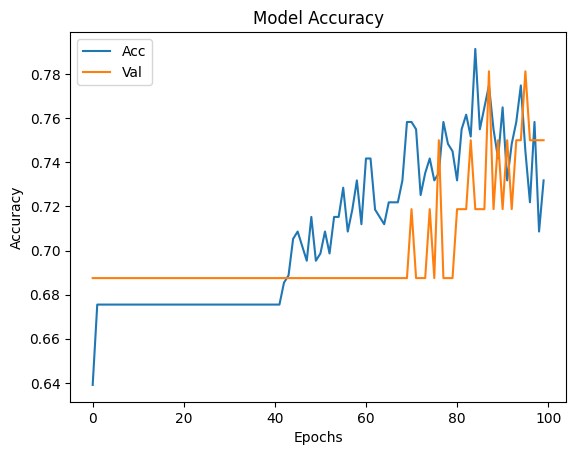

In [7]:
EPOCHS=100
MODELS=["vgg19"]
DROP_OUT=[0.1,0.5]
#DROP_OUT=[0.1]
N_NEURONS=[16,64]
#N_NEURONS=[16]
RUNS=3
for r in range(RUNS):
    for m in MODELS:
        for n_neurons in N_NEURONS:
            for drop_out in DROP_OUT:
                for td,exp_index in zip(t_data, enumerate(t_data)):
                    #t_data --> [tg,vg,labels,filters_name,data_set_name]
                    tg=td[0]
                    vg=td[1]
                    test_gen=td[5]
                    labels=td[2]
                    filters_name=td[3]
                    data_set_name=td[4]
                    
                    mlflow.set_experiment(m+" "+filters_name+" "+data_set_name+" dropout "+str(drop_out)+" n_neurons "+str(n_neurons)+" epochs "+str(EPOCHS))
                    with mlflow.start_run():
                        
                        # #limpiar callbacks del experimento pasado
                        # directory='callbacks'
                        # for filename in os.listdir(directory):
                        #     #print ('callbacks/model.'+str(file)+'.h5')
                        #     f = os.path.join(directory, filename)
                        #     os.remove(f)
                        #     #mlflow.log_artifact(f)
                        
                        mlflow.tensorflow.autolog()
                        model=model_selector(m,labels,n_neurons,drop_out)

                        my_callbacks = [
                            #tf.keras.callbacks.ModelCheckpoint(filepath='callbacks/model.{epoch:02d}.h5')
                            tf.keras.callbacks.ModelCheckpoint(
                            filepath='callbacks/model.h5'
                            ,monitor='val_accuracy'
                            ,verbose=1
                            ,save_weights_only=True
                            ,save_best_only=True
                            ,mode='max')
                        ]

                        history = model.fit(x=tg,validation_data=vg,epochs=EPOCHS,callbacks=my_callbacks)

                        checkpoint_path='callbacks/model.h5'
                        model.load_weights(checkpoint_path)

                        test_evaluate=model.evaluate(test_gen)

                        #Metrics

                        for key in history.history:
                            clean_key=" ".join(re.findall("[a-zA-Z]+", key))
                            mlflow.tensorflow.mlflow.log_metric(clean_key,history.history[key][0])

                        # mlflow.tensorflow.mlflow.log_metric("acc", history.history["accuracy"][0])
                        # mlflow.tensorflow.mlflow.log_metric("val_loss",history.history["val_loss"][0])
                        # mlflow.tensorflow.mlflow.log_metric("val_acc", history.history["val_accuracy"][0])
                        # mlflow.tensorflow.mlflow.log_metric("val_acc", history.history["precision"][0])
                        # mlflow.tensorflow.mlflow.log_metric("val_acc", history.history["recall"][0])

                        mlflow.tensorflow.mlflow.log_metric("test_loss", test_evaluate[0])
                        mlflow.tensorflow.mlflow.log_metric("test_acc", test_evaluate[1])
                        mlflow.tensorflow.mlflow.log_metric("test_precision", test_evaluate[1])
                        mlflow.tensorflow.mlflow.log_metric("test_recall", test_evaluate[1])

                        #Plots
                        plt.clf()
                        plt.plot(history.history['accuracy'])
                        plt.plot(history.history['val_accuracy'])
                        plt.title('Model Accuracy')
                        plt.xlabel('Epochs')
                        plt.ylabel('Accuracy')
                        plt.legend(['Acc','Val'], loc = 'upper left')
                        plt.savefig("Training Plot.png")

                        directory='callbacks'
                        for filename in os.listdir(directory):
                            #print ('callbacks/model.'+str(file)+'.h5')
                            f = os.path.join(directory, filename)
                            mlflow.log_artifact(f)

                        mlflow.log_artifact("Training Plot.png")
                    mlflow.end_run()


In [10]:
checkpoint_path='callbacks/model.h5'
model.load_weights(checkpoint_path)

In [11]:
model.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 300, 300, 3)]     0         
                                                                 
 vgg19 (Functional)          (None, 9, 9, 512)         20024384  
                                                                 
 global_average_pooling2d_3   (None, 512)              0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_6 (Dense)             (None, 16)                8208      
                                                                 
 dropout_3 (Dropout)         (None, 16)                0         
                                                                 
 dense_7 (Dense)             (None, 2)                 34        
                                                           

In [ ]:
directory='callbacks'
for filename in os.listdir(directory):
    #print ('callbacks/model.'+str(file)+'.h5')
    f = os.path.join(directory, filename)
    print(f)

In [ ]:
t_model=model_selector("vgg19",['Monoliosis_Intermedia', 'Sanos'],32,0.1)
my_callbacks = [
    tf.keras.callbacks.ModelCheckpoint(filepath='callbacks/model.{epoch:02d}.h5')
]
history = t_model.fit(x=tg,validation_data=vg,epochs=2,callbacks=my_callbacks)
#test_evaluate=model.evaluate(test_gen)

Epoch 1/2
19/19 [==============================] - 11s 515ms/step - loss: 0.6749 - accuracy: 0.5894 - precision_1: 0.5894 - recall_1: 0.5894 - val_loss: 0.6434 - val_accuracy: 0.6875 - val_precision_1: 0.6875 - val_recall_1: 0.6875
Epoch 2/2
19/19 [==============================] - 9s 465ms/step - loss: 0.6350 - accuracy: 0.6755 - precision_1: 0.6755 - recall_1: 0.6755 - val_loss: 0.6285 - val_accuracy: 0.6875 - val_precision_1: 0.6875 - val_recall_1: 0.6875


In [ ]:
for file in range(1,11):
    print ('callbacks/model.'+str(file)+'.h5')

callbacks/model.1.h5
callbacks/model.2.h5
callbacks/model.3.h5
callbacks/model.4.h5
callbacks/model.5.h5
callbacks/model.6.h5
callbacks/model.7.h5
callbacks/model.8.h5
callbacks/model.9.h5
callbacks/model.10.h5


In [ ]:
type(history.history)

dict

In [ ]:
history.history


{'loss': [0.6790450215339661, 0.6501596570014954],
 'accuracy': [0.5993377566337585, 0.6754966974258423],
 'precision_1': [0.5993377566337585, 0.6754966974258423],
 'recall_1': [0.5993377566337585, 0.6754966974258423],
 'val_loss': [0.6530492901802063, 0.6377032995223999],
 'val_accuracy': [0.6875, 0.6875],
 'val_precision_1': [0.6875, 0.6875],
 'val_recall_1': [0.6875, 0.6875]}

EPOCHS=100
MODELS=["cnn","vgg16","vgg19","xception","ResNet50","MobileNet","ConvNeXtLarge","EfficientNetV2L"]
DROP_OUT=[0.1,0.3,0.5]
N_NEURONS=[16,32,64]
RUNS=3
for r in range(RUNS):
    for m in MODELS:
        for n_neurons in N_NEURONS:
            for drop_out in DROP_OUT:
                for td,exp_index in zip(t_data, enumerate(t_data)):
                    #t_data --> [tg,vg,labels,filters_name,data_set_name]
                    tg=td[0]
                    vg=td[1]
                    labels=td[2]
                    filters_name=td[3]
                    data_set_name=td[4]
                    
                    mlflow.set_experiment(m+" "+filters_name+" "+data_set_name+" dropout "+str(drop_out)+" n_neurons "+str(n_neurons)+" epochs "+str(EPOCHS))
                    with mlflow.start_run():
                        mlflow.tensorflow.autolog()
                        model=model_selector(m,labels,n_neurons,drop_out)
                        history = model.fit(x=tg,validation_data=vg,epochs=EPOCHS)

                        #Metrics

                        mlflow.tensorflow.mlflow.log_metric("loss",history.history["loss"][0])
                        mlflow.tensorflow.mlflow.log_metric("acc", history.history["accuracy"][0])
                        mlflow.tensorflow.mlflow.log_metric("val_loss",history.history["val_loss"][0])
                        mlflow.tensorflow.mlflow.log_metric("val_acc", history.history["val_accuracy"][0])

                        #Plots
                        plt.clf()
                        plt.plot(history.history['accuracy'])
                        plt.plot(history.history['val_accuracy'])
                        plt.title('Model Accuracy')
                        plt.xlabel('Epochs')
                        plt.ylabel('Accuracy')
                        plt.legend(['Acc','Val'], loc = 'upper left')
                        plt.savefig("Training Plot.png")
                        mlflow.log_artifact("Training Plot.png")
                    mlflow.end_run()